# Variational Autoencoder (VAE)

In [1]:
import numpy as np
import os
from cv2 import imread, resize
import pandas as pd
import cv2
def fetch_lfw_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      raw_images_name = "lfw",
                      use_raw=False,
                      dx=80,dy=80,
                      dimx=45,dimy=45
    ):#sad smile

    #download if not exists
    if (not use_raw) and not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)

    if use_raw and not os.path.exists(raw_images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(raw_images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s"%attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,)
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])
    df_attrs.imagenum = df_attrs.imagenum.astype(np.int64)


    #read photos
    dirname = raw_images_name if use_raw else images_name
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(dirname):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)

    #mass-merge
    #(photos now have same order as attributes)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    #image preprocessing
    all_photos = df['photo_path'].apply(imread)\
                                 .apply(lambda img: img[dy:-dy,dx:-dx])\
                                 .apply(lambda img: resize(img, (dimx, dimy)))

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)

    return all_photos,all_attrs

Useful links:
* Original paper http://arxiv.org/abs/1312.6114
* Helpful videos explaining the topic
   * https://www.youtube.com/watch?v=P78QYjWh5sM     
   * http://videolectures.net/deeplearning2015_courville_autoencoder_extension/?q=aaron%20courville

In this homework we will train an autoencoder to model images of faces. For this we take "Labeled Faces in the Wild" dataset [http://vis-www.cs.umass.edu/lfw/](http://vis-www.cs.umass.edu/lfw/), deep funneled version of it. (frontal view of all faces)


## Prepare the data

In [2]:
import os
import numpy as np
import tensorflow as tf
import tensorflow.keras.layers as L
import tensorflow.keras.initializers as I
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
# The following code fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind


data, attrs = fetch_lfw_dataset()

images not found, donwloading...
extracting...
done
attributes not found, downloading...
done


In [4]:
print(attrs.shape)
print(data.shape)
attrs.head()

(13143, 73)
(13143, 45, 45, 3)


,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,...,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,1.568346,-1.889043,1.737203,-0.929729,-1.471799,-0.19558,-0.835609,-0.351468,-1.012533,-0.719593,...,0.361738,1.166118,-1.164916,-1.13999,-2.371746,-1.299932,-0.414682,-1.144902,0.694007,-0.826609
1,0.169851,-0.982408,0.422709,-1.282184,-1.36006,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,...,-0.832036,-0.39768,0.87416,-0.945431,-0.268649,-0.006244,-0.030406,-0.480128,0.66676,-0.496559
2,0.997749,-1.364195,-0.157377,-0.756447,-1.891825,-0.871526,-0.862893,0.031445,-1.341523,-0.090037,...,1.549743,1.884745,-0.999765,-1.359858,-1.912108,-1.095634,0.915126,-0.572332,0.144262,-0.841231
3,1.122719,-1.997799,1.916144,-2.514214,-2.580071,-1.404239,0.057551,0.000196,-1.273512,-1.431462,...,0.567822,-0.176089,1.108125,-1.600944,-3.264613,0.813418,0.308631,-0.848693,0.475941,-0.447025
4,1.078214,-2.008098,1.676211,-2.278056,-2.651845,-1.348408,0.649089,0.017656,-1.889111,-1.857213,...,-1.461474,-0.955283,0.119113,-1.128176,-3.161048,0.08268,-0.439614,-0.359859,-0.760774,-0.410152


In [5]:
new_data = []
for i in range(data.shape[0]):
    new_data.append( cv2.cvtColor(data[i], cv2.COLOR_BGR2RGB))

In [6]:
new_data = np.array(new_data)

In [7]:
new_data.shape

(13143, 45, 45, 3)

In [8]:
data = new_data

In [9]:
X_train = data[:10000].reshape((10000, -1))
print(X_train.shape)
X_val = data[10000:].reshape((-1, X_train.shape[1]))
print(X_val.shape)

image_h = data.shape[1]
image_w = data.shape[2]

(10000, 6075)
(3143, 6075)


For simplicity we want all values of the data to lie in the interval $[0,1]$:

In [10]:
X_train = np.float32(X_train)
X_train = X_train/255
X_val = np.float32(X_val)
X_val = X_val/255

In [11]:
def plot_gallery(images, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.5 * n_col, 1.7 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=-1, vmax=1, interpolation='nearest')
        plt.xticks(())
        plt.yticks(())

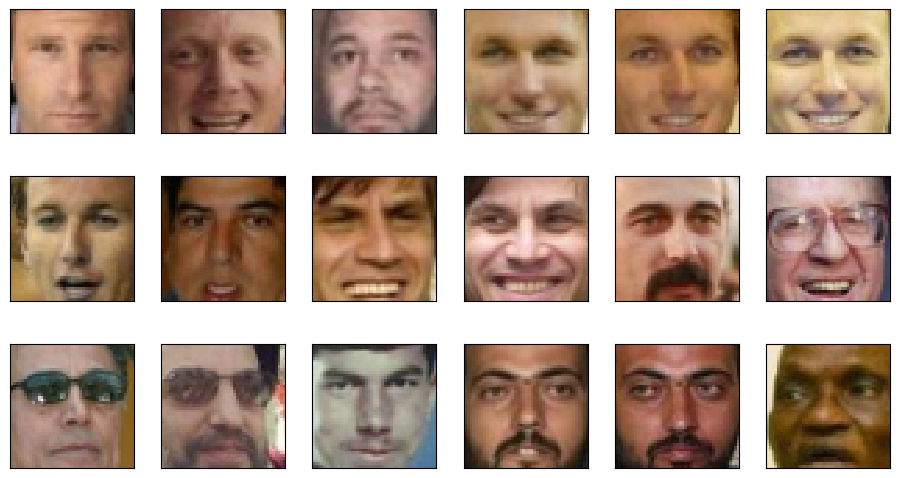

In [12]:
plot_gallery(X_train, image_h, image_w)

# Autoencoder

Why to use all this complicated formulaes and regularizations, what is the need for variational inference? To analyze the difference, let's first train just an autoencoder on the data:


<img src="/content/Autoencoder_structure.jpg">

In [ ]:
dimZ = 100 # Considering face reconstruction task, which size of representation seems reasonable?

# You can define the decoder and encoder as networks with one hidden fc-layer
# (that means you will have 2 fc layers in each net)
# Use ReLU for hidden layers' activations
# GlorotUniform initialization for W
# Zero initialization for biases
# It's also convenient to put sigmoid activation on output layer to get nice normalized pics

# However, you can just have 1 fc layer in each network without any activation,
# and it will also show some results

vanila_encoder = tf.keras.Sequential()
vanila_encoder.add(L.Dense(4*dimZ, activation='relu', kernel_initializer=I.GlorotUniform()))
vanila_encoder.add(L.Dense(dimZ, kernel_initializer=I.GlorotUniform()))
vanila_decoder = tf.keras.Sequential()
vanila_decoder.add(L.Dense(4*dimZ, activation='relu', kernel_initializer=I.GlorotUniform()))
vanila_decoder.add(L.Dense(X_train.shape[1], activation='sigmoid', kernel_initializer=I.GlorotUniform()))

model = tf.keras.Sequential()
model.add(vanila_encoder)
model.add(vanila_decoder)

2023-07-13 17:01:18.187314: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-13 17:01:18.199607: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-13 17:01:18.199715: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [13]:
class DisplayCallback(tf.keras.callbacks.Callback):
    def __init__(self, model, rate):
        super(DisplayCallback, self).__init__()
        self.model = model
        self.rate = rate

    def on_epoch_end(self, epoch, logs=None):
        model = self.model
        if epoch % self.rate == 0:
            idx = np.random.choice(X_train.shape[0])
            plt.subplot(221)
            plt.imshow(X_train[idx].reshape(
                (image_h, image_w, 3)
            ))
            plt.subplot(222)
            plt.imshow(tf.reshape(
                model(X_train[tf.newaxis, idx]), (image_h, image_w, 3)
            ))
            idx = np.random.choice(X_val.shape[0])
            plt.subplot(223)
            plt.imshow(X_val[idx].reshape(
                (image_h, image_w, 3)
            ))
            plt.subplot(224)
            plt.imshow(tf.reshape(
                model(X_val[tf.newaxis, idx]), (image_h, image_w, 3)
            ))
            plt.show()

In [ ]:
# Create MSE loss function
loss = tf.keras.losses.mean_squared_error
# Use Adam optimizer
opt = tf.keras.optimizers.Adam()
model.compile(loss=loss, optimizer=opt)
callback = DisplayCallback(model, 10)

In [ ]:
model.build(input_shape=X_train.shape)

Epoch 1/30
309/313 [============================>.] - ETA: 0s - loss: 0.0172

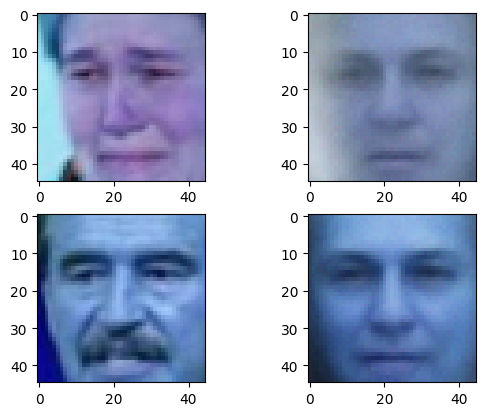

313/313 [==============================] - 4s 7ms/step - loss: 0.0171 - val_loss: 0.0135
Epoch 2/30
313/313 [==============================] - 1s 4ms/step - loss: 0.0111 - val_loss: 0.0098
Epoch 3/30
313/313 [==============================] - 1s 4ms/step - loss: 0.0085 - val_loss: 0.0072
Epoch 4/30
313/313 [==============================] - 2s 5ms/step - loss: 0.0067 - val_loss: 0.0062
Epoch 5/30
313/313 [==============================] - 2s 6ms/step - loss: 0.0061 - val_loss: 0.0059
Epoch 6/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0057 - val_loss: 0.0056
Epoch 7/30
313/313 [==============================] - 1s 4ms/step - loss: 0.0054 - val_loss: 0.0053
Epoch 8/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0052 - val_loss: 0.0055
Epoch 9/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0051 - val_loss: 0.0052
Epoch 10/30
313/313 [==============================] - 2s 5ms/step - loss: 0.0049 - val_loss: 0.0050
Epoch 11/3

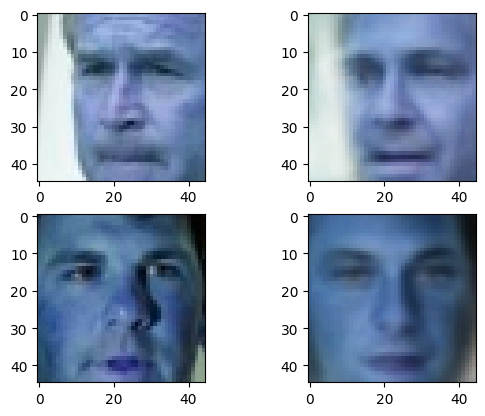

313/313 [==============================] - 2s 6ms/step - loss: 0.0048 - val_loss: 0.0048
Epoch 12/30
313/313 [==============================] - 2s 6ms/step - loss: 0.0047 - val_loss: 0.0048
Epoch 13/30
313/313 [==============================] - 2s 6ms/step - loss: 0.0046 - val_loss: 0.0049
Epoch 14/30
313/313 [==============================] - 2s 5ms/step - loss: 0.0046 - val_loss: 0.0048
Epoch 15/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0045 - val_loss: 0.0047
Epoch 16/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0045 - val_loss: 0.0048
Epoch 17/30
313/313 [==============================] - 2s 5ms/step - loss: 0.0044 - val_loss: 0.0050
Epoch 18/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0044 - val_loss: 0.0046
Epoch 19/30
313/313 [==============================] - 2s 5ms/step - loss: 0.0044 - val_loss: 0.0048
Epoch 20/30
313/313 [==============================] - 2s 6ms/step - loss: 0.0044 - val_loss: 0.0047
Ep

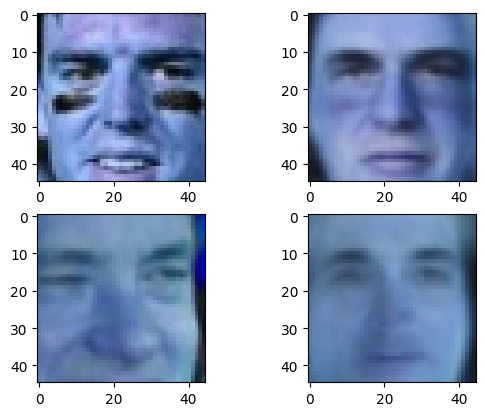

313/313 [==============================] - 2s 7ms/step - loss: 0.0044 - val_loss: 0.0048
Epoch 22/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0043 - val_loss: 0.0048
Epoch 23/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0043 - val_loss: 0.0048
Epoch 24/30
313/313 [==============================] - 2s 5ms/step - loss: 0.0043 - val_loss: 0.0049
Epoch 25/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0043 - val_loss: 0.0048
Epoch 26/30
313/313 [==============================] - 2s 5ms/step - loss: 0.0043 - val_loss: 0.0046
Epoch 27/30
313/313 [==============================] - 1s 5ms/step - loss: 0.0042 - val_loss: 0.0048
Epoch 28/30
313/313 [==============================] - 2s 6ms/step - loss: 0.0043 - val_loss: 0.0046
Epoch 29/30
313/313 [==============================] - 2s 6ms/step - loss: 0.0043 - val_loss: 0.0050
Epoch 30/30
313/313 [==============================] - 2s 5ms/step - loss: 0.0042 - val_loss: 0.0046


In [ ]:
# Train your autoencoder
# Add validation data
# Visualize progress in reconstruction and loss decay
history = model.fit(
    X_train, X_train,
    epochs=30,
    validation_data = (X_val, X_val),
    callbacks=[callback]
)

Plot your loss values (also metrics, if you used them) for train and validation data

KeyError: ignored

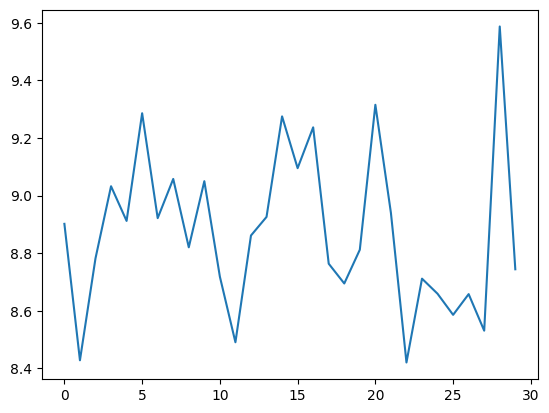

In [ ]:
plt.plot(np.arange(30), history.history['loss'])
plt.plot(np.arange(30), history.history['val_loss'])
plt.show()

# Sampling

Let's now sample several latent vectors and perform inference from $z$, reconstruct an image given some random $z$ representations.

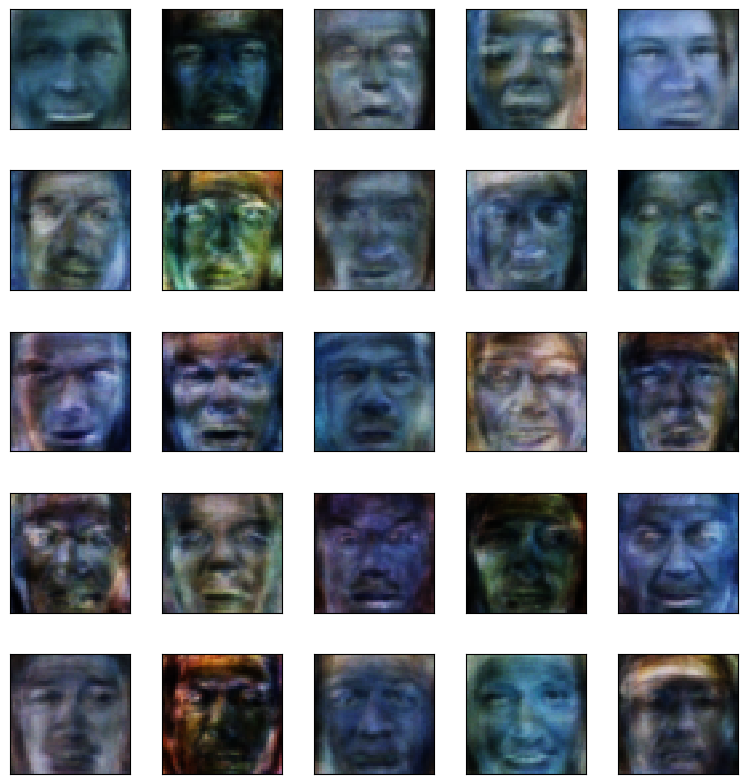

In [ ]:
z = np.random.randn(25, dimZ)
output = vanila_decoder(z).numpy()
plot_gallery(output, image_h, image_w, n_row=5, n_col=5)

# Homework: Variational Autoencoder

In [ ]:
X_train[0].shape

(6075,)

Bayesian approach in deep learning considers everything in terms of distributions. Now our encoder generates not just a vector $z$ but posterior ditribution $q(z|x)$. In our case distribution $q$ is Gaussian distibution $N(\mu, \sigma)$ with parameters $\mu$, $\sigma$. Technically, the first difference is that you need to split bottleneck layer in two. One dense layer will generate vector $\mu$, and another will generate vector $\sigma$. Reparametrization trick should be implemented using the **gaussian_sampler**, that generates random vetor $\epsilon$ and returns $\mu+\sigma\epsilon \sim N(\mu, \sigma)$ .

Since our decoder is also a function that generates distribution, we need to do the same splitting for output layer. When testing the model we will look only on mean values, so one of the output will be actual autoencoder output.

In this homework we only ask for implementation of the simplest version of VAE - one $z$ sample per input. You can consider to sample several outputs from one input and average them.

In [32]:
# to compare with conventional AE, keep these hyperparameters
# or change them for the values that you used before
dimZ = 100

# define the network
# you can start from pytorch example https://github.com/pytorch/examples/blob/master/vae/main.py
# or Theano-based examples here https://github.com/Lasagne/Recipes/blob/master/examples/variational_autoencoder/variational_autoencoder.py
# and here https://github.com/y0ast/Variational-Autoencoder/blob/master/VAE.py
# but remember that this is not your ground truth since the data is not MNIST
input_shape = X_train.shape[1]
input = L.Input(input_shape,name = 'encoder_input',)
x = L.Dense(2 * dimZ)(input)
x = L.LeakyReLU(alpha=0.1)(x)
x = L.Dense(dimZ, name = 'third_layer')(x)
x = L.LeakyReLU(alpha = 0.1)(x)
mean = L.Dense(dimZ,name='mean')(x)
log_var = L.Dense(dimZ,name='var')(x)


def reparam(params):
  mean,log_var = params
  sample =  tf.keras.backend.random_normal(shape = tf.shape(mean))
  return tf.exp(log_var/2)*sample + mean

z = L.Lambda(reparam,name='encoder_out')([mean,log_var])



encoder = tf.keras.Model(input, [mean,log_var,z]) # output should be mean, variance and a sample

input_dec = L.Input(dimZ,name = 'decoder_input')
t = L.Dense(dimZ,name = 'first_dec_layer')(input_dec)
t = L.LeakyReLU(0.1)(t)
t = L.Dense(2 * dimZ,activation = 'relu')(t)
t = L.LeakyReLU(0.1)(t)
output = L.Dense(input_shape, name = 'last_decoding_layer',activation = 'sigmoid')(t)
decoder = tf.keras.Model(input_dec, [output])

In [33]:
encoder.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoder_input (InputLayer)     [(None, 6075)]       0           []                               
                                                                                                  
 dense_4 (Dense)                (None, 200)          1215200     ['encoder_input[0][0]']          
                                                                                                  
 leaky_re_lu_8 (LeakyReLU)      (None, 200)          0           ['dense_4[0][0]']                
                                                                                                  
 third_layer (Dense)            (None, 100)          20100       ['leaky_re_lu_8[0][0]']          
                                                                                            

In [34]:
decoder.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 decoder_input (InputLayer)  [(None, 100)]             0         
                                                                 
 first_dec_layer (Dense)     (None, 100)               10100     
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 100)               0         
                                                                 
 dense_5 (Dense)             (None, 200)               20200     
                                                                 
 leaky_re_lu_11 (LeakyReLU)  (None, 200)               0         
                                                                 
 last_decoding_layer (Dense)  (None, 6075)             1221075   
                                                                 
Total params: 1,251,375
Trainable params: 1,251,375
Non-tra

And the last, but not least! Place in the code where the most of the formulaes goes to - optimization objective. The objective for VAE has it's own name - variational lowerbound. And as for any lowerbound our intention is to maximize it. Here it is (for one sample $z$ per input $x$):

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p_{\theta}(z)) + \log p_{\theta}(x|z)$$

Your next task is to implement two functions that compute KL-divergence and the second term - log-likelihood of an output. Here is some necessary math for your convenience:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$
$$\log p_{\theta}(x|z) = \sum_{i=1}^{dimX}\log p_{\theta}(x_i|z)=\sum_{i=1}^{dimX} \log \Big( \frac{1}{\sigma_i\sqrt{2\pi}}e^{-\frac{(\mu_I-x)^2}{2\sigma_i^2}} \Big)=...$$

In [35]:
class VAE(tf.keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = tf.metrics.Mean(name = "loss")
        self.reconstruction_loss_tracker  = tf.metrics.Mean(name = "reconstruction_loss")
        self.kl_loss_tracker = tf.metrics.Mean(name = "kl_loss")

    @tf.function
    def KL_divergence(self, mu, logsigma):
      # return -.5 * tf.keras.backend.mean(1 + logsigma - tf.keras.backend.square(mu)  - tf.keras.backend.exp(logsigma)   )
      return tf.reduce_mean(tf.reduce_sum(-0.5 * (1 + logsigma - tf.square(mu) - tf.exp(logsigma)),axis = 1))


    @tf.function
    def log_likelihood(self, x, z):
      return tf.reduce_mean(tf.reduce_sum(tf.square(x - self.decoder(z)),axis = -1))
    def train_step(self, data):
      with tf.GradientTape() as tape:
        mean,log_var,z = self.encoder(data)
        # rec = self.decoder(z)
        loss = self.KL_divergence(mean,log_var) + self.log_likelihood(data,z)
      grads = tape.gradient(loss,self.trainable_weights)
      self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
      return {
          'loss' : loss
      }

    def call(self, inputs):
      mean,log_var,z = self.encoder(inputs)

      decoded = self.decoder(z)
      rec_loss = self.log_likelihood(inputs,z)
      kl = self.KL_divergence(mean,log_var)
      loss = rec_loss + kl

      self.kl_loss_tracker.update_state(kl)
      self.reconstruction_loss_tracker.update_state(rec_loss)
      self.total_loss_tracker.update_state(loss)


      return self.decoder(self.encoder(inputs)[2])

In [36]:
vae = VAE(encoder, decoder)
vae.compile(optimizer=tf.keras.optimizers.Adam())
callback = DisplayCallback(vae, 2)

And train the model:

Epoch 1/500
5/5 [==============================] - ETA: 0s - loss: 77.6567

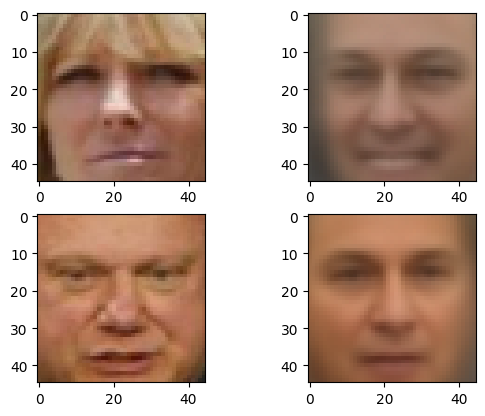

5/5 [==============================] - 1s 253ms/step - loss: 77.6567 - val_loss: 79.8349 - val_reconstruction_loss: 65.4914 - val_kl_loss: 14.3435
Epoch 2/500
5/5 [==============================] - 0s 69ms/step - loss: 79.8225 - val_loss: 78.6199 - val_reconstruction_loss: 64.8196 - val_kl_loss: 13.8004
Epoch 3/500
5/5 [==============================] - ETA: 0s - loss: 76.8747

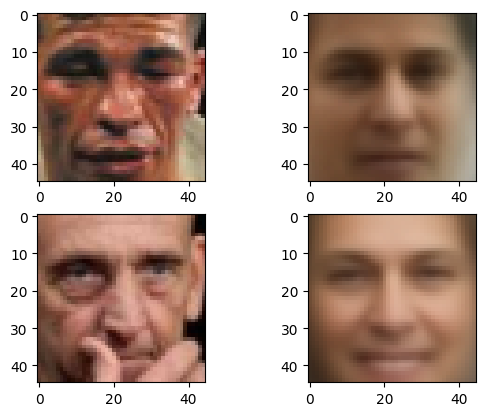

5/5 [==============================] - 1s 197ms/step - loss: 76.8747 - val_loss: 76.6791 - val_reconstruction_loss: 62.0939 - val_kl_loss: 14.5852
Epoch 4/500
5/5 [==============================] - 0s 72ms/step - loss: 76.2495 - val_loss: 76.6255 - val_reconstruction_loss: 62.2964 - val_kl_loss: 14.3291
Epoch 5/500
5/5 [==============================] - ETA: 0s - loss: 77.6041

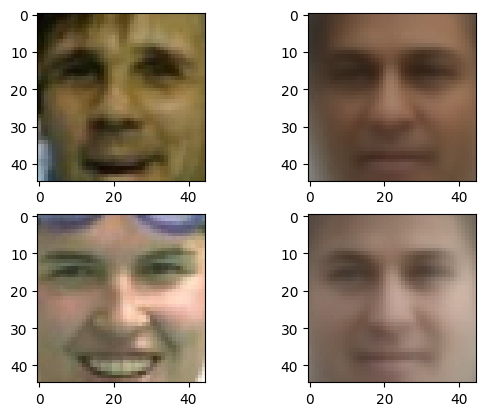

5/5 [==============================] - 1s 198ms/step - loss: 77.6041 - val_loss: 76.7142 - val_reconstruction_loss: 62.3307 - val_kl_loss: 14.3835
Epoch 6/500
5/5 [==============================] - 0s 71ms/step - loss: 77.2930 - val_loss: 76.9863 - val_reconstruction_loss: 62.9241 - val_kl_loss: 14.0622
Epoch 7/500
4/5 [=======================>......] - ETA: 0s - loss: 79.3882

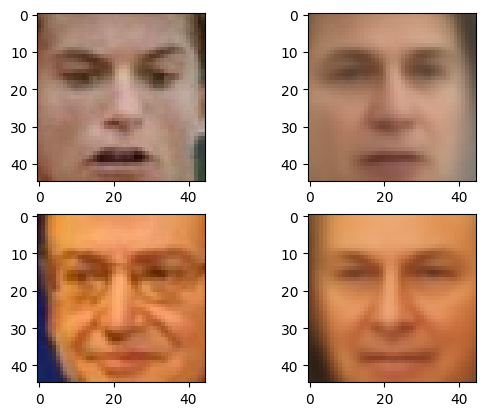

5/5 [==============================] - 1s 200ms/step - loss: 76.0092 - val_loss: 76.0598 - val_reconstruction_loss: 61.9054 - val_kl_loss: 14.1544
Epoch 8/500
5/5 [==============================] - 0s 64ms/step - loss: 76.3555 - val_loss: 77.2203 - val_reconstruction_loss: 63.3861 - val_kl_loss: 13.8343
Epoch 9/500
5/5 [==============================] - ETA: 0s - loss: 76.8591

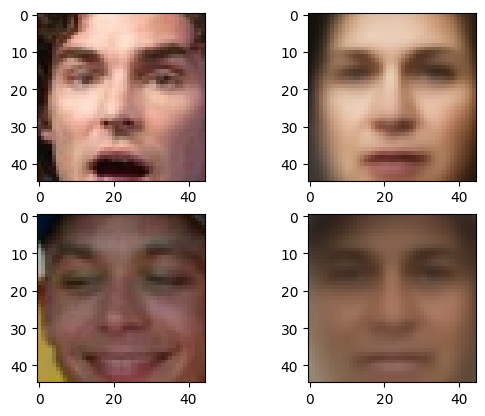

5/5 [==============================] - 1s 186ms/step - loss: 76.8591 - val_loss: 76.1855 - val_reconstruction_loss: 61.9385 - val_kl_loss: 14.2469
Epoch 10/500
5/5 [==============================] - 0s 84ms/step - loss: 74.8091 - val_loss: 75.7411 - val_reconstruction_loss: 61.7033 - val_kl_loss: 14.0378
Epoch 11/500
5/5 [==============================] - ETA: 0s - loss: 75.9435

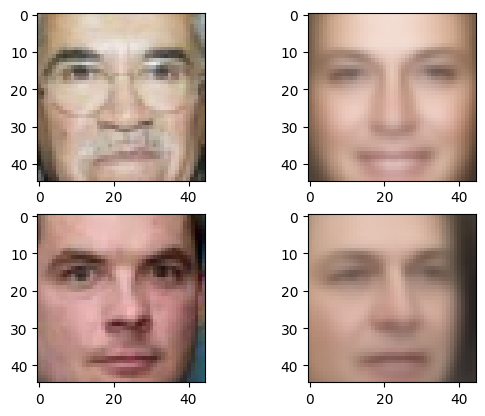

5/5 [==============================] - 1s 184ms/step - loss: 75.9435 - val_loss: 75.2002 - val_reconstruction_loss: 61.0595 - val_kl_loss: 14.1407
Epoch 12/500
5/5 [==============================] - 0s 84ms/step - loss: 74.6805 - val_loss: 75.7245 - val_reconstruction_loss: 61.3423 - val_kl_loss: 14.3822
Epoch 13/500
4/5 [=======================>......] - ETA: 0s - loss: 76.3689

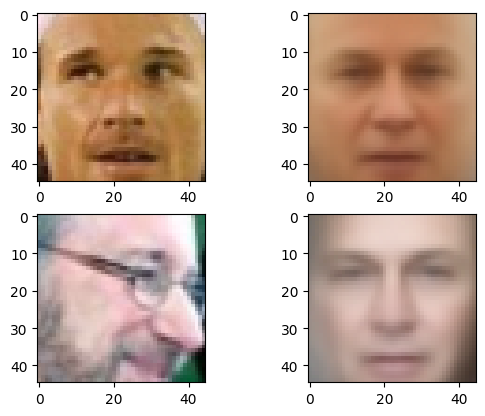

5/5 [==============================] - 1s 200ms/step - loss: 74.7476 - val_loss: 75.6313 - val_reconstruction_loss: 61.3928 - val_kl_loss: 14.2386
Epoch 14/500
5/5 [==============================] - 0s 86ms/step - loss: 75.4628 - val_loss: 75.6552 - val_reconstruction_loss: 61.4673 - val_kl_loss: 14.1879
Epoch 15/500
5/5 [==============================] - ETA: 0s - loss: 76.1300

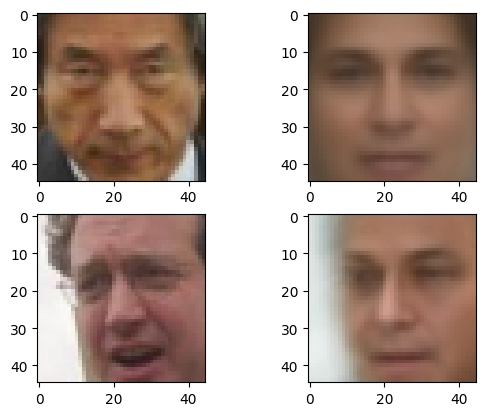

5/5 [==============================] - 1s 191ms/step - loss: 76.1300 - val_loss: 75.2831 - val_reconstruction_loss: 61.1625 - val_kl_loss: 14.1206
Epoch 16/500
5/5 [==============================] - 0s 87ms/step - loss: 74.1360 - val_loss: 75.6102 - val_reconstruction_loss: 61.6116 - val_kl_loss: 13.9986
Epoch 17/500
5/5 [==============================] - ETA: 0s - loss: 76.4148

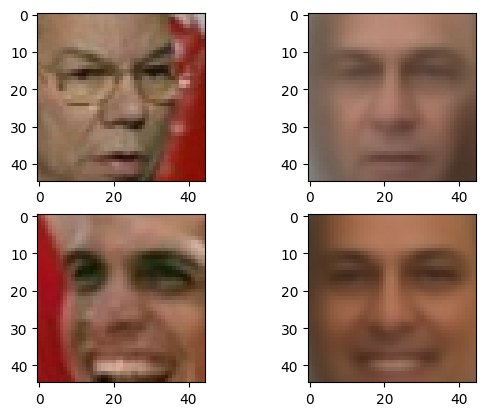

5/5 [==============================] - 1s 267ms/step - loss: 76.4148 - val_loss: 76.6233 - val_reconstruction_loss: 62.3568 - val_kl_loss: 14.2666
Epoch 18/500
5/5 [==============================] - 0s 106ms/step - loss: 75.0584 - val_loss: 75.4028 - val_reconstruction_loss: 61.1440 - val_kl_loss: 14.2589
Epoch 19/500
5/5 [==============================] - ETA: 0s - loss: 75.4828

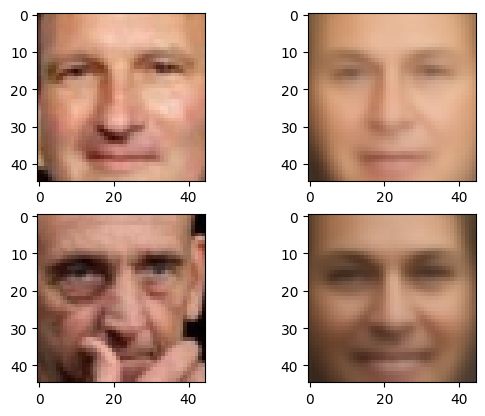

5/5 [==============================] - 1s 266ms/step - loss: 75.4828 - val_loss: 75.1464 - val_reconstruction_loss: 60.8975 - val_kl_loss: 14.2488
Epoch 20/500
5/5 [==============================] - 0s 83ms/step - loss: 75.1132 - val_loss: 74.9361 - val_reconstruction_loss: 60.8396 - val_kl_loss: 14.0965
Epoch 21/500
4/5 [=======================>......] - ETA: 0s - loss: 75.7500

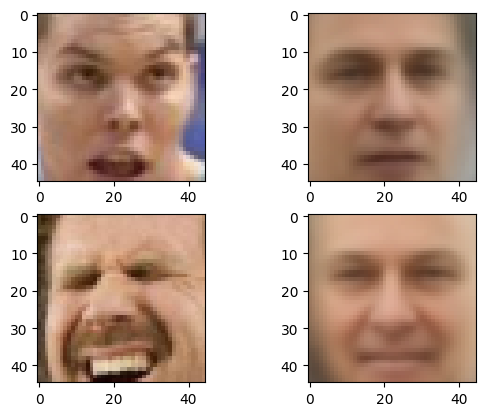

5/5 [==============================] - 1s 263ms/step - loss: 74.6834 - val_loss: 75.0725 - val_reconstruction_loss: 60.8272 - val_kl_loss: 14.2453
Epoch 22/500
5/5 [==============================] - 0s 70ms/step - loss: 74.8575 - val_loss: 74.8058 - val_reconstruction_loss: 60.7625 - val_kl_loss: 14.0433
Epoch 23/500
5/5 [==============================] - ETA: 0s - loss: 74.2548

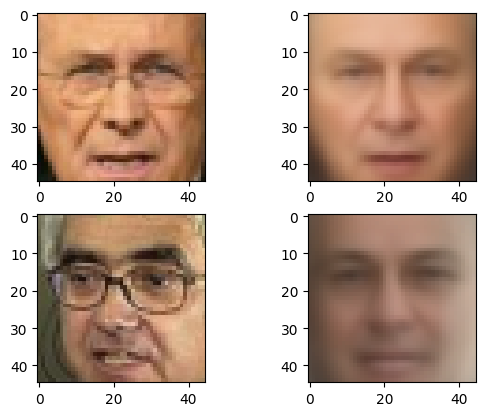

5/5 [==============================] - 1s 200ms/step - loss: 74.2548 - val_loss: 75.1965 - val_reconstruction_loss: 60.9554 - val_kl_loss: 14.2411
Epoch 24/500
5/5 [==============================] - 0s 72ms/step - loss: 76.3553 - val_loss: 75.6016 - val_reconstruction_loss: 61.6558 - val_kl_loss: 13.9458
Epoch 25/500
5/5 [==============================] - ETA: 0s - loss: 75.1637

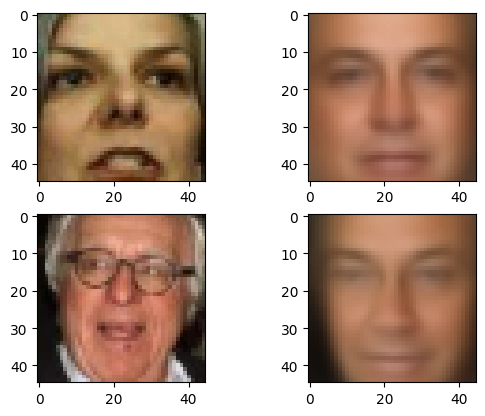

5/5 [==============================] - 1s 197ms/step - loss: 75.1637 - val_loss: 75.7854 - val_reconstruction_loss: 61.7874 - val_kl_loss: 13.9980
Epoch 26/500
5/5 [==============================] - 0s 66ms/step - loss: 75.1615 - val_loss: 75.2534 - val_reconstruction_loss: 61.2821 - val_kl_loss: 13.9713
Epoch 27/500
4/5 [=======================>......] - ETA: 0s - loss: 75.2937

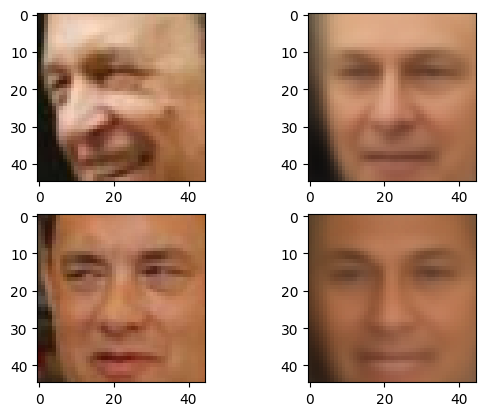

5/5 [==============================] - 1s 186ms/step - loss: 75.3137 - val_loss: 75.8271 - val_reconstruction_loss: 61.3106 - val_kl_loss: 14.5165
Epoch 28/500
5/5 [==============================] - 0s 79ms/step - loss: 74.6260 - val_loss: 74.9094 - val_reconstruction_loss: 60.6613 - val_kl_loss: 14.2481
Epoch 29/500
4/5 [=======================>......] - ETA: 0s - loss: 75.1390

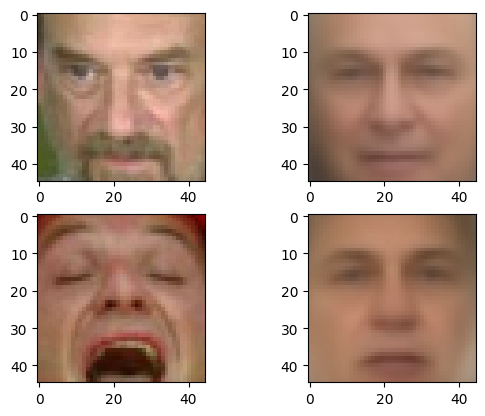

5/5 [==============================] - 1s 188ms/step - loss: 75.5985 - val_loss: 78.8666 - val_reconstruction_loss: 64.2007 - val_kl_loss: 14.6659
Epoch 30/500
5/5 [==============================] - 0s 77ms/step - loss: 83.1199 - val_loss: 79.8553 - val_reconstruction_loss: 65.9908 - val_kl_loss: 13.8646
Epoch 31/500
5/5 [==============================] - ETA: 0s - loss: 81.5284

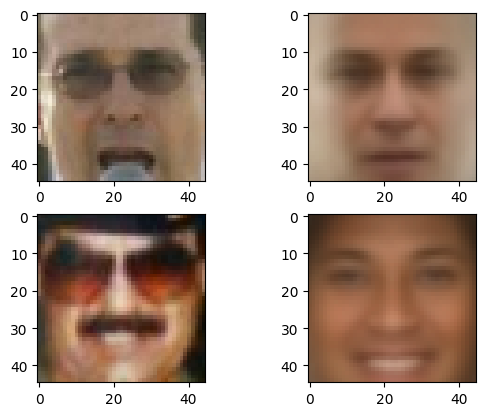

5/5 [==============================] - 1s 188ms/step - loss: 81.5284 - val_loss: 85.4945 - val_reconstruction_loss: 70.8321 - val_kl_loss: 14.6624
Epoch 32/500
5/5 [==============================] - 0s 89ms/step - loss: 79.2142 - val_loss: 78.9964 - val_reconstruction_loss: 64.6877 - val_kl_loss: 14.3087
Epoch 33/500
4/5 [=======================>......] - ETA: 0s - loss: 79.1685

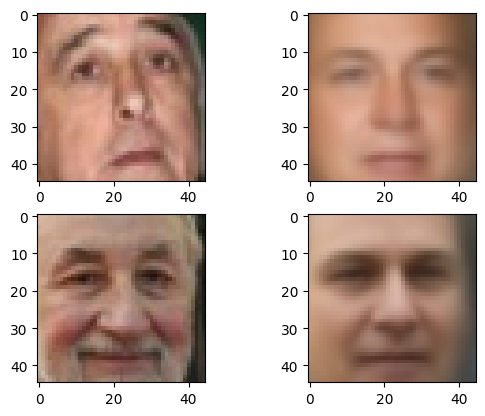

5/5 [==============================] - 1s 189ms/step - loss: 79.7544 - val_loss: 77.6175 - val_reconstruction_loss: 63.5556 - val_kl_loss: 14.0619
Epoch 34/500
5/5 [==============================] - 0s 84ms/step - loss: 78.5578 - val_loss: 76.3420 - val_reconstruction_loss: 62.2856 - val_kl_loss: 14.0564
Epoch 35/500
5/5 [==============================] - ETA: 0s - loss: 76.7134

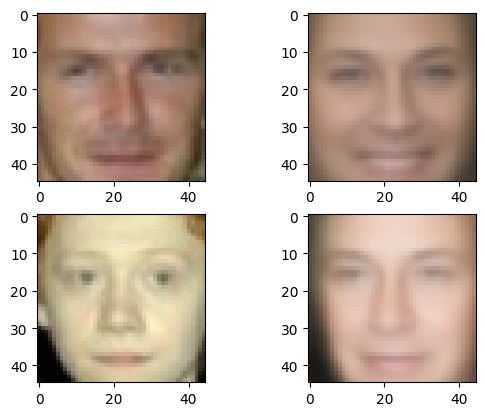

5/5 [==============================] - 1s 195ms/step - loss: 76.7134 - val_loss: 76.3461 - val_reconstruction_loss: 62.0499 - val_kl_loss: 14.2962
Epoch 36/500
5/5 [==============================] - 0s 94ms/step - loss: 76.3688 - val_loss: 75.4138 - val_reconstruction_loss: 61.3639 - val_kl_loss: 14.0499
Epoch 37/500
5/5 [==============================] - ETA: 0s - loss: 74.9919

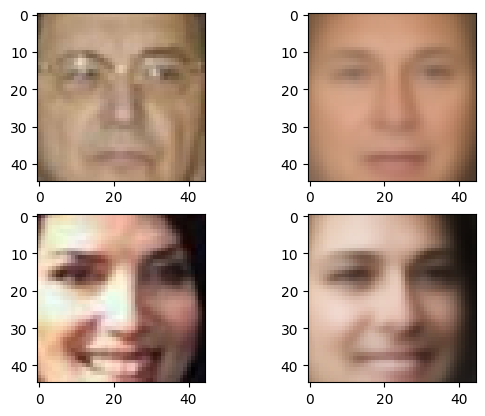

5/5 [==============================] - 1s 313ms/step - loss: 74.9919 - val_loss: 75.0290 - val_reconstruction_loss: 60.9120 - val_kl_loss: 14.1170
Epoch 38/500
5/5 [==============================] - 0s 109ms/step - loss: 75.4943 - val_loss: 75.3953 - val_reconstruction_loss: 61.3088 - val_kl_loss: 14.0865
Epoch 39/500
5/5 [==============================] - ETA: 0s - loss: 74.7617

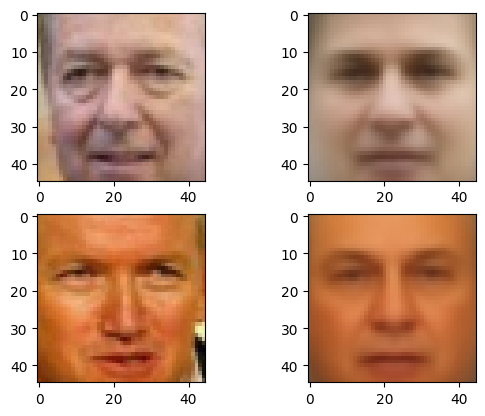

5/5 [==============================] - 1s 217ms/step - loss: 74.7617 - val_loss: 75.1914 - val_reconstruction_loss: 60.8440 - val_kl_loss: 14.3474
Epoch 40/500
5/5 [==============================] - 0s 88ms/step - loss: 74.0120 - val_loss: 74.8659 - val_reconstruction_loss: 60.6257 - val_kl_loss: 14.2402
Epoch 41/500
4/5 [=======================>......] - ETA: 0s - loss: 76.8479

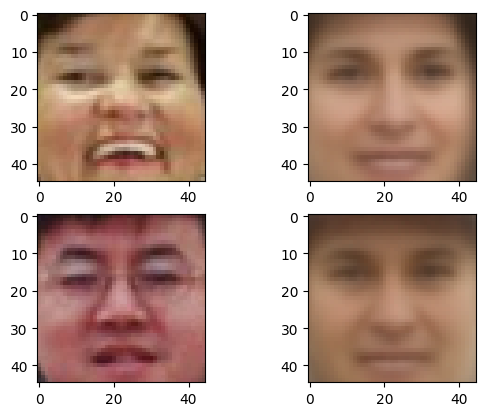

5/5 [==============================] - 1s 201ms/step - loss: 75.6329 - val_loss: 75.3333 - val_reconstruction_loss: 61.3752 - val_kl_loss: 13.9581
Epoch 42/500
5/5 [==============================] - 0s 89ms/step - loss: 76.3995 - val_loss: 75.1969 - val_reconstruction_loss: 61.3189 - val_kl_loss: 13.8780
Epoch 43/500
4/5 [=======================>......] - ETA: 0s - loss: 74.3470

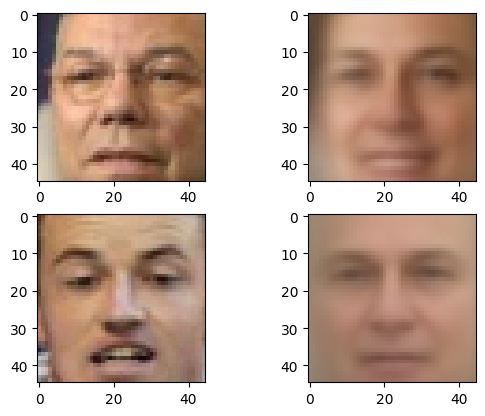

5/5 [==============================] - 1s 257ms/step - loss: 74.1406 - val_loss: 74.5196 - val_reconstruction_loss: 60.4684 - val_kl_loss: 14.0512
Epoch 44/500
5/5 [==============================] - 0s 89ms/step - loss: 74.2122 - val_loss: 74.4885 - val_reconstruction_loss: 60.3112 - val_kl_loss: 14.1773
Epoch 45/500
5/5 [==============================] - ETA: 0s - loss: 75.1463

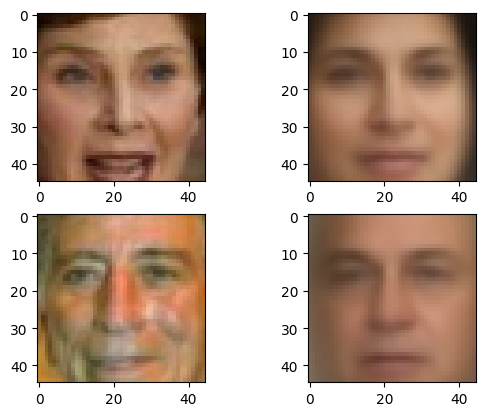

5/5 [==============================] - 1s 191ms/step - loss: 75.1463 - val_loss: 74.5007 - val_reconstruction_loss: 60.2991 - val_kl_loss: 14.2016
Epoch 46/500
5/5 [==============================] - 0s 74ms/step - loss: 75.9666 - val_loss: 75.7358 - val_reconstruction_loss: 61.7232 - val_kl_loss: 14.0126
Epoch 47/500
5/5 [==============================] - ETA: 0s - loss: 73.0484

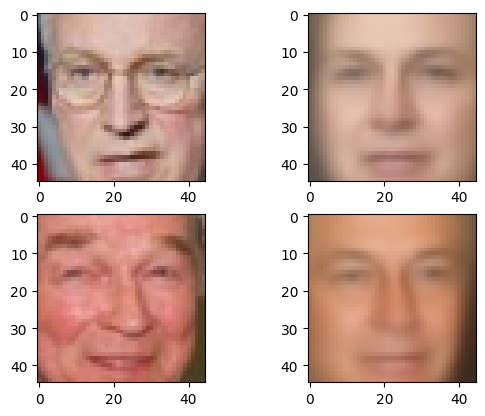

5/5 [==============================] - 1s 202ms/step - loss: 73.0484 - val_loss: 74.6961 - val_reconstruction_loss: 60.5491 - val_kl_loss: 14.1470
Epoch 48/500
5/5 [==============================] - 0s 70ms/step - loss: 75.7772 - val_loss: 74.2787 - val_reconstruction_loss: 60.0381 - val_kl_loss: 14.2407
Epoch 49/500
5/5 [==============================] - ETA: 0s - loss: 75.3685

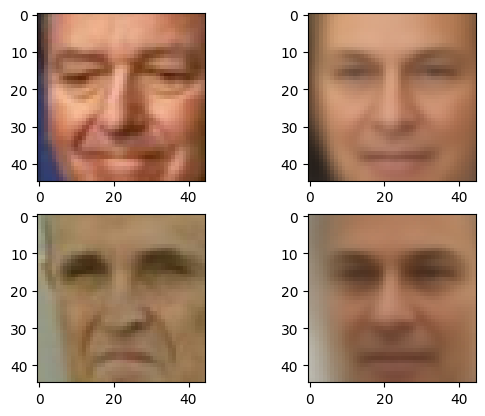

5/5 [==============================] - 1s 211ms/step - loss: 75.3685 - val_loss: 75.3318 - val_reconstruction_loss: 61.0077 - val_kl_loss: 14.3240
Epoch 50/500
5/5 [==============================] - 0s 84ms/step - loss: 75.2465 - val_loss: 74.4871 - val_reconstruction_loss: 60.2632 - val_kl_loss: 14.2239
Epoch 51/500
5/5 [==============================] - ETA: 0s - loss: 73.8976

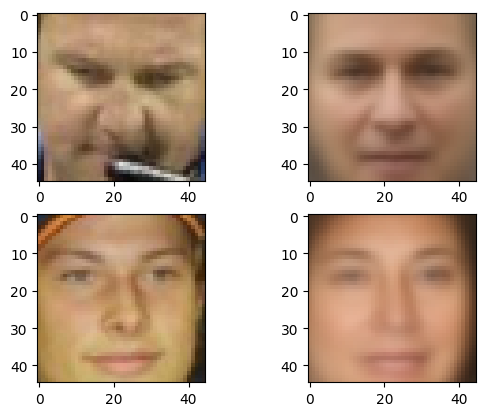

5/5 [==============================] - 1s 181ms/step - loss: 73.8976 - val_loss: 74.5911 - val_reconstruction_loss: 60.4471 - val_kl_loss: 14.1440
Epoch 52/500
5/5 [==============================] - 0s 94ms/step - loss: 73.8368 - val_loss: 74.4286 - val_reconstruction_loss: 60.1004 - val_kl_loss: 14.3282
Epoch 53/500
4/5 [=======================>......] - ETA: 0s - loss: 74.2438

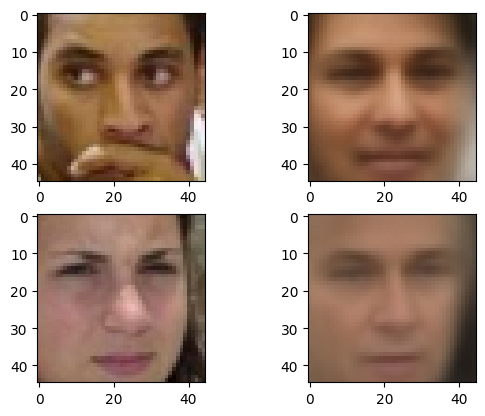

5/5 [==============================] - 1s 201ms/step - loss: 74.8773 - val_loss: 74.4517 - val_reconstruction_loss: 60.2323 - val_kl_loss: 14.2194
Epoch 54/500
5/5 [==============================] - 0s 92ms/step - loss: 73.7334 - val_loss: 74.2234 - val_reconstruction_loss: 60.0225 - val_kl_loss: 14.2009
Epoch 55/500
4/5 [=======================>......] - ETA: 0s - loss: 75.8008

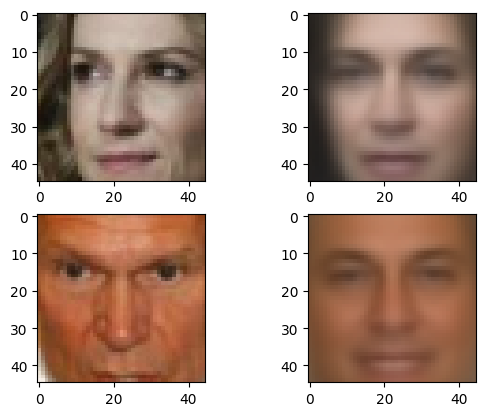

5/5 [==============================] - 1s 271ms/step - loss: 75.0898 - val_loss: 75.0375 - val_reconstruction_loss: 60.5065 - val_kl_loss: 14.5309
Epoch 56/500
5/5 [==============================] - 1s 147ms/step - loss: 74.4339 - val_loss: 74.6104 - val_reconstruction_loss: 60.4462 - val_kl_loss: 14.1642
Epoch 57/500
5/5 [==============================] - ETA: 0s - loss: 74.3766

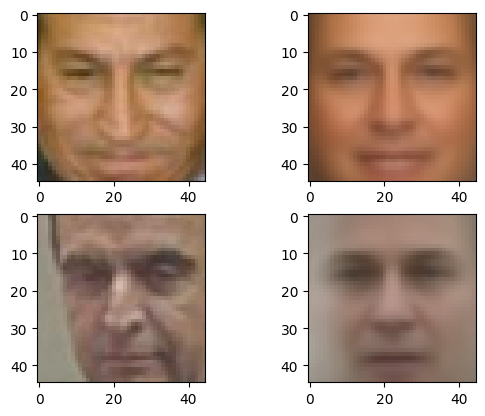

5/5 [==============================] - 1s 263ms/step - loss: 74.3766 - val_loss: 74.8188 - val_reconstruction_loss: 60.7368 - val_kl_loss: 14.0820
Epoch 58/500
5/5 [==============================] - 0s 77ms/step - loss: 74.0776 - val_loss: 74.5673 - val_reconstruction_loss: 60.5851 - val_kl_loss: 13.9822
Epoch 59/500
4/5 [=======================>......] - ETA: 0s - loss: 75.2751

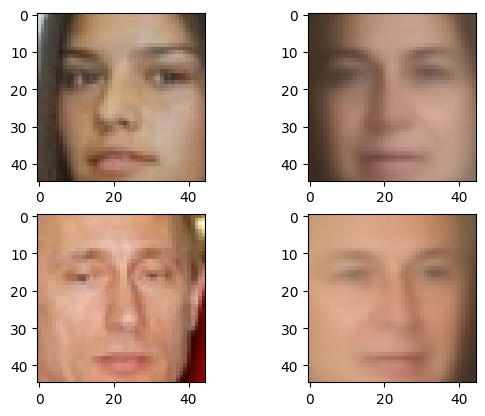

5/5 [==============================] - 1s 202ms/step - loss: 74.5456 - val_loss: 74.0999 - val_reconstruction_loss: 59.8032 - val_kl_loss: 14.2967
Epoch 60/500
5/5 [==============================] - 0s 74ms/step - loss: 73.8541 - val_loss: 74.0574 - val_reconstruction_loss: 59.7984 - val_kl_loss: 14.2589
Epoch 61/500
5/5 [==============================] - ETA: 0s - loss: 74.1283

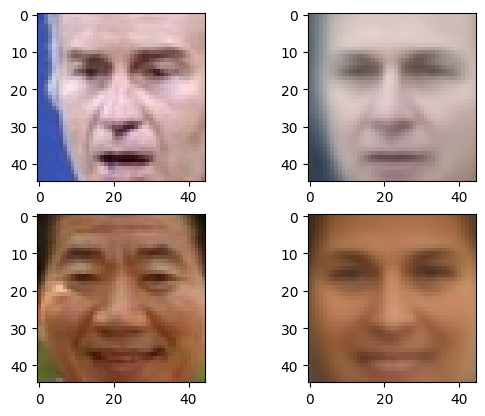

5/5 [==============================] - 1s 189ms/step - loss: 74.1283 - val_loss: 74.1880 - val_reconstruction_loss: 59.9866 - val_kl_loss: 14.2014
Epoch 62/500
5/5 [==============================] - 0s 95ms/step - loss: 74.2438 - val_loss: 74.2329 - val_reconstruction_loss: 59.8187 - val_kl_loss: 14.4142
Epoch 63/500
5/5 [==============================] - ETA: 0s - loss: 72.5243

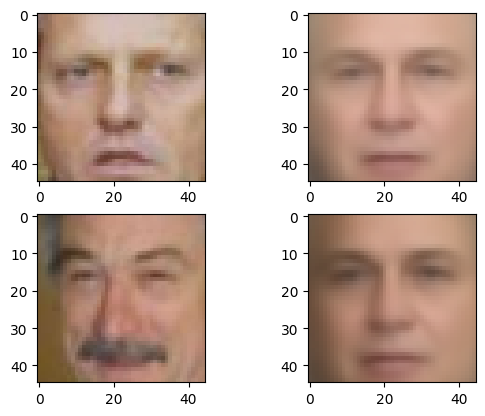

5/5 [==============================] - 1s 198ms/step - loss: 72.5243 - val_loss: 73.8921 - val_reconstruction_loss: 59.7300 - val_kl_loss: 14.1620
Epoch 64/500
5/5 [==============================] - 0s 86ms/step - loss: 74.6881 - val_loss: 76.5077 - val_reconstruction_loss: 62.5270 - val_kl_loss: 13.9807
Epoch 65/500
5/5 [==============================] - ETA: 0s - loss: 74.3856

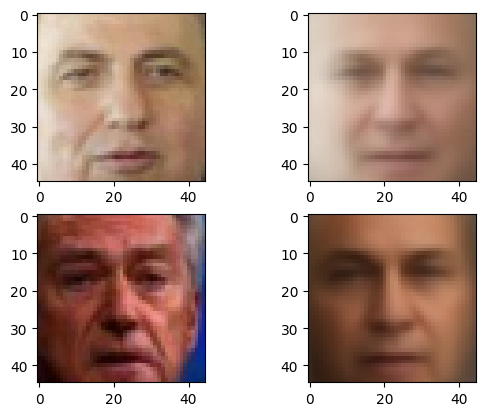

5/5 [==============================] - 1s 194ms/step - loss: 74.3856 - val_loss: 74.2327 - val_reconstruction_loss: 60.0812 - val_kl_loss: 14.1515
Epoch 66/500
5/5 [==============================] - 0s 94ms/step - loss: 74.0328 - val_loss: 74.3915 - val_reconstruction_loss: 60.0646 - val_kl_loss: 14.3269
Epoch 67/500
4/5 [=======================>......] - ETA: 0s - loss: 73.8410

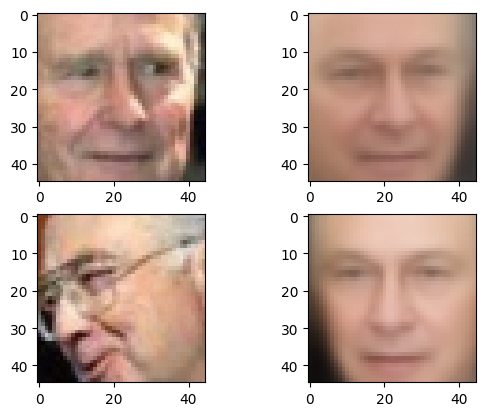

5/5 [==============================] - 1s 281ms/step - loss: 73.5662 - val_loss: 74.0891 - val_reconstruction_loss: 59.9098 - val_kl_loss: 14.1793
Epoch 68/500
5/5 [==============================] - 0s 84ms/step - loss: 74.2736 - val_loss: 74.1261 - val_reconstruction_loss: 59.9524 - val_kl_loss: 14.1737
Epoch 69/500
4/5 [=======================>......] - ETA: 0s - loss: 74.0764

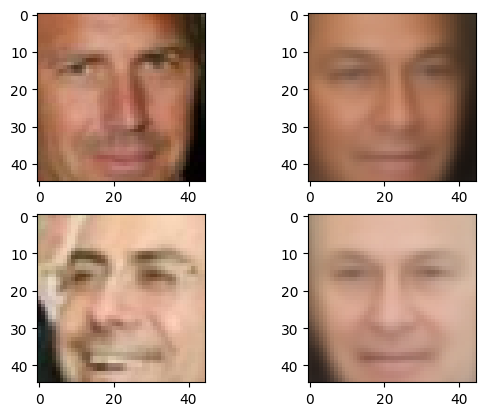

5/5 [==============================] - 1s 187ms/step - loss: 73.4776 - val_loss: 73.9393 - val_reconstruction_loss: 59.4465 - val_kl_loss: 14.4928
Epoch 70/500
5/5 [==============================] - 0s 93ms/step - loss: 75.0835 - val_loss: 74.4209 - val_reconstruction_loss: 60.0331 - val_kl_loss: 14.3878
Epoch 71/500
5/5 [==============================] - ETA: 0s - loss: 74.2748

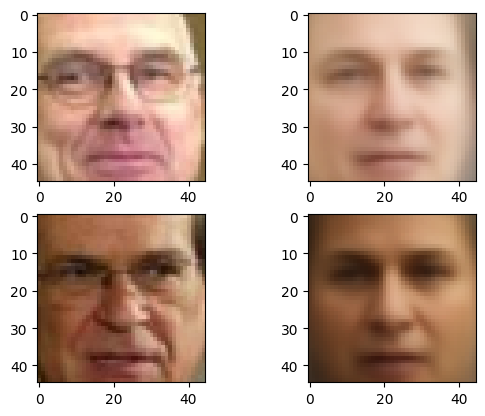

5/5 [==============================] - 1s 194ms/step - loss: 74.2748 - val_loss: 74.3676 - val_reconstruction_loss: 60.0597 - val_kl_loss: 14.3079
Epoch 72/500
5/5 [==============================] - 0s 85ms/step - loss: 74.4841 - val_loss: 73.7892 - val_reconstruction_loss: 59.5116 - val_kl_loss: 14.2776
Epoch 73/500
5/5 [==============================] - ETA: 0s - loss: 73.6773

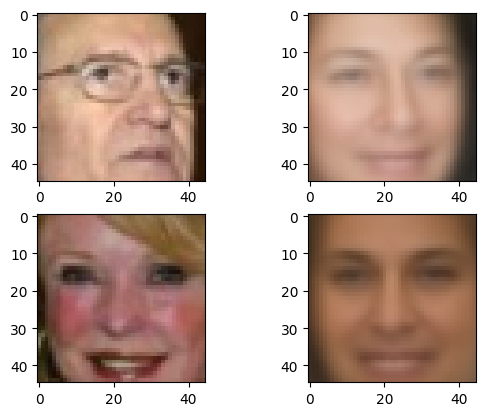

5/5 [==============================] - 1s 236ms/step - loss: 73.6773 - val_loss: 74.2048 - val_reconstruction_loss: 59.8563 - val_kl_loss: 14.3485
Epoch 74/500
5/5 [==============================] - 1s 115ms/step - loss: 73.5153 - val_loss: 73.8264 - val_reconstruction_loss: 59.4324 - val_kl_loss: 14.3940
Epoch 75/500
5/5 [==============================] - ETA: 0s - loss: 74.5699

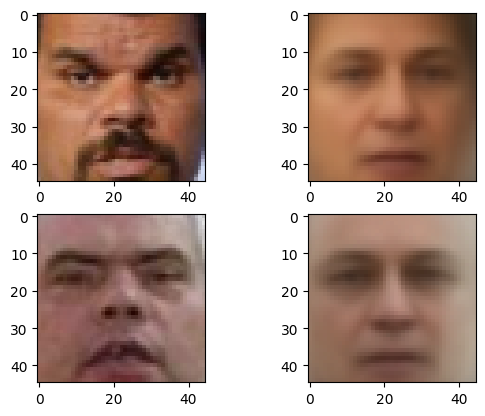

5/5 [==============================] - 1s 253ms/step - loss: 74.5699 - val_loss: 73.9124 - val_reconstruction_loss: 59.5768 - val_kl_loss: 14.3355
Epoch 76/500
5/5 [==============================] - 1s 126ms/step - loss: 73.4331 - val_loss: 74.1025 - val_reconstruction_loss: 59.6723 - val_kl_loss: 14.4301
Epoch 77/500
4/5 [=======================>......] - ETA: 0s - loss: 74.0710

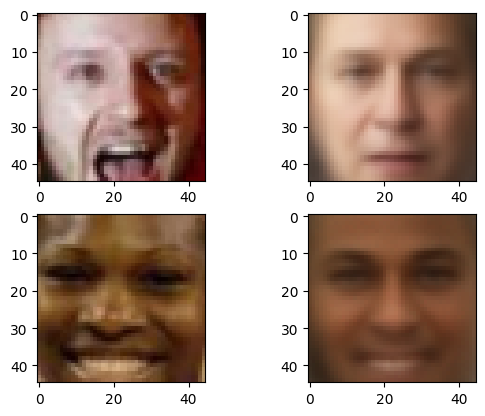

5/5 [==============================] - 1s 218ms/step - loss: 72.9867 - val_loss: 73.6739 - val_reconstruction_loss: 59.2616 - val_kl_loss: 14.4124
Epoch 78/500
5/5 [==============================] - 0s 80ms/step - loss: 73.5688 - val_loss: 73.6081 - val_reconstruction_loss: 59.4545 - val_kl_loss: 14.1536
Epoch 79/500
4/5 [=======================>......] - ETA: 0s - loss: 73.5702

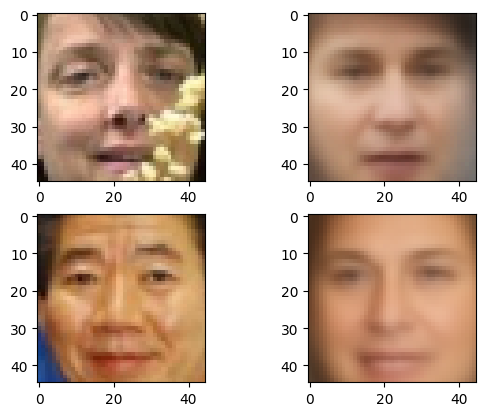

5/5 [==============================] - 1s 208ms/step - loss: 73.7574 - val_loss: 74.5014 - val_reconstruction_loss: 60.4602 - val_kl_loss: 14.0413
Epoch 80/500
5/5 [==============================] - 0s 76ms/step - loss: 76.3805 - val_loss: 73.8675 - val_reconstruction_loss: 59.5198 - val_kl_loss: 14.3477
Epoch 81/500
4/5 [=======================>......] - ETA: 0s - loss: 73.4587

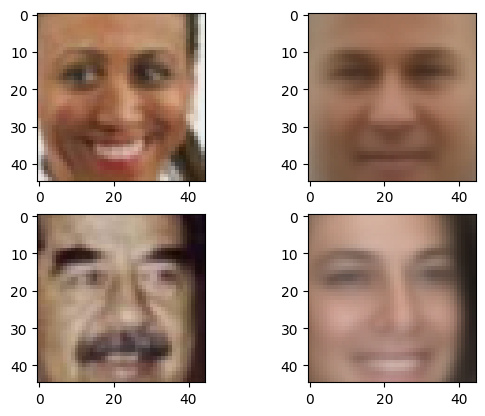

5/5 [==============================] - 1s 201ms/step - loss: 73.2513 - val_loss: 73.5109 - val_reconstruction_loss: 59.1239 - val_kl_loss: 14.3870
Epoch 82/500
5/5 [==============================] - 0s 73ms/step - loss: 73.8339 - val_loss: 74.2731 - val_reconstruction_loss: 59.7286 - val_kl_loss: 14.5445
Epoch 83/500
5/5 [==============================] - ETA: 0s - loss: 73.6107

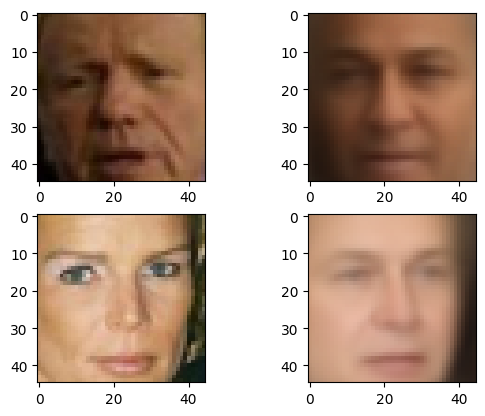

5/5 [==============================] - 1s 189ms/step - loss: 73.6107 - val_loss: 74.0340 - val_reconstruction_loss: 59.6809 - val_kl_loss: 14.3531
Epoch 84/500
5/5 [==============================] - 0s 73ms/step - loss: 75.0169 - val_loss: 74.4247 - val_reconstruction_loss: 60.2850 - val_kl_loss: 14.1397
Epoch 85/500
4/5 [=======================>......] - ETA: 0s - loss: 74.4068

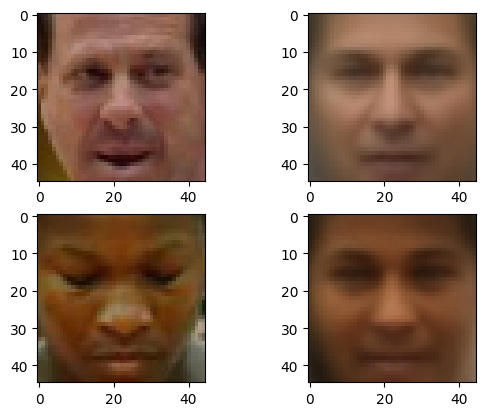

5/5 [==============================] - 1s 190ms/step - loss: 74.4056 - val_loss: 74.6028 - val_reconstruction_loss: 60.4172 - val_kl_loss: 14.1855
Epoch 86/500
5/5 [==============================] - 0s 90ms/step - loss: 73.4398 - val_loss: 73.9494 - val_reconstruction_loss: 59.5466 - val_kl_loss: 14.4028
Epoch 87/500
4/5 [=======================>......] - ETA: 0s - loss: 73.4169

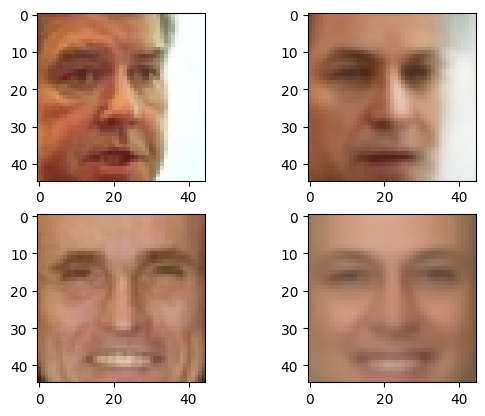

5/5 [==============================] - 1s 192ms/step - loss: 73.0601 - val_loss: 73.6687 - val_reconstruction_loss: 58.9773 - val_kl_loss: 14.6915
Epoch 88/500
5/5 [==============================] - 0s 82ms/step - loss: 75.0245 - val_loss: 73.4164 - val_reconstruction_loss: 58.7988 - val_kl_loss: 14.6176
Epoch 89/500
4/5 [=======================>......] - ETA: 0s - loss: 73.4102

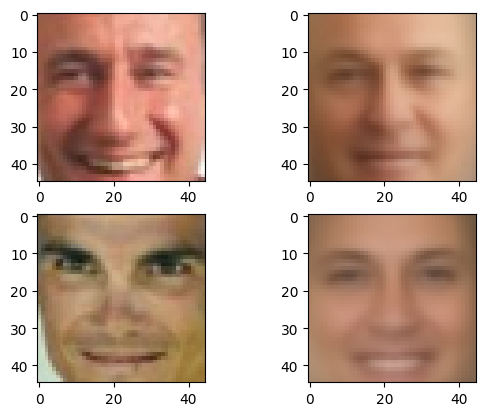

5/5 [==============================] - 1s 192ms/step - loss: 73.2513 - val_loss: 73.7182 - val_reconstruction_loss: 59.3336 - val_kl_loss: 14.3846
Epoch 90/500
5/5 [==============================] - 0s 99ms/step - loss: 75.2127 - val_loss: 74.4967 - val_reconstruction_loss: 59.7623 - val_kl_loss: 14.7344
Epoch 91/500
5/5 [==============================] - ETA: 0s - loss: 73.8087

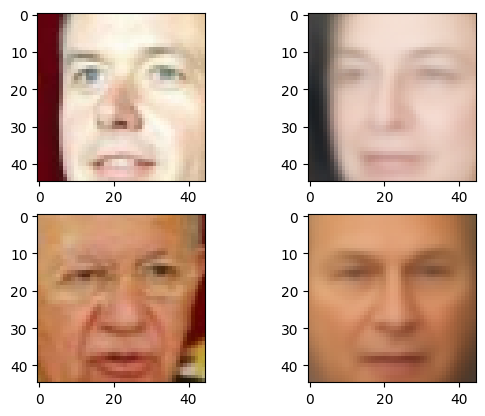

5/5 [==============================] - 1s 267ms/step - loss: 73.8087 - val_loss: 73.3691 - val_reconstruction_loss: 58.8166 - val_kl_loss: 14.5525
Epoch 92/500
5/5 [==============================] - 0s 75ms/step - loss: 75.0686 - val_loss: 74.0129 - val_reconstruction_loss: 59.6453 - val_kl_loss: 14.3676
Epoch 93/500
4/5 [=======================>......] - ETA: 0s - loss: 75.1214

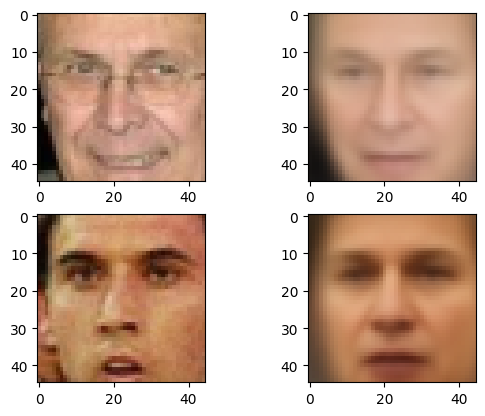

5/5 [==============================] - 1s 260ms/step - loss: 74.7019 - val_loss: 74.3971 - val_reconstruction_loss: 60.0002 - val_kl_loss: 14.3969
Epoch 94/500
5/5 [==============================] - 0s 101ms/step - loss: 72.2722 - val_loss: 73.6075 - val_reconstruction_loss: 59.1671 - val_kl_loss: 14.4403
Epoch 95/500
5/5 [==============================] - ETA: 0s - loss: 73.2144

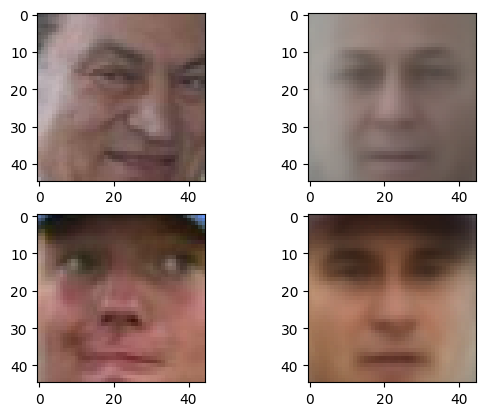

5/5 [==============================] - 1s 290ms/step - loss: 73.2144 - val_loss: 73.6093 - val_reconstruction_loss: 58.9813 - val_kl_loss: 14.6280
Epoch 96/500
5/5 [==============================] - 0s 94ms/step - loss: 73.1152 - val_loss: 73.3878 - val_reconstruction_loss: 58.8991 - val_kl_loss: 14.4888
Epoch 97/500
4/5 [=======================>......] - ETA: 0s - loss: 72.6696

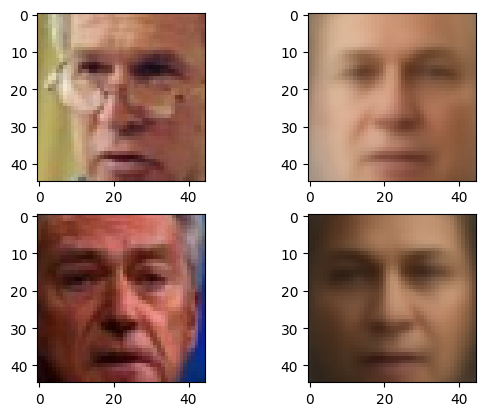

5/5 [==============================] - 1s 211ms/step - loss: 71.5253 - val_loss: 73.7771 - val_reconstruction_loss: 58.9993 - val_kl_loss: 14.7778
Epoch 98/500
5/5 [==============================] - 0s 94ms/step - loss: 73.1156 - val_loss: 73.2693 - val_reconstruction_loss: 58.6040 - val_kl_loss: 14.6654
Epoch 99/500
5/5 [==============================] - ETA: 0s - loss: 75.1754

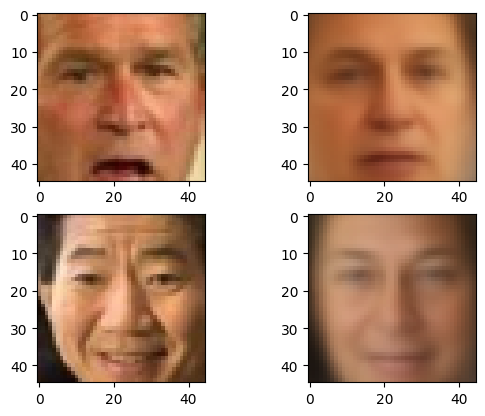

5/5 [==============================] - 1s 197ms/step - loss: 75.1754 - val_loss: 73.8253 - val_reconstruction_loss: 59.3475 - val_kl_loss: 14.4778
Epoch 100/500
5/5 [==============================] - 0s 105ms/step - loss: 72.3330 - val_loss: 73.3589 - val_reconstruction_loss: 58.7797 - val_kl_loss: 14.5793
Epoch 101/500
4/5 [=======================>......] - ETA: 0s - loss: 73.0667

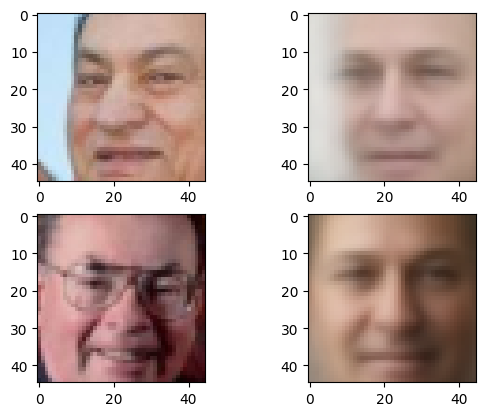

5/5 [==============================] - 1s 191ms/step - loss: 73.3328 - val_loss: 73.3810 - val_reconstruction_loss: 58.4839 - val_kl_loss: 14.8972
Epoch 102/500
5/5 [==============================] - 0s 86ms/step - loss: 71.4862 - val_loss: 73.0296 - val_reconstruction_loss: 58.3943 - val_kl_loss: 14.6352
Epoch 103/500
5/5 [==============================] - ETA: 0s - loss: 72.5360

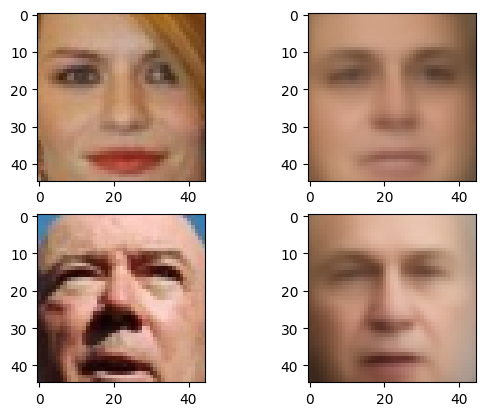

5/5 [==============================] - 1s 212ms/step - loss: 72.5360 - val_loss: 72.9449 - val_reconstruction_loss: 58.4827 - val_kl_loss: 14.4622
Epoch 104/500
5/5 [==============================] - 0s 82ms/step - loss: 73.1497 - val_loss: 73.5341 - val_reconstruction_loss: 58.7123 - val_kl_loss: 14.8218
Epoch 105/500
5/5 [==============================] - ETA: 0s - loss: 72.9001

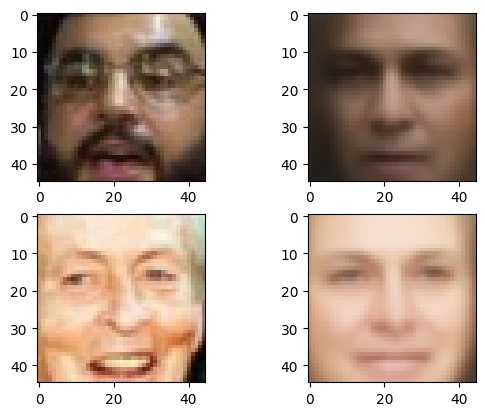

5/5 [==============================] - 1s 210ms/step - loss: 72.9001 - val_loss: 74.3198 - val_reconstruction_loss: 59.8758 - val_kl_loss: 14.4440
Epoch 106/500
5/5 [==============================] - 0s 102ms/step - loss: 72.8973 - val_loss: 73.0408 - val_reconstruction_loss: 58.5424 - val_kl_loss: 14.4983
Epoch 107/500
5/5 [==============================] - ETA: 0s - loss: 72.9035

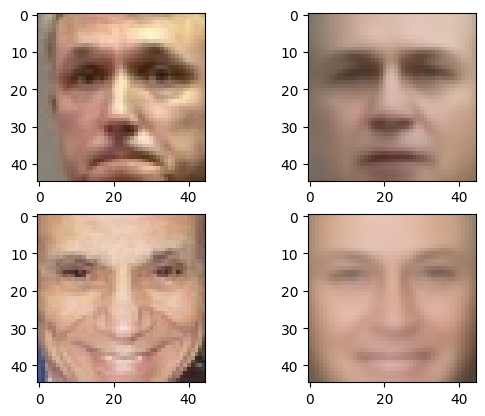

5/5 [==============================] - 1s 210ms/step - loss: 72.9035 - val_loss: 73.7225 - val_reconstruction_loss: 58.8872 - val_kl_loss: 14.8354
Epoch 108/500
5/5 [==============================] - 0s 97ms/step - loss: 74.1653 - val_loss: 73.1876 - val_reconstruction_loss: 58.6493 - val_kl_loss: 14.5382
Epoch 109/500
5/5 [==============================] - ETA: 0s - loss: 71.8283

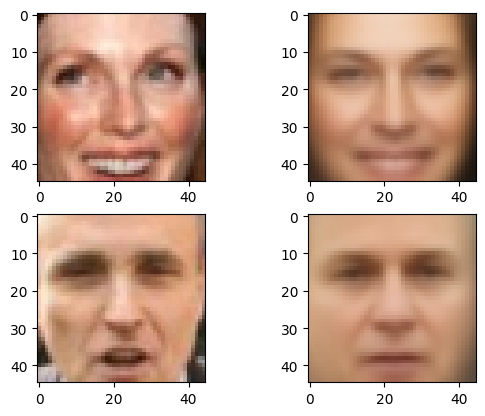

5/5 [==============================] - 1s 220ms/step - loss: 71.8283 - val_loss: 72.6733 - val_reconstruction_loss: 57.8870 - val_kl_loss: 14.7864
Epoch 110/500
5/5 [==============================] - 0s 92ms/step - loss: 73.9902 - val_loss: 74.8080 - val_reconstruction_loss: 59.7459 - val_kl_loss: 15.0621
Epoch 111/500
5/5 [==============================] - ETA: 0s - loss: 74.3626

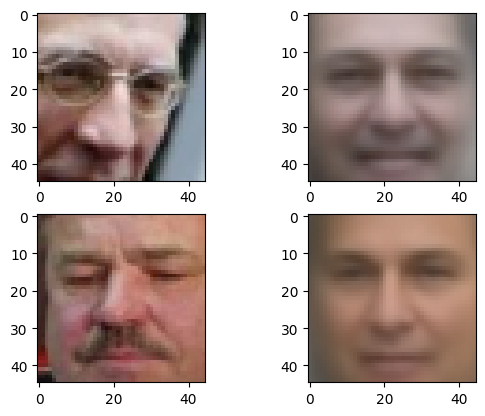

5/5 [==============================] - 1s 246ms/step - loss: 74.3626 - val_loss: 73.2856 - val_reconstruction_loss: 58.6327 - val_kl_loss: 14.6529
Epoch 112/500
5/5 [==============================] - 1s 125ms/step - loss: 72.4349 - val_loss: 73.3315 - val_reconstruction_loss: 58.7310 - val_kl_loss: 14.6005
Epoch 113/500
5/5 [==============================] - ETA: 0s - loss: 72.6464

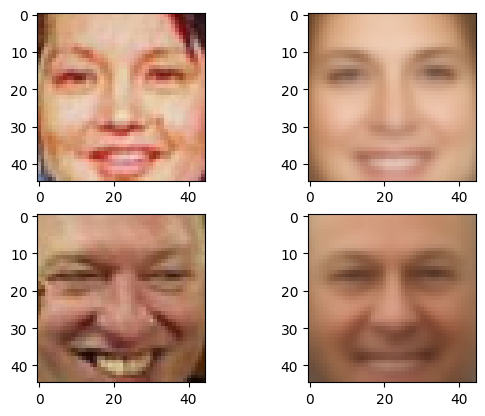

5/5 [==============================] - 2s 370ms/step - loss: 72.6464 - val_loss: 72.9682 - val_reconstruction_loss: 58.5190 - val_kl_loss: 14.4493
Epoch 114/500
5/5 [==============================] - 1s 152ms/step - loss: 72.2129 - val_loss: 74.0380 - val_reconstruction_loss: 59.6783 - val_kl_loss: 14.3597
Epoch 115/500
4/5 [=======================>......] - ETA: 0s - loss: 73.1914

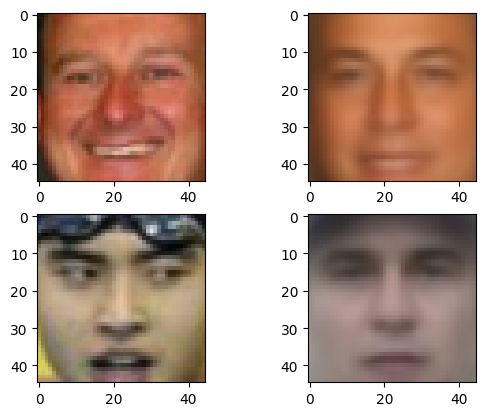

5/5 [==============================] - 1s 212ms/step - loss: 73.2453 - val_loss: 73.3765 - val_reconstruction_loss: 58.8001 - val_kl_loss: 14.5764
Epoch 116/500
5/5 [==============================] - 0s 89ms/step - loss: 72.9872 - val_loss: 73.0030 - val_reconstruction_loss: 58.2822 - val_kl_loss: 14.7207
Epoch 117/500
4/5 [=======================>......] - ETA: 0s - loss: 73.2164

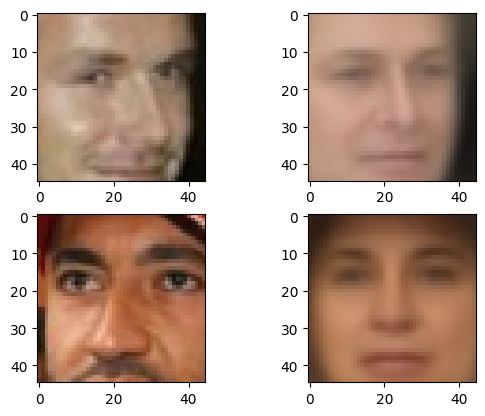

5/5 [==============================] - 1s 190ms/step - loss: 72.8867 - val_loss: 72.7452 - val_reconstruction_loss: 58.0826 - val_kl_loss: 14.6626
Epoch 118/500
5/5 [==============================] - 0s 102ms/step - loss: 71.6914 - val_loss: 72.7140 - val_reconstruction_loss: 57.9711 - val_kl_loss: 14.7429
Epoch 119/500
5/5 [==============================] - ETA: 0s - loss: 72.1003

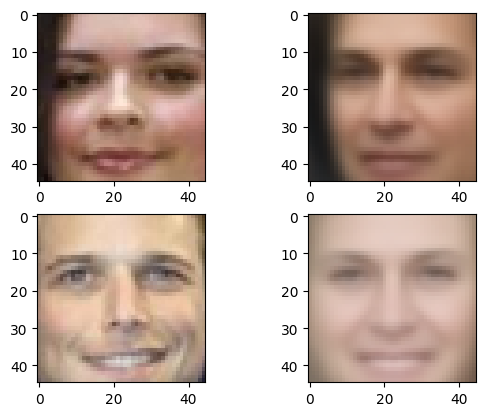

5/5 [==============================] - 1s 212ms/step - loss: 72.1003 - val_loss: 72.7271 - val_reconstruction_loss: 58.0285 - val_kl_loss: 14.6987
Epoch 120/500
5/5 [==============================] - 0s 100ms/step - loss: 72.8376 - val_loss: 72.6866 - val_reconstruction_loss: 57.6633 - val_kl_loss: 15.0233
Epoch 121/500
5/5 [==============================] - ETA: 0s - loss: 73.5281

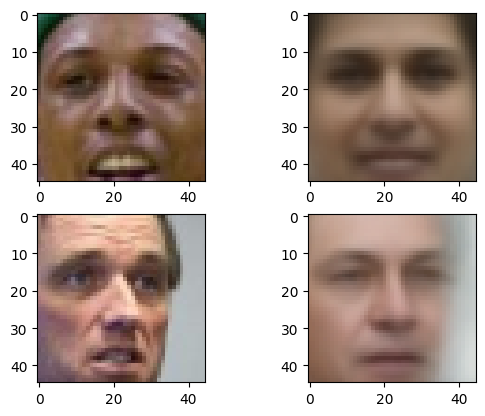

5/5 [==============================] - 1s 224ms/step - loss: 73.5281 - val_loss: 73.8033 - val_reconstruction_loss: 59.1443 - val_kl_loss: 14.6589
Epoch 122/500
5/5 [==============================] - 0s 105ms/step - loss: 72.9928 - val_loss: 72.7011 - val_reconstruction_loss: 58.0926 - val_kl_loss: 14.6085
Epoch 123/500
4/5 [=======================>......] - ETA: 0s - loss: 72.6437

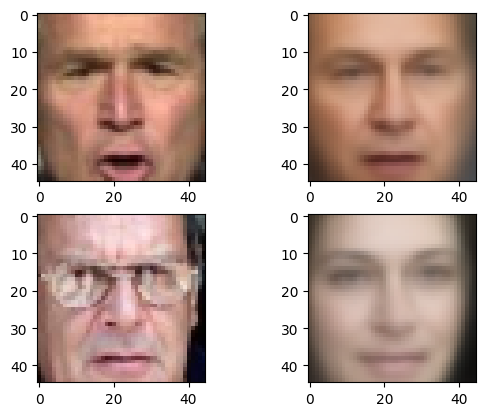

5/5 [==============================] - 1s 204ms/step - loss: 71.8017 - val_loss: 72.7446 - val_reconstruction_loss: 57.8776 - val_kl_loss: 14.8669
Epoch 124/500
5/5 [==============================] - 0s 92ms/step - loss: 74.0222 - val_loss: 74.3937 - val_reconstruction_loss: 59.3492 - val_kl_loss: 15.0444
Epoch 125/500
5/5 [==============================] - ETA: 0s - loss: 73.6577

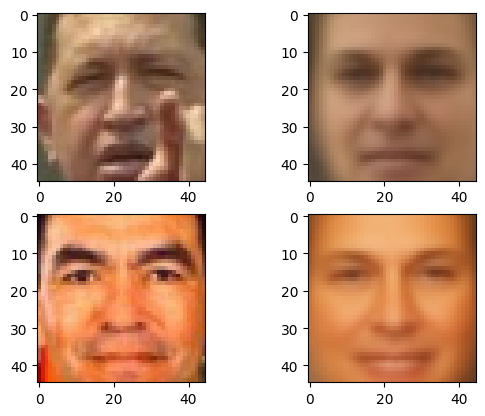

5/5 [==============================] - 1s 208ms/step - loss: 73.6577 - val_loss: 73.4616 - val_reconstruction_loss: 58.5534 - val_kl_loss: 14.9082
Epoch 126/500
5/5 [==============================] - 0s 93ms/step - loss: 73.2845 - val_loss: 73.0788 - val_reconstruction_loss: 58.4050 - val_kl_loss: 14.6738
Epoch 127/500
4/5 [=======================>......] - ETA: 0s - loss: 72.8980

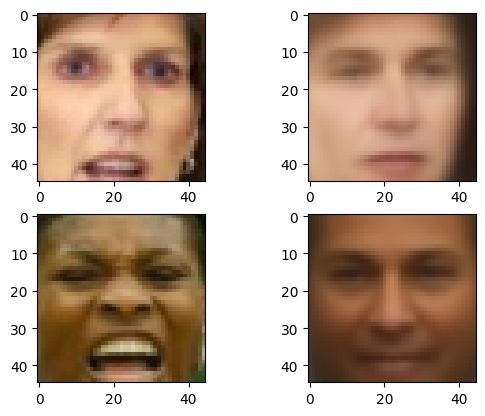

5/5 [==============================] - 1s 209ms/step - loss: 72.5595 - val_loss: 72.7164 - val_reconstruction_loss: 57.8505 - val_kl_loss: 14.8659
Epoch 128/500
5/5 [==============================] - 0s 102ms/step - loss: 73.2329 - val_loss: 73.2814 - val_reconstruction_loss: 58.1249 - val_kl_loss: 15.1565
Epoch 129/500
5/5 [==============================] - ETA: 0s - loss: 73.4547

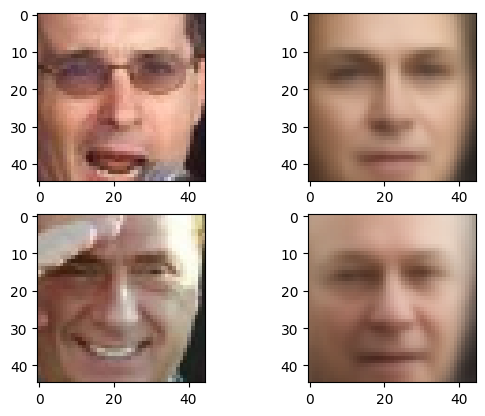

5/5 [==============================] - 1s 251ms/step - loss: 73.4547 - val_loss: 72.5848 - val_reconstruction_loss: 57.8275 - val_kl_loss: 14.7573
Epoch 130/500
5/5 [==============================] - 1s 109ms/step - loss: 72.7107 - val_loss: 72.6693 - val_reconstruction_loss: 57.7526 - val_kl_loss: 14.9167
Epoch 131/500
5/5 [==============================] - ETA: 0s - loss: 72.7386

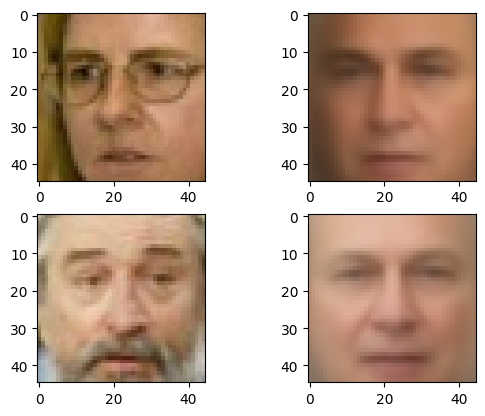

5/5 [==============================] - 1s 281ms/step - loss: 72.7386 - val_loss: 72.4234 - val_reconstruction_loss: 57.5322 - val_kl_loss: 14.8912
Epoch 132/500
5/5 [==============================] - 1s 105ms/step - loss: 73.0108 - val_loss: 72.4809 - val_reconstruction_loss: 57.6808 - val_kl_loss: 14.8001
Epoch 133/500
5/5 [==============================] - ETA: 0s - loss: 72.1550

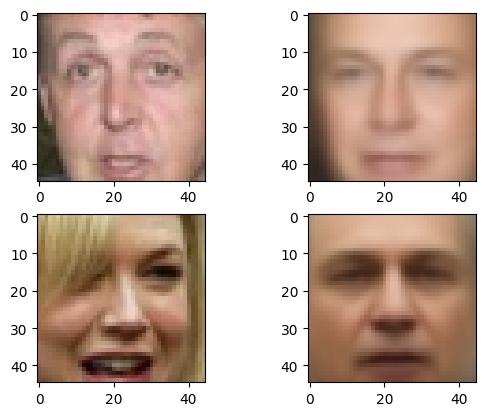

5/5 [==============================] - 1s 227ms/step - loss: 72.1550 - val_loss: 73.3737 - val_reconstruction_loss: 58.7167 - val_kl_loss: 14.6570
Epoch 134/500
5/5 [==============================] - 0s 94ms/step - loss: 72.1060 - val_loss: 72.2235 - val_reconstruction_loss: 57.3082 - val_kl_loss: 14.9153
Epoch 135/500
4/5 [=======================>......] - ETA: 0s - loss: 72.6762

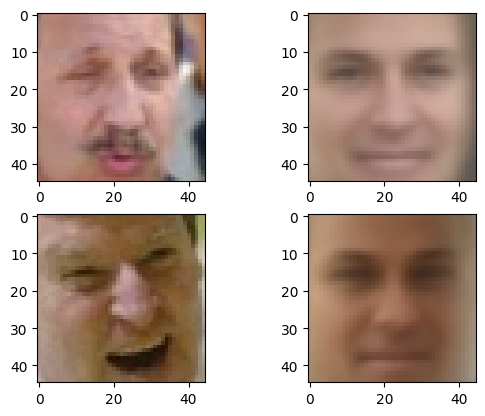

5/5 [==============================] - 1s 204ms/step - loss: 74.0647 - val_loss: 73.3115 - val_reconstruction_loss: 58.1944 - val_kl_loss: 15.1171
Epoch 136/500
5/5 [==============================] - 0s 93ms/step - loss: 73.0336 - val_loss: 72.4193 - val_reconstruction_loss: 57.4290 - val_kl_loss: 14.9903
Epoch 137/500
4/5 [=======================>......] - ETA: 0s - loss: 72.1191

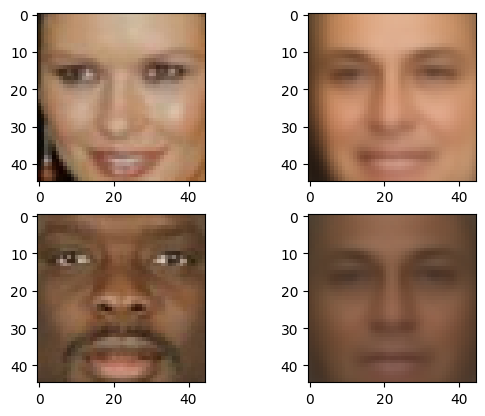

5/5 [==============================] - 1s 271ms/step - loss: 72.4083 - val_loss: 72.0773 - val_reconstruction_loss: 57.0731 - val_kl_loss: 15.0042
Epoch 138/500
5/5 [==============================] - 0s 95ms/step - loss: 72.3727 - val_loss: 73.5133 - val_reconstruction_loss: 58.8332 - val_kl_loss: 14.6801
Epoch 139/500
5/5 [==============================] - ETA: 0s - loss: 73.6137

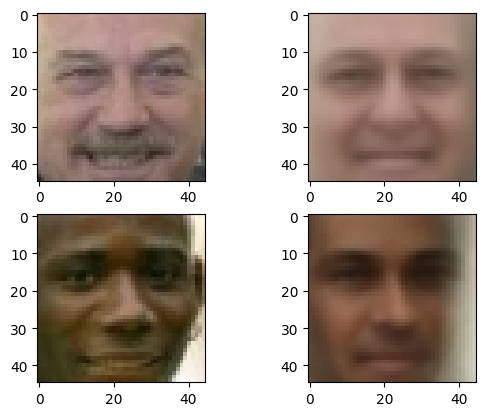

5/5 [==============================] - 1s 215ms/step - loss: 73.6137 - val_loss: 72.7201 - val_reconstruction_loss: 57.8011 - val_kl_loss: 14.9189
Epoch 140/500
5/5 [==============================] - 0s 109ms/step - loss: 72.0180 - val_loss: 72.8215 - val_reconstruction_loss: 57.9263 - val_kl_loss: 14.8951
Epoch 141/500
4/5 [=======================>......] - ETA: 0s - loss: 72.2241

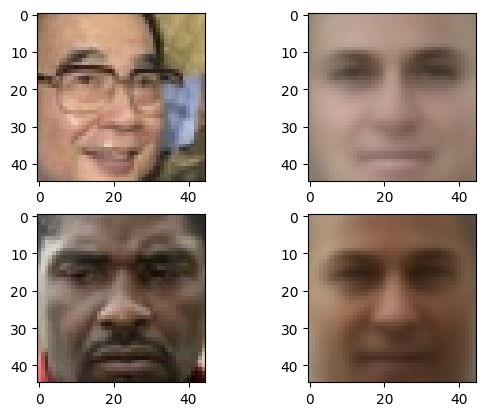

5/5 [==============================] - 1s 223ms/step - loss: 72.6214 - val_loss: 72.8406 - val_reconstruction_loss: 57.7630 - val_kl_loss: 15.0775
Epoch 142/500
5/5 [==============================] - 0s 103ms/step - loss: 71.7448 - val_loss: 72.3526 - val_reconstruction_loss: 57.6330 - val_kl_loss: 14.7196
Epoch 143/500
5/5 [==============================] - ETA: 0s - loss: 71.9193

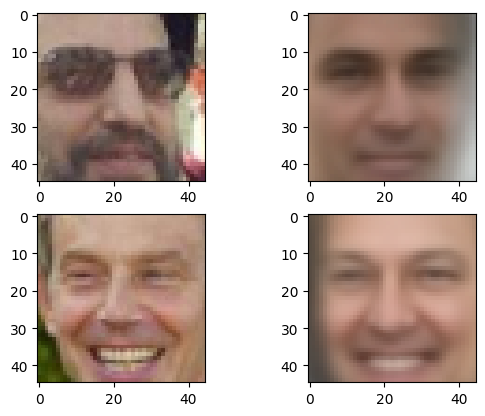

5/5 [==============================] - 1s 212ms/step - loss: 71.9193 - val_loss: 72.4883 - val_reconstruction_loss: 57.4753 - val_kl_loss: 15.0130
Epoch 144/500
5/5 [==============================] - 1s 110ms/step - loss: 71.3596 - val_loss: 72.2294 - val_reconstruction_loss: 57.2291 - val_kl_loss: 15.0003
Epoch 145/500
4/5 [=======================>......] - ETA: 0s - loss: 71.0625

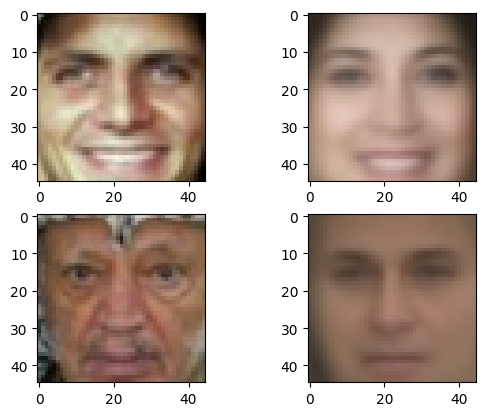

5/5 [==============================] - 1s 191ms/step - loss: 71.9589 - val_loss: 72.1319 - val_reconstruction_loss: 57.1441 - val_kl_loss: 14.9879
Epoch 146/500
5/5 [==============================] - 0s 87ms/step - loss: 72.3494 - val_loss: 73.1360 - val_reconstruction_loss: 58.0423 - val_kl_loss: 15.0937
Epoch 147/500
4/5 [=======================>......] - ETA: 0s - loss: 74.7213

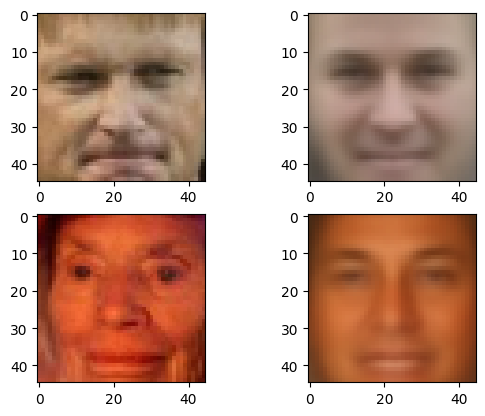

5/5 [==============================] - 1s 231ms/step - loss: 74.2516 - val_loss: 74.9611 - val_reconstruction_loss: 60.5800 - val_kl_loss: 14.3811
Epoch 148/500
5/5 [==============================] - 1s 162ms/step - loss: 73.4898 - val_loss: 72.5137 - val_reconstruction_loss: 57.4581 - val_kl_loss: 15.0556
Epoch 149/500
5/5 [==============================] - ETA: 0s - loss: 72.2649

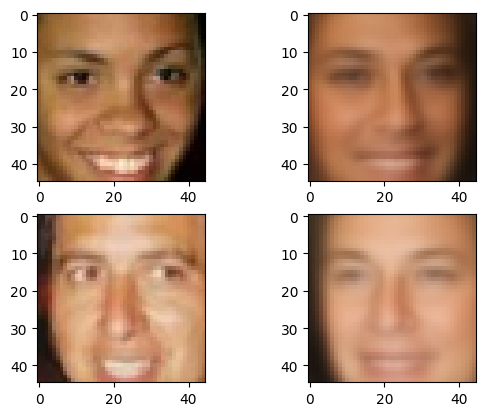

5/5 [==============================] - 1s 291ms/step - loss: 72.2649 - val_loss: 72.5115 - val_reconstruction_loss: 57.7789 - val_kl_loss: 14.7325
Epoch 150/500
5/5 [==============================] - 1s 115ms/step - loss: 72.9322 - val_loss: 72.3336 - val_reconstruction_loss: 57.2978 - val_kl_loss: 15.0358
Epoch 151/500
5/5 [==============================] - ETA: 0s - loss: 72.8139

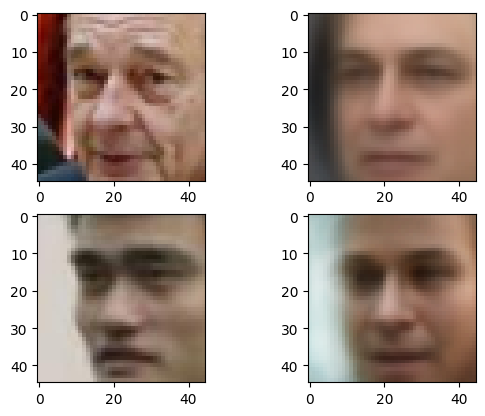

5/5 [==============================] - 1s 242ms/step - loss: 72.8139 - val_loss: 72.9054 - val_reconstruction_loss: 57.7068 - val_kl_loss: 15.1987
Epoch 152/500
5/5 [==============================] - 0s 91ms/step - loss: 71.3067 - val_loss: 71.9501 - val_reconstruction_loss: 56.9881 - val_kl_loss: 14.9620
Epoch 153/500
5/5 [==============================] - ETA: 0s - loss: 72.4888

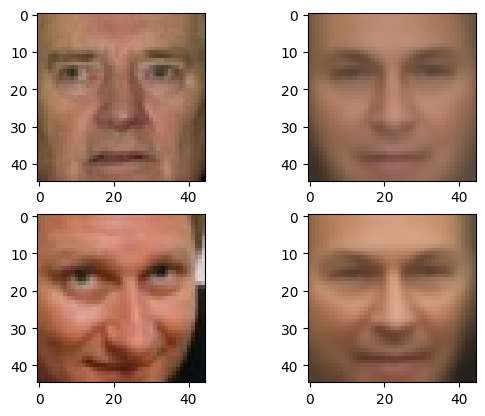

5/5 [==============================] - 1s 212ms/step - loss: 72.4888 - val_loss: 72.2695 - val_reconstruction_loss: 57.1480 - val_kl_loss: 15.1215
Epoch 154/500
5/5 [==============================] - 0s 101ms/step - loss: 73.3879 - val_loss: 72.3336 - val_reconstruction_loss: 57.4634 - val_kl_loss: 14.8701
Epoch 155/500
5/5 [==============================] - ETA: 0s - loss: 72.1128

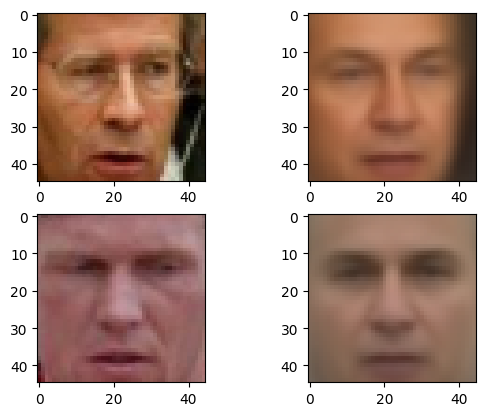

5/5 [==============================] - 1s 208ms/step - loss: 72.1128 - val_loss: 72.2589 - val_reconstruction_loss: 57.2107 - val_kl_loss: 15.0482
Epoch 156/500
5/5 [==============================] - 0s 98ms/step - loss: 71.3233 - val_loss: 72.3319 - val_reconstruction_loss: 57.5314 - val_kl_loss: 14.8005
Epoch 157/500
4/5 [=======================>......] - ETA: 0s - loss: 72.6399

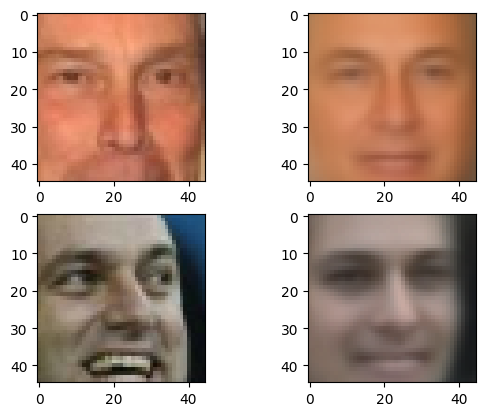

5/5 [==============================] - 1s 210ms/step - loss: 71.0969 - val_loss: 71.9462 - val_reconstruction_loss: 56.8133 - val_kl_loss: 15.1329
Epoch 158/500
5/5 [==============================] - 0s 93ms/step - loss: 72.2248 - val_loss: 72.4779 - val_reconstruction_loss: 57.2723 - val_kl_loss: 15.2056
Epoch 159/500
5/5 [==============================] - ETA: 0s - loss: 71.0929

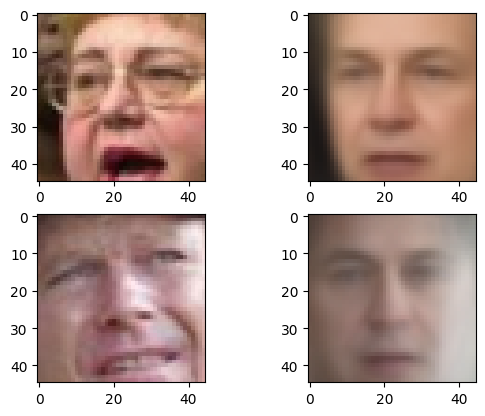

5/5 [==============================] - 1s 206ms/step - loss: 71.0929 - val_loss: 71.9622 - val_reconstruction_loss: 56.8242 - val_kl_loss: 15.1380
Epoch 160/500
5/5 [==============================] - 0s 103ms/step - loss: 71.3875 - val_loss: 71.9673 - val_reconstruction_loss: 56.9221 - val_kl_loss: 15.0453
Epoch 161/500
4/5 [=======================>......] - ETA: 0s - loss: 70.8014

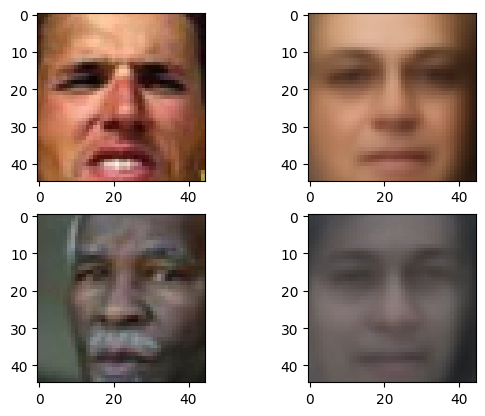

5/5 [==============================] - 1s 272ms/step - loss: 73.3085 - val_loss: 71.9043 - val_reconstruction_loss: 56.8667 - val_kl_loss: 15.0377
Epoch 162/500
5/5 [==============================] - 0s 94ms/step - loss: 72.4795 - val_loss: 72.6665 - val_reconstruction_loss: 57.8372 - val_kl_loss: 14.8293
Epoch 163/500
5/5 [==============================] - ETA: 0s - loss: 72.8384

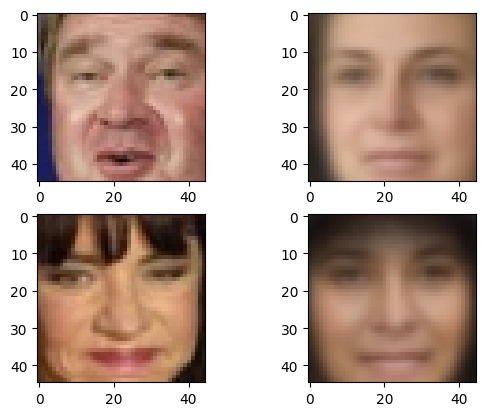

5/5 [==============================] - 1s 216ms/step - loss: 72.8384 - val_loss: 72.6692 - val_reconstruction_loss: 57.7045 - val_kl_loss: 14.9648
Epoch 164/500
5/5 [==============================] - 0s 100ms/step - loss: 71.4722 - val_loss: 72.2350 - val_reconstruction_loss: 56.8995 - val_kl_loss: 15.3356
Epoch 165/500
5/5 [==============================] - ETA: 0s - loss: 72.4724

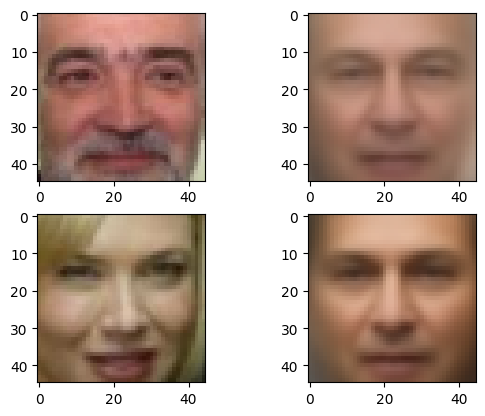

5/5 [==============================] - 1s 251ms/step - loss: 72.4724 - val_loss: 71.9259 - val_reconstruction_loss: 56.9363 - val_kl_loss: 14.9897
Epoch 166/500
5/5 [==============================] - 1s 149ms/step - loss: 71.8617 - val_loss: 72.1275 - val_reconstruction_loss: 57.0554 - val_kl_loss: 15.0721
Epoch 167/500
5/5 [==============================] - ETA: 0s - loss: 73.3763

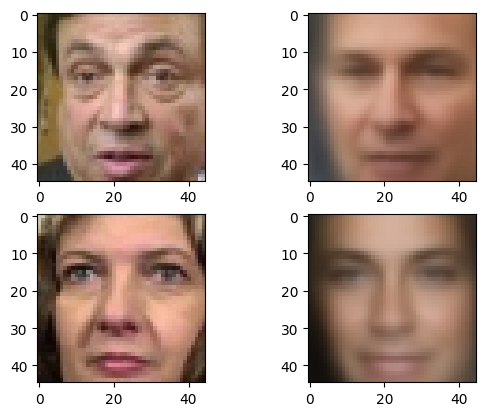

5/5 [==============================] - 1s 304ms/step - loss: 73.3763 - val_loss: 74.5105 - val_reconstruction_loss: 59.1860 - val_kl_loss: 15.3244
Epoch 168/500
5/5 [==============================] - 1s 156ms/step - loss: 73.9978 - val_loss: 73.3843 - val_reconstruction_loss: 58.5254 - val_kl_loss: 14.8590
Epoch 169/500
5/5 [==============================] - ETA: 0s - loss: 73.2969

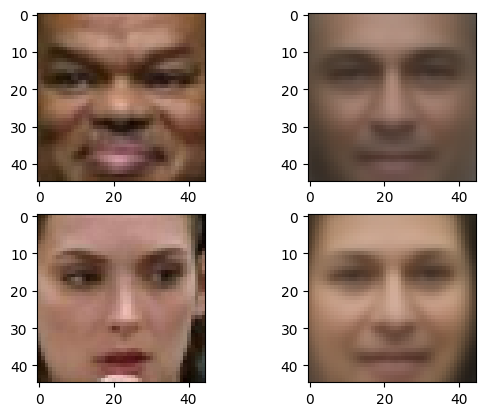

5/5 [==============================] - 1s 214ms/step - loss: 73.2969 - val_loss: 72.0505 - val_reconstruction_loss: 57.0644 - val_kl_loss: 14.9860
Epoch 170/500
5/5 [==============================] - 0s 89ms/step - loss: 71.8959 - val_loss: 72.3142 - val_reconstruction_loss: 57.5483 - val_kl_loss: 14.7658
Epoch 171/500
5/5 [==============================] - ETA: 0s - loss: 73.6234

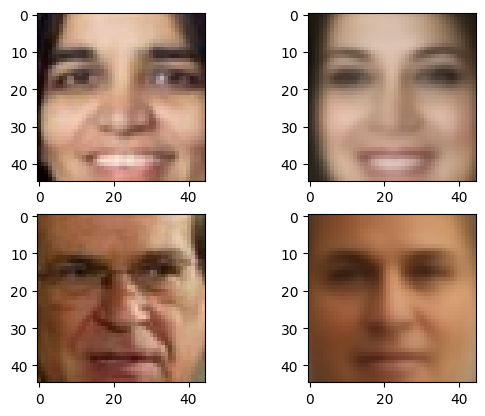

5/5 [==============================] - 1s 219ms/step - loss: 73.6234 - val_loss: 71.9549 - val_reconstruction_loss: 57.0650 - val_kl_loss: 14.8899
Epoch 172/500
5/5 [==============================] - 1s 144ms/step - loss: 72.9929 - val_loss: 72.3932 - val_reconstruction_loss: 57.3008 - val_kl_loss: 15.0923
Epoch 173/500
5/5 [==============================] - ETA: 0s - loss: 71.9326

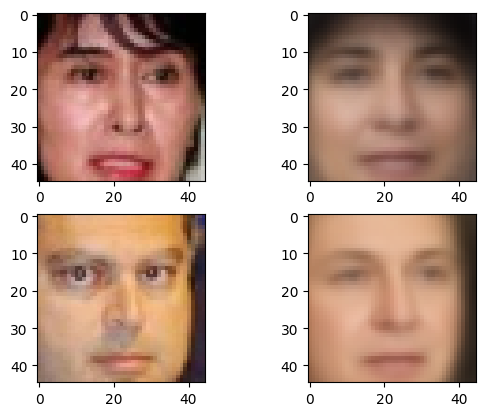

5/5 [==============================] - 1s 217ms/step - loss: 71.9326 - val_loss: 72.6398 - val_reconstruction_loss: 57.2844 - val_kl_loss: 15.3554
Epoch 174/500
5/5 [==============================] - 0s 88ms/step - loss: 70.5620 - val_loss: 72.2246 - val_reconstruction_loss: 57.1139 - val_kl_loss: 15.1107
Epoch 175/500
4/5 [=======================>......] - ETA: 0s - loss: 72.2896

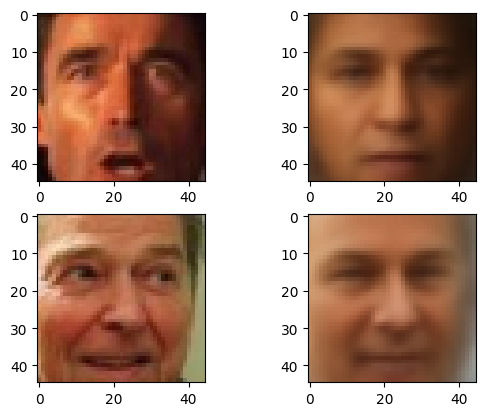

5/5 [==============================] - 1s 213ms/step - loss: 71.2475 - val_loss: 72.6137 - val_reconstruction_loss: 57.1886 - val_kl_loss: 15.4251
Epoch 176/500
5/5 [==============================] - 0s 94ms/step - loss: 71.6262 - val_loss: 72.0032 - val_reconstruction_loss: 57.0314 - val_kl_loss: 14.9719
Epoch 177/500
5/5 [==============================] - ETA: 0s - loss: 71.7263

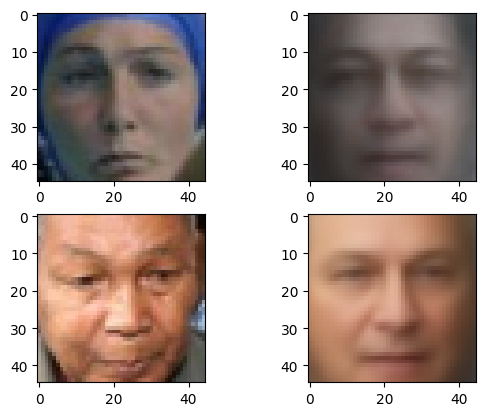

5/5 [==============================] - 1s 205ms/step - loss: 71.7263 - val_loss: 71.6302 - val_reconstruction_loss: 56.5968 - val_kl_loss: 15.0334
Epoch 178/500
5/5 [==============================] - 0s 102ms/step - loss: 71.7852 - val_loss: 71.4162 - val_reconstruction_loss: 56.2799 - val_kl_loss: 15.1363
Epoch 179/500
5/5 [==============================] - ETA: 0s - loss: 70.7109

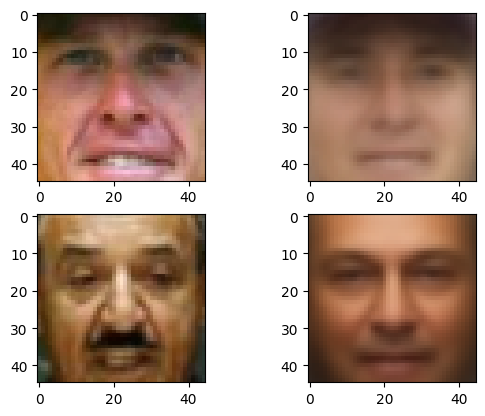

5/5 [==============================] - 1s 218ms/step - loss: 70.7109 - val_loss: 71.4461 - val_reconstruction_loss: 56.3419 - val_kl_loss: 15.1042
Epoch 180/500
5/5 [==============================] - 0s 108ms/step - loss: 71.4049 - val_loss: 72.1097 - val_reconstruction_loss: 56.9125 - val_kl_loss: 15.1971
Epoch 181/500
5/5 [==============================] - ETA: 0s - loss: 71.6068

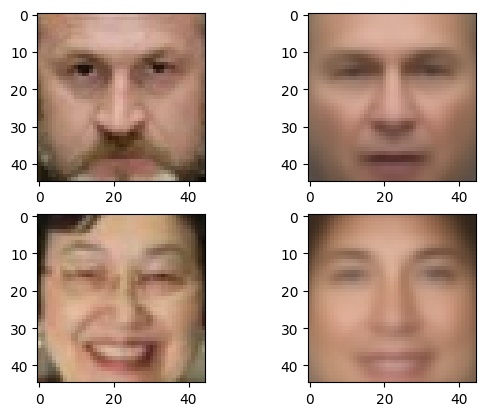

5/5 [==============================] - 1s 223ms/step - loss: 71.6068 - val_loss: 71.8006 - val_reconstruction_loss: 56.6454 - val_kl_loss: 15.1552
Epoch 182/500
5/5 [==============================] - 0s 106ms/step - loss: 72.9457 - val_loss: 73.1752 - val_reconstruction_loss: 58.3807 - val_kl_loss: 14.7945
Epoch 183/500
5/5 [==============================] - ETA: 0s - loss: 70.8706

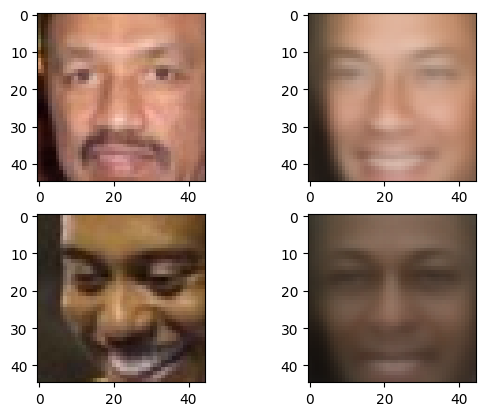

5/5 [==============================] - 1s 346ms/step - loss: 70.8706 - val_loss: 71.8947 - val_reconstruction_loss: 56.9883 - val_kl_loss: 14.9064
Epoch 184/500
5/5 [==============================] - 1s 114ms/step - loss: 71.2642 - val_loss: 71.7359 - val_reconstruction_loss: 56.6034 - val_kl_loss: 15.1325
Epoch 185/500
5/5 [==============================] - ETA: 0s - loss: 71.5993

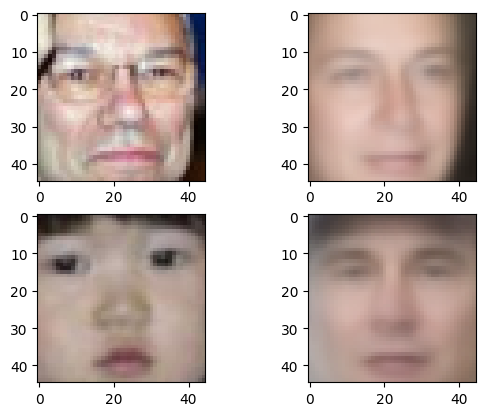

5/5 [==============================] - 1s 287ms/step - loss: 71.5993 - val_loss: 72.3557 - val_reconstruction_loss: 57.1724 - val_kl_loss: 15.1832
Epoch 186/500
5/5 [==============================] - 1s 114ms/step - loss: 69.9468 - val_loss: 71.9198 - val_reconstruction_loss: 56.5468 - val_kl_loss: 15.3730
Epoch 187/500
5/5 [==============================] - ETA: 0s - loss: 71.7849

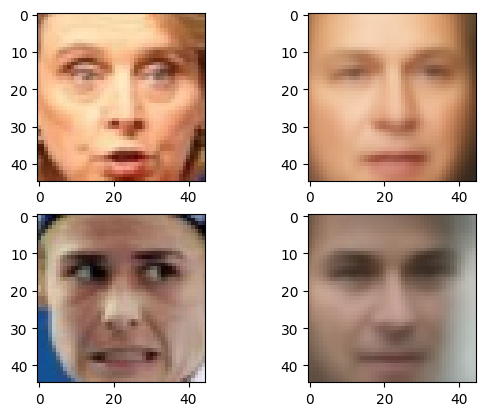

5/5 [==============================] - 1s 227ms/step - loss: 71.7849 - val_loss: 71.8826 - val_reconstruction_loss: 56.6780 - val_kl_loss: 15.2046
Epoch 188/500
5/5 [==============================] - 0s 101ms/step - loss: 71.7042 - val_loss: 72.7382 - val_reconstruction_loss: 57.9244 - val_kl_loss: 14.8138
Epoch 189/500
4/5 [=======================>......] - ETA: 0s - loss: 72.4569

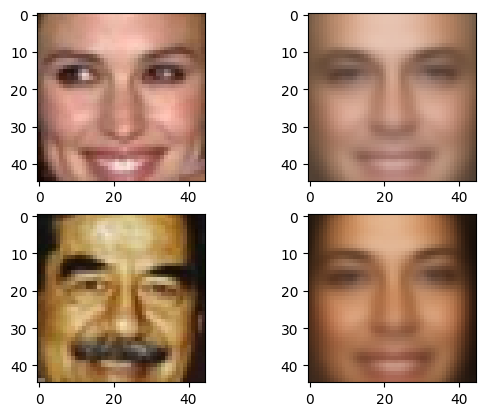

5/5 [==============================] - 1s 205ms/step - loss: 71.7495 - val_loss: 71.6844 - val_reconstruction_loss: 56.7905 - val_kl_loss: 14.8939
Epoch 190/500
5/5 [==============================] - 0s 103ms/step - loss: 71.6714 - val_loss: 72.2361 - val_reconstruction_loss: 57.0355 - val_kl_loss: 15.2005
Epoch 191/500
5/5 [==============================] - ETA: 0s - loss: 71.5537

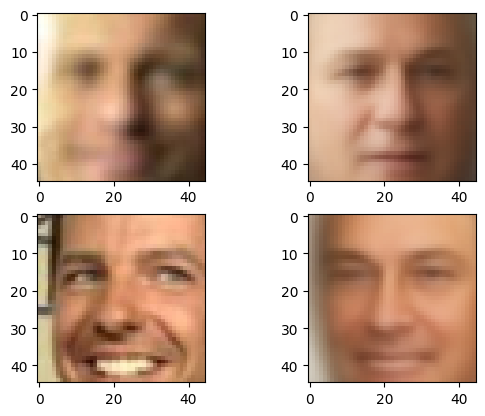

5/5 [==============================] - 1s 211ms/step - loss: 71.5537 - val_loss: 72.1102 - val_reconstruction_loss: 56.9747 - val_kl_loss: 15.1355
Epoch 192/500
5/5 [==============================] - 0s 98ms/step - loss: 71.4833 - val_loss: 72.8330 - val_reconstruction_loss: 57.9157 - val_kl_loss: 14.9173
Epoch 193/500
5/5 [==============================] - ETA: 0s - loss: 72.0252

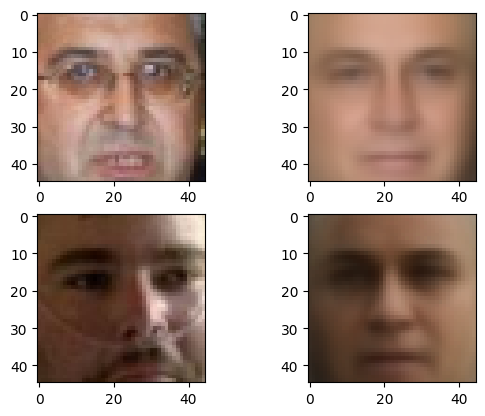

5/5 [==============================] - 1s 214ms/step - loss: 72.0252 - val_loss: 72.2392 - val_reconstruction_loss: 57.1795 - val_kl_loss: 15.0597
Epoch 194/500
5/5 [==============================] - 0s 99ms/step - loss: 72.3682 - val_loss: 71.9534 - val_reconstruction_loss: 56.7757 - val_kl_loss: 15.1778
Epoch 195/500
5/5 [==============================] - ETA: 0s - loss: 71.2667

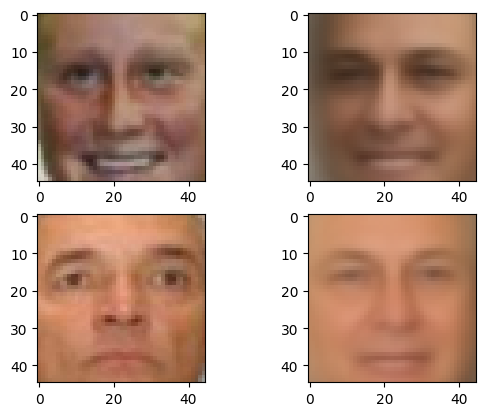

5/5 [==============================] - 1s 210ms/step - loss: 71.2667 - val_loss: 72.1797 - val_reconstruction_loss: 57.1606 - val_kl_loss: 15.0191
Epoch 196/500
5/5 [==============================] - 0s 106ms/step - loss: 72.3433 - val_loss: 71.9575 - val_reconstruction_loss: 56.7048 - val_kl_loss: 15.2527
Epoch 197/500
4/5 [=======================>......] - ETA: 0s - loss: 71.6298

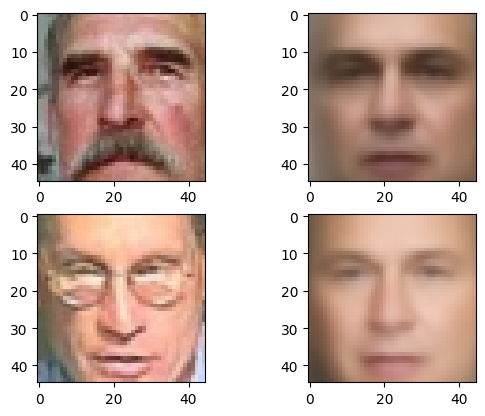

5/5 [==============================] - 1s 215ms/step - loss: 71.3589 - val_loss: 71.7059 - val_reconstruction_loss: 56.7858 - val_kl_loss: 14.9201
Epoch 198/500
5/5 [==============================] - 0s 94ms/step - loss: 71.5768 - val_loss: 71.6999 - val_reconstruction_loss: 56.4447 - val_kl_loss: 15.2552
Epoch 199/500
4/5 [=======================>......] - ETA: 0s - loss: 72.0689

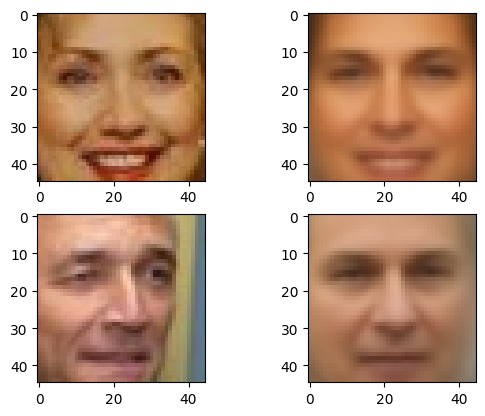

5/5 [==============================] - 1s 205ms/step - loss: 71.5305 - val_loss: 71.3739 - val_reconstruction_loss: 56.4643 - val_kl_loss: 14.9096
Epoch 200/500
5/5 [==============================] - 0s 101ms/step - loss: 72.1052 - val_loss: 72.9703 - val_reconstruction_loss: 57.6064 - val_kl_loss: 15.3639
Epoch 201/500
5/5 [==============================] - ETA: 0s - loss: 71.3197

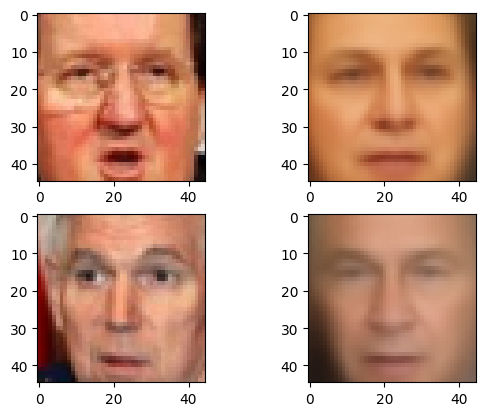

5/5 [==============================] - 1s 271ms/step - loss: 71.3197 - val_loss: 71.5344 - val_reconstruction_loss: 56.7240 - val_kl_loss: 14.8103
Epoch 202/500
5/5 [==============================] - 1s 117ms/step - loss: 71.2584 - val_loss: 71.4219 - val_reconstruction_loss: 56.1145 - val_kl_loss: 15.3075
Epoch 203/500
5/5 [==============================] - ETA: 0s - loss: 71.1051

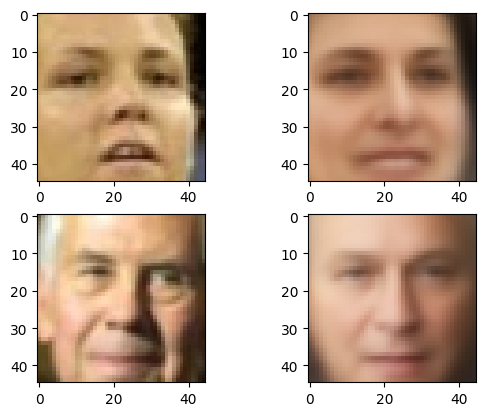

5/5 [==============================] - 1s 319ms/step - loss: 71.1051 - val_loss: 72.0349 - val_reconstruction_loss: 56.7157 - val_kl_loss: 15.3192
Epoch 204/500
5/5 [==============================] - 1s 126ms/step - loss: 71.8163 - val_loss: 71.5641 - val_reconstruction_loss: 56.5959 - val_kl_loss: 14.9681
Epoch 205/500
4/5 [=======================>......] - ETA: 0s - loss: 70.8916

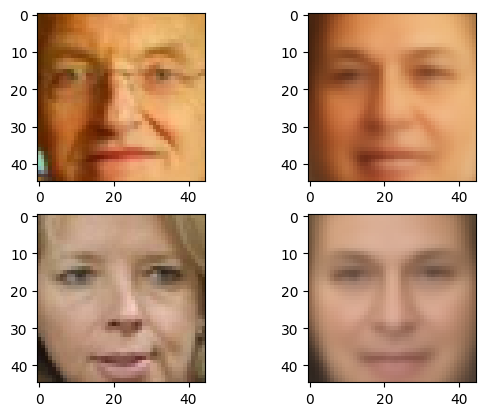

5/5 [==============================] - 1s 254ms/step - loss: 72.1711 - val_loss: 72.5084 - val_reconstruction_loss: 57.7508 - val_kl_loss: 14.7576
Epoch 206/500
5/5 [==============================] - 0s 108ms/step - loss: 71.5223 - val_loss: 71.7514 - val_reconstruction_loss: 56.3576 - val_kl_loss: 15.3938
Epoch 207/500
5/5 [==============================] - ETA: 0s - loss: 71.3445

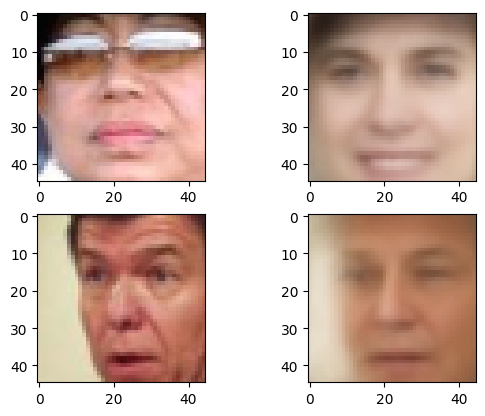

5/5 [==============================] - 1s 301ms/step - loss: 71.3445 - val_loss: 71.5621 - val_reconstruction_loss: 56.3575 - val_kl_loss: 15.2046
Epoch 208/500
5/5 [==============================] - 0s 98ms/step - loss: 71.2371 - val_loss: 71.5909 - val_reconstruction_loss: 56.2202 - val_kl_loss: 15.3706
Epoch 209/500
4/5 [=======================>......] - ETA: 0s - loss: 70.7888

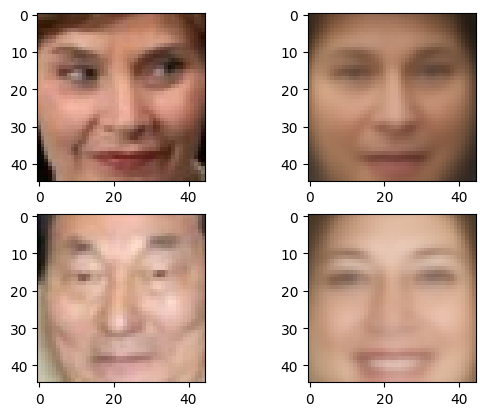

5/5 [==============================] - 1s 203ms/step - loss: 71.5290 - val_loss: 71.3010 - val_reconstruction_loss: 56.0765 - val_kl_loss: 15.2245
Epoch 210/500
5/5 [==============================] - 0s 108ms/step - loss: 69.7121 - val_loss: 71.3470 - val_reconstruction_loss: 56.2753 - val_kl_loss: 15.0717
Epoch 211/500
4/5 [=======================>......] - ETA: 0s - loss: 70.1111

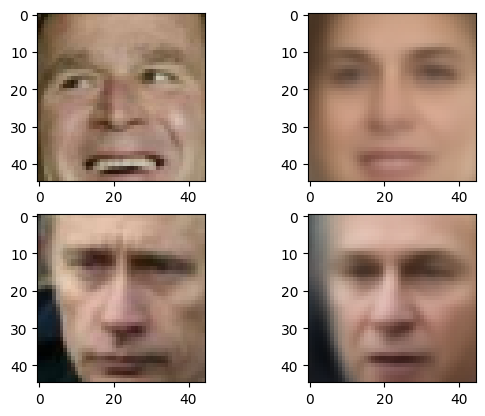

5/5 [==============================] - 1s 215ms/step - loss: 71.3147 - val_loss: 72.1939 - val_reconstruction_loss: 56.9704 - val_kl_loss: 15.2236
Epoch 212/500
5/5 [==============================] - 0s 99ms/step - loss: 70.8969 - val_loss: 72.6255 - val_reconstruction_loss: 57.6700 - val_kl_loss: 14.9555
Epoch 213/500
5/5 [==============================] - ETA: 0s - loss: 72.3440

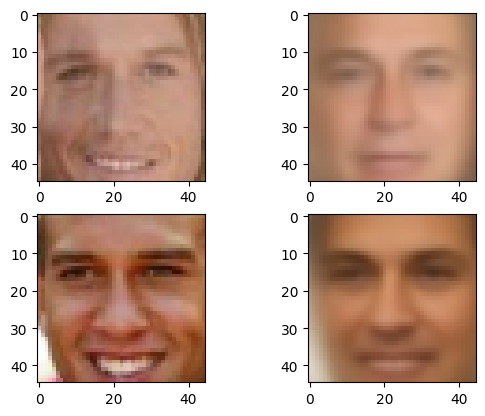

5/5 [==============================] - 1s 216ms/step - loss: 72.3440 - val_loss: 71.9054 - val_reconstruction_loss: 56.9321 - val_kl_loss: 14.9733
Epoch 214/500
5/5 [==============================] - 0s 96ms/step - loss: 72.3593 - val_loss: 73.0893 - val_reconstruction_loss: 57.9161 - val_kl_loss: 15.1732
Epoch 215/500
4/5 [=======================>......] - ETA: 0s - loss: 70.9843

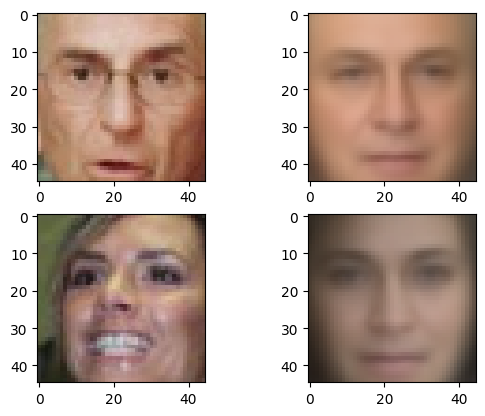

5/5 [==============================] - 1s 217ms/step - loss: 71.9705 - val_loss: 71.2634 - val_reconstruction_loss: 56.2353 - val_kl_loss: 15.0281
Epoch 216/500
5/5 [==============================] - 0s 94ms/step - loss: 73.0676 - val_loss: 72.2758 - val_reconstruction_loss: 57.0528 - val_kl_loss: 15.2230
Epoch 217/500
5/5 [==============================] - ETA: 0s - loss: 71.1399

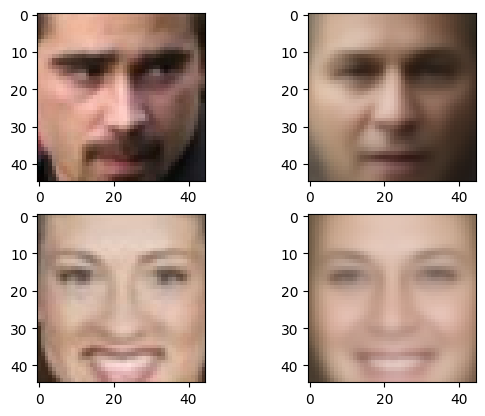

5/5 [==============================] - 1s 224ms/step - loss: 71.1399 - val_loss: 71.9831 - val_reconstruction_loss: 56.3621 - val_kl_loss: 15.6210
Epoch 218/500
5/5 [==============================] - 0s 106ms/step - loss: 70.1878 - val_loss: 71.7785 - val_reconstruction_loss: 56.8391 - val_kl_loss: 14.9394
Epoch 219/500
5/5 [==============================] - ETA: 0s - loss: 71.2998

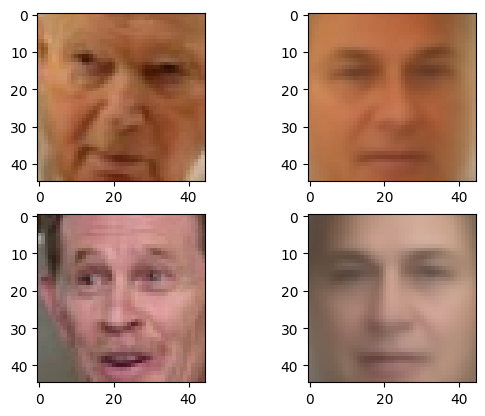

5/5 [==============================] - 1s 305ms/step - loss: 71.2998 - val_loss: 71.3384 - val_reconstruction_loss: 56.3729 - val_kl_loss: 14.9655
Epoch 220/500
5/5 [==============================] - 1s 150ms/step - loss: 71.2829 - val_loss: 71.1507 - val_reconstruction_loss: 56.1713 - val_kl_loss: 14.9793
Epoch 221/500
4/5 [=======================>......] - ETA: 0s - loss: 70.9431

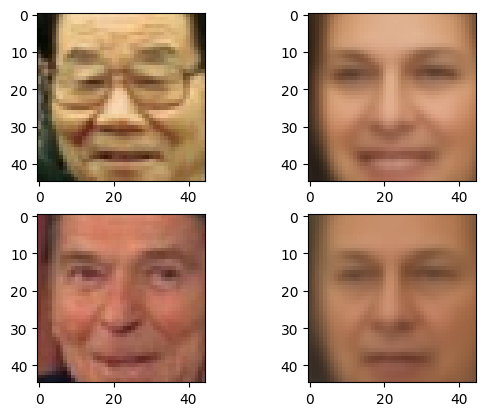

5/5 [==============================] - 1s 296ms/step - loss: 70.4128 - val_loss: 71.3130 - val_reconstruction_loss: 56.1811 - val_kl_loss: 15.1319
Epoch 222/500
5/5 [==============================] - 1s 162ms/step - loss: 70.3646 - val_loss: 71.1904 - val_reconstruction_loss: 56.1578 - val_kl_loss: 15.0326
Epoch 223/500
5/5 [==============================] - ETA: 0s - loss: 70.7317

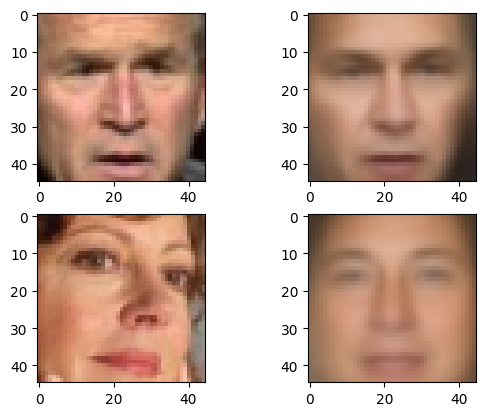

5/5 [==============================] - 1s 221ms/step - loss: 70.7317 - val_loss: 71.5923 - val_reconstruction_loss: 56.3033 - val_kl_loss: 15.2889
Epoch 224/500
5/5 [==============================] - 0s 97ms/step - loss: 69.7500 - val_loss: 71.6277 - val_reconstruction_loss: 56.2594 - val_kl_loss: 15.3683
Epoch 225/500
5/5 [==============================] - ETA: 0s - loss: 71.0081

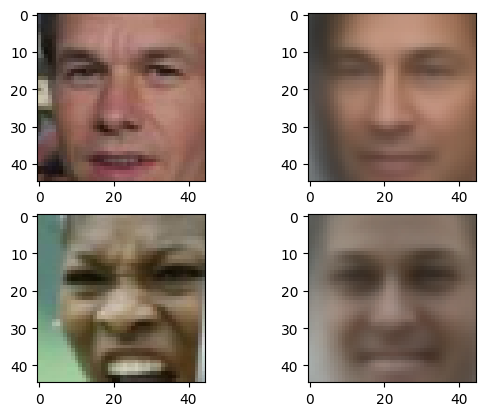

5/5 [==============================] - 1s 226ms/step - loss: 71.0081 - val_loss: 71.2921 - val_reconstruction_loss: 56.0159 - val_kl_loss: 15.2762
Epoch 226/500
5/5 [==============================] - 0s 102ms/step - loss: 71.3253 - val_loss: 71.2024 - val_reconstruction_loss: 56.0090 - val_kl_loss: 15.1934
Epoch 227/500
4/5 [=======================>......] - ETA: 0s - loss: 70.1121

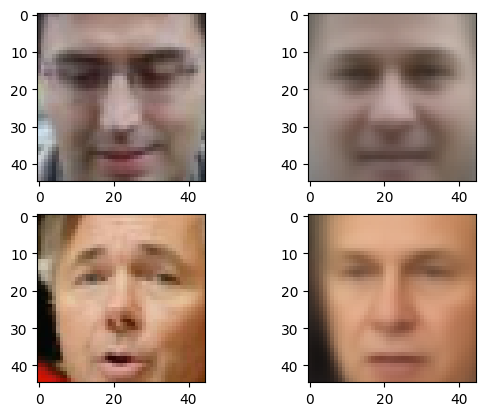

5/5 [==============================] - 1s 220ms/step - loss: 71.2557 - val_loss: 70.9605 - val_reconstruction_loss: 55.8634 - val_kl_loss: 15.0971
Epoch 228/500
5/5 [==============================] - 0s 100ms/step - loss: 71.2528 - val_loss: 71.0680 - val_reconstruction_loss: 55.6930 - val_kl_loss: 15.3750
Epoch 229/500
5/5 [==============================] - ETA: 0s - loss: 71.3715

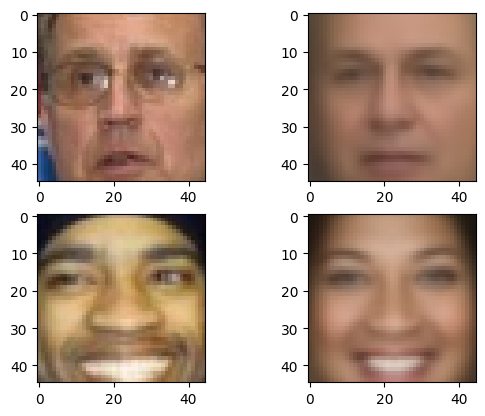

5/5 [==============================] - 1s 223ms/step - loss: 71.3715 - val_loss: 71.1976 - val_reconstruction_loss: 55.9893 - val_kl_loss: 15.2083
Epoch 230/500
5/5 [==============================] - 0s 95ms/step - loss: 71.9481 - val_loss: 71.5398 - val_reconstruction_loss: 56.5622 - val_kl_loss: 14.9776
Epoch 231/500
5/5 [==============================] - ETA: 0s - loss: 70.6965

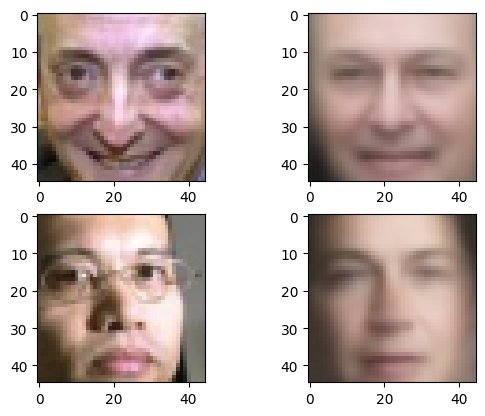

5/5 [==============================] - 1s 314ms/step - loss: 70.6965 - val_loss: 70.9013 - val_reconstruction_loss: 55.7817 - val_kl_loss: 15.1195
Epoch 232/500
5/5 [==============================] - 1s 109ms/step - loss: 70.0341 - val_loss: 71.0188 - val_reconstruction_loss: 55.9154 - val_kl_loss: 15.1035
Epoch 233/500
5/5 [==============================] - ETA: 0s - loss: 73.5694

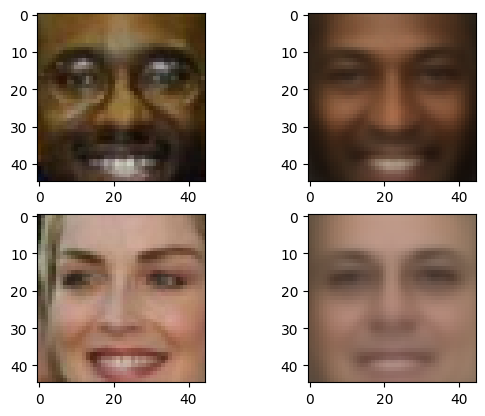

5/5 [==============================] - 1s 230ms/step - loss: 73.5694 - val_loss: 73.5698 - val_reconstruction_loss: 58.1855 - val_kl_loss: 15.3844
Epoch 234/500
5/5 [==============================] - 0s 96ms/step - loss: 70.6666 - val_loss: 72.0701 - val_reconstruction_loss: 56.5716 - val_kl_loss: 15.4985
Epoch 235/500
4/5 [=======================>......] - ETA: 0s - loss: 71.0232

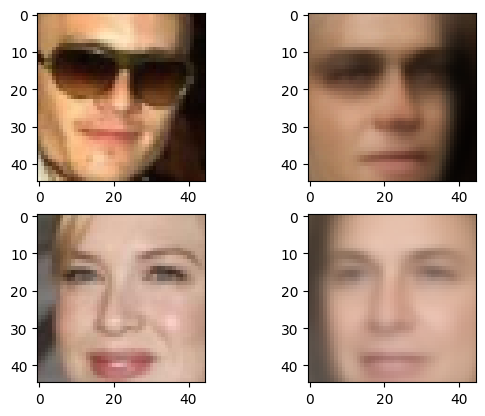

5/5 [==============================] - 1s 228ms/step - loss: 70.8843 - val_loss: 71.4414 - val_reconstruction_loss: 56.1746 - val_kl_loss: 15.2668
Epoch 236/500
5/5 [==============================] - 1s 156ms/step - loss: 71.8243 - val_loss: 71.9301 - val_reconstruction_loss: 56.6083 - val_kl_loss: 15.3219
Epoch 237/500
5/5 [==============================] - ETA: 0s - loss: 71.3243

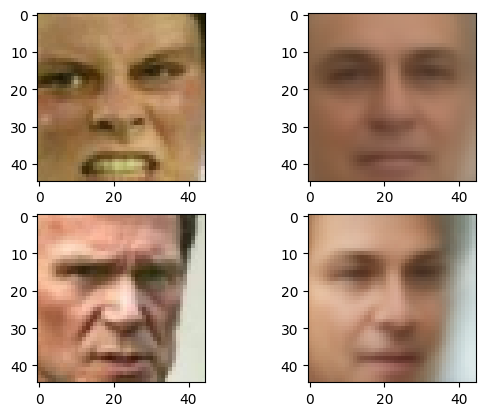

5/5 [==============================] - 1s 296ms/step - loss: 71.3243 - val_loss: 71.6519 - val_reconstruction_loss: 56.5078 - val_kl_loss: 15.1441
Epoch 238/500
5/5 [==============================] - 1s 142ms/step - loss: 70.9908 - val_loss: 71.4094 - val_reconstruction_loss: 56.1206 - val_kl_loss: 15.2888
Epoch 239/500
5/5 [==============================] - ETA: 0s - loss: 72.6557

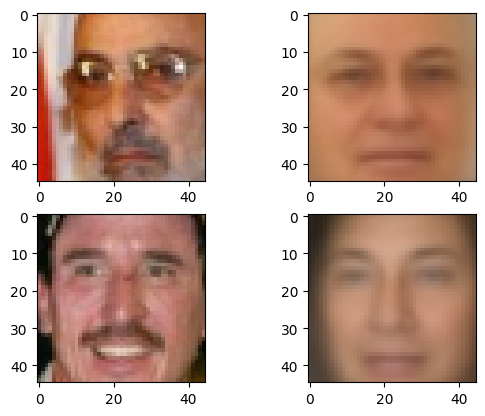

5/5 [==============================] - 1s 348ms/step - loss: 72.6557 - val_loss: 71.4631 - val_reconstruction_loss: 56.3053 - val_kl_loss: 15.1577
Epoch 240/500
5/5 [==============================] - 1s 111ms/step - loss: 72.4320 - val_loss: 72.3722 - val_reconstruction_loss: 57.2854 - val_kl_loss: 15.0869
Epoch 241/500
5/5 [==============================] - ETA: 0s - loss: 71.8763

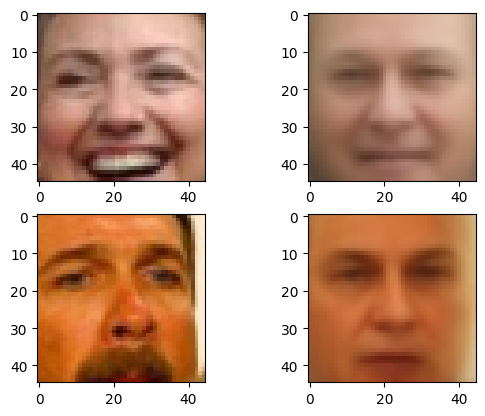

5/5 [==============================] - 1s 231ms/step - loss: 71.8763 - val_loss: 71.4115 - val_reconstruction_loss: 56.2059 - val_kl_loss: 15.2056
Epoch 242/500
5/5 [==============================] - 1s 109ms/step - loss: 71.4838 - val_loss: 71.4845 - val_reconstruction_loss: 55.8189 - val_kl_loss: 15.6656
Epoch 243/500
4/5 [=======================>......] - ETA: 0s - loss: 71.4329

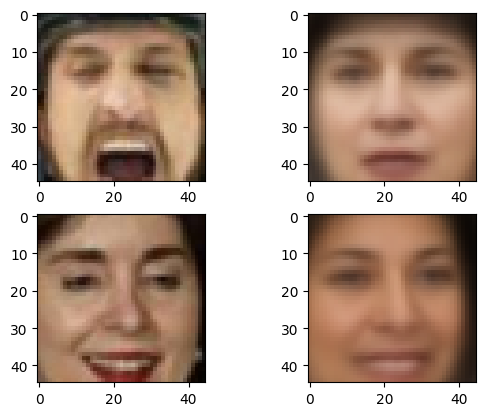

5/5 [==============================] - 1s 224ms/step - loss: 71.6797 - val_loss: 71.3017 - val_reconstruction_loss: 56.0950 - val_kl_loss: 15.2067
Epoch 244/500
5/5 [==============================] - 0s 112ms/step - loss: 71.0747 - val_loss: 71.1372 - val_reconstruction_loss: 56.1802 - val_kl_loss: 14.9570
Epoch 245/500
5/5 [==============================] - ETA: 0s - loss: 70.8930

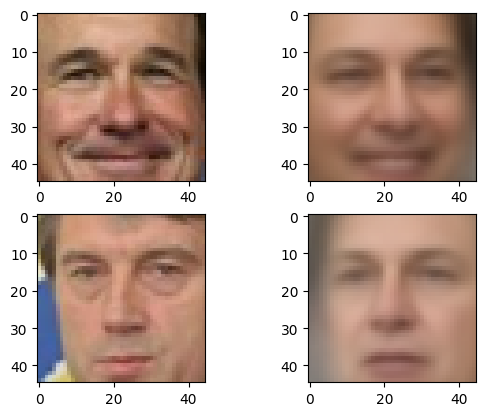

5/5 [==============================] - 1s 244ms/step - loss: 70.8930 - val_loss: 71.0080 - val_reconstruction_loss: 55.9187 - val_kl_loss: 15.0893
Epoch 246/500
5/5 [==============================] - 0s 99ms/step - loss: 72.2954 - val_loss: 71.0171 - val_reconstruction_loss: 55.7864 - val_kl_loss: 15.2307
Epoch 247/500
5/5 [==============================] - ETA: 0s - loss: 69.8937

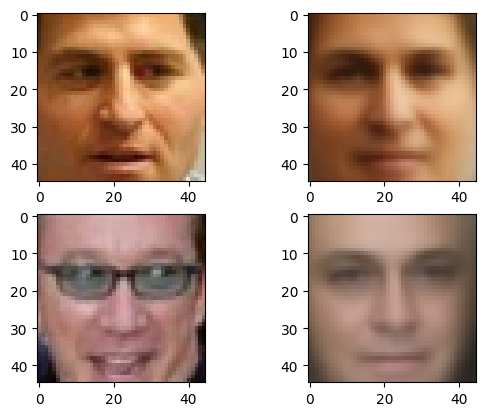

5/5 [==============================] - 1s 240ms/step - loss: 69.8937 - val_loss: 70.9723 - val_reconstruction_loss: 55.5125 - val_kl_loss: 15.4599
Epoch 248/500
5/5 [==============================] - 0s 95ms/step - loss: 69.9485 - val_loss: 71.1671 - val_reconstruction_loss: 55.8188 - val_kl_loss: 15.3483
Epoch 249/500
5/5 [==============================] - ETA: 0s - loss: 70.7086

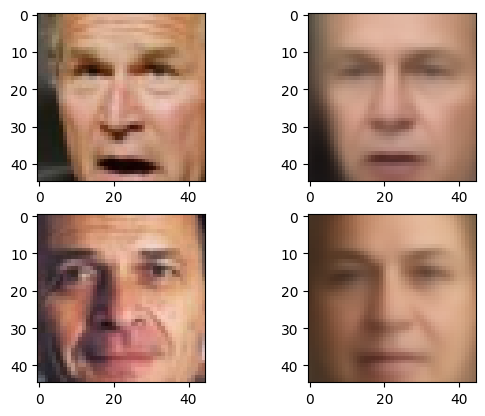

5/5 [==============================] - 1s 242ms/step - loss: 70.7086 - val_loss: 71.0057 - val_reconstruction_loss: 56.0238 - val_kl_loss: 14.9818
Epoch 250/500
5/5 [==============================] - 1s 113ms/step - loss: 69.9899 - val_loss: 71.1855 - val_reconstruction_loss: 55.9931 - val_kl_loss: 15.1924
Epoch 251/500
5/5 [==============================] - ETA: 0s - loss: 70.8632

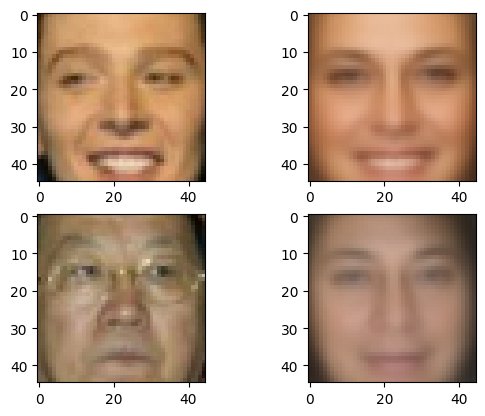

5/5 [==============================] - 1s 224ms/step - loss: 70.8632 - val_loss: 70.8493 - val_reconstruction_loss: 55.8707 - val_kl_loss: 14.9786
Epoch 252/500
5/5 [==============================] - 0s 103ms/step - loss: 71.0512 - val_loss: 71.7684 - val_reconstruction_loss: 56.1788 - val_kl_loss: 15.5897
Epoch 253/500
5/5 [==============================] - ETA: 0s - loss: 71.5736

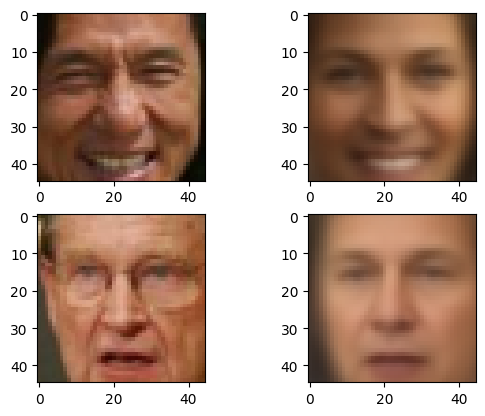

5/5 [==============================] - 2s 367ms/step - loss: 71.5736 - val_loss: 70.9957 - val_reconstruction_loss: 55.7142 - val_kl_loss: 15.2814
Epoch 254/500
5/5 [==============================] - 1s 161ms/step - loss: 70.6109 - val_loss: 70.6750 - val_reconstruction_loss: 55.2813 - val_kl_loss: 15.3937
Epoch 255/500
5/5 [==============================] - ETA: 0s - loss: 69.4346

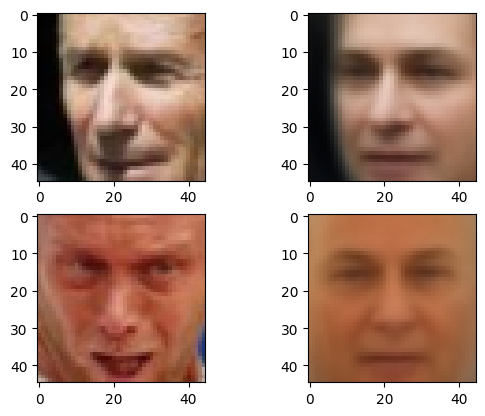

5/5 [==============================] - 1s 329ms/step - loss: 69.4346 - val_loss: 70.7777 - val_reconstruction_loss: 55.6020 - val_kl_loss: 15.1757
Epoch 256/500
5/5 [==============================] - 1s 126ms/step - loss: 70.2283 - val_loss: 70.7034 - val_reconstruction_loss: 55.3969 - val_kl_loss: 15.3065
Epoch 257/500
4/5 [=======================>......] - ETA: 0s - loss: 70.4500

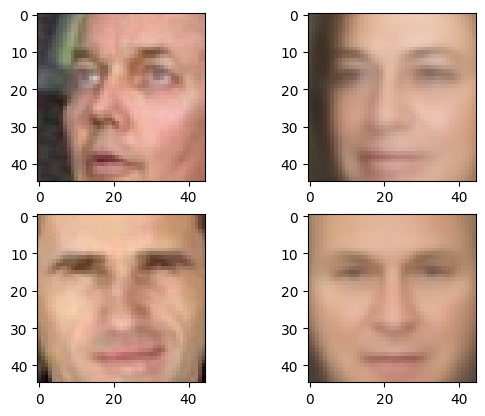

5/5 [==============================] - 1s 257ms/step - loss: 70.3569 - val_loss: 70.5462 - val_reconstruction_loss: 55.4268 - val_kl_loss: 15.1194
Epoch 258/500
5/5 [==============================] - 0s 100ms/step - loss: 70.1415 - val_loss: 71.3487 - val_reconstruction_loss: 56.3510 - val_kl_loss: 14.9976
Epoch 259/500
4/5 [=======================>......] - ETA: 0s - loss: 70.6125

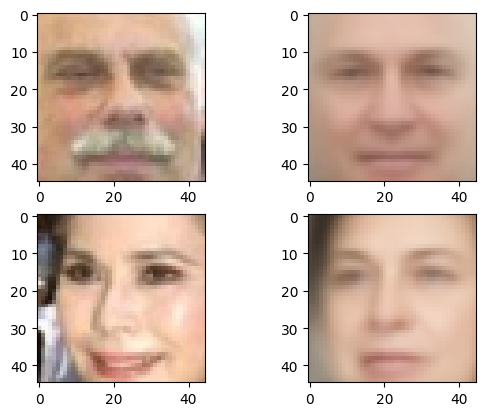

5/5 [==============================] - 1s 235ms/step - loss: 69.8361 - val_loss: 70.7484 - val_reconstruction_loss: 55.5361 - val_kl_loss: 15.2123
Epoch 260/500
5/5 [==============================] - 0s 105ms/step - loss: 71.4281 - val_loss: 70.8375 - val_reconstruction_loss: 55.5710 - val_kl_loss: 15.2666
Epoch 261/500
5/5 [==============================] - ETA: 0s - loss: 71.1343

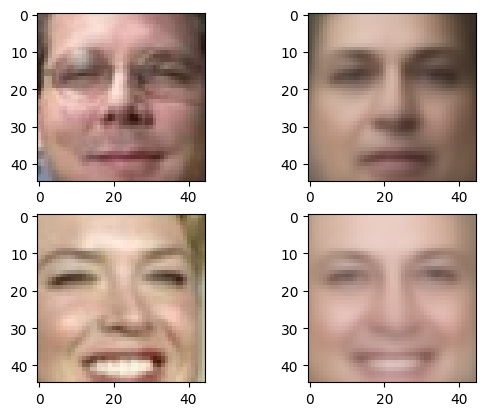

5/5 [==============================] - 1s 244ms/step - loss: 71.1343 - val_loss: 71.7371 - val_reconstruction_loss: 56.1521 - val_kl_loss: 15.5850
Epoch 262/500
5/5 [==============================] - 0s 97ms/step - loss: 70.9354 - val_loss: 71.3329 - val_reconstruction_loss: 56.0507 - val_kl_loss: 15.2822
Epoch 263/500
4/5 [=======================>......] - ETA: 0s - loss: 70.5437

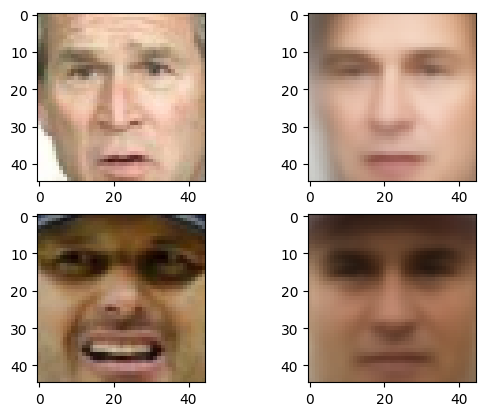

5/5 [==============================] - 1s 228ms/step - loss: 70.5536 - val_loss: 70.6375 - val_reconstruction_loss: 55.1390 - val_kl_loss: 15.4984
Epoch 264/500
5/5 [==============================] - 0s 99ms/step - loss: 70.5575 - val_loss: 70.7280 - val_reconstruction_loss: 55.3810 - val_kl_loss: 15.3470
Epoch 265/500
5/5 [==============================] - ETA: 0s - loss: 71.0220

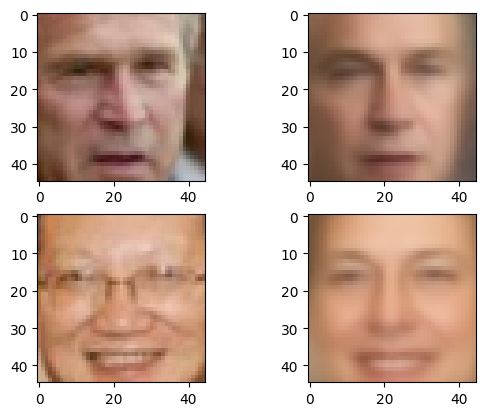

5/5 [==============================] - 1s 239ms/step - loss: 71.0220 - val_loss: 71.7599 - val_reconstruction_loss: 56.5878 - val_kl_loss: 15.1721
Epoch 266/500
5/5 [==============================] - 0s 91ms/step - loss: 69.9062 - val_loss: 70.6367 - val_reconstruction_loss: 55.3575 - val_kl_loss: 15.2792
Epoch 267/500
5/5 [==============================] - ETA: 0s - loss: 70.6083

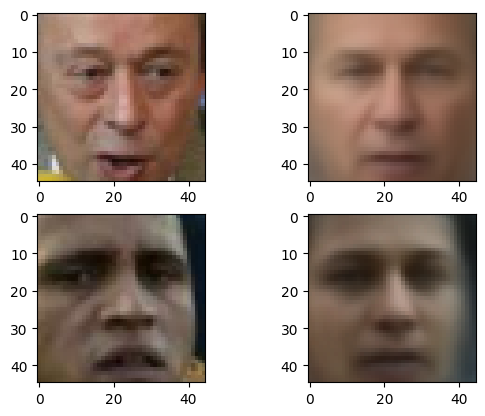

5/5 [==============================] - 1s 238ms/step - loss: 70.6083 - val_loss: 70.8543 - val_reconstruction_loss: 55.5773 - val_kl_loss: 15.2769
Epoch 268/500
5/5 [==============================] - 0s 108ms/step - loss: 70.0560 - val_loss: 71.1961 - val_reconstruction_loss: 55.7433 - val_kl_loss: 15.4528
Epoch 269/500
4/5 [=======================>......] - ETA: 0s - loss: 70.2954

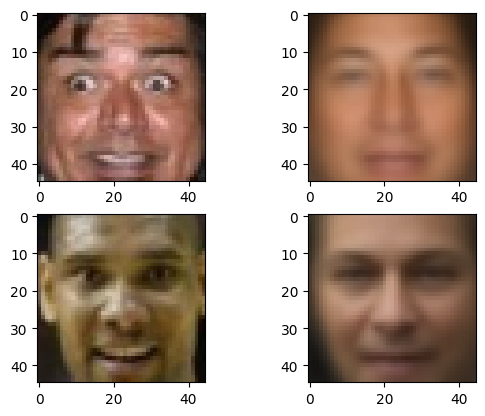

5/5 [==============================] - 1s 245ms/step - loss: 71.0592 - val_loss: 70.8042 - val_reconstruction_loss: 55.4707 - val_kl_loss: 15.3335
Epoch 270/500
5/5 [==============================] - 1s 122ms/step - loss: 71.4561 - val_loss: 70.4312 - val_reconstruction_loss: 55.4014 - val_kl_loss: 15.0299
Epoch 271/500
4/5 [=======================>......] - ETA: 0s - loss: 70.7435

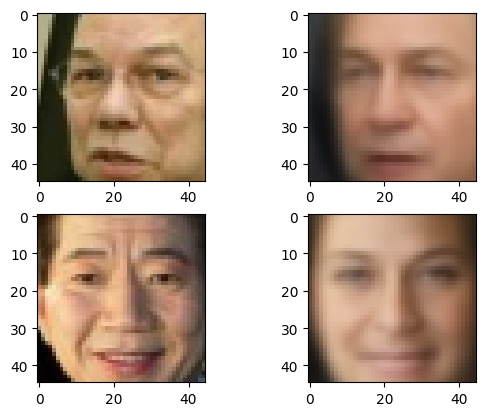

5/5 [==============================] - 1s 322ms/step - loss: 69.7814 - val_loss: 70.6482 - val_reconstruction_loss: 55.0093 - val_kl_loss: 15.6389
Epoch 272/500
5/5 [==============================] - 1s 126ms/step - loss: 70.6285 - val_loss: 71.9044 - val_reconstruction_loss: 57.0297 - val_kl_loss: 14.8747
Epoch 273/500
5/5 [==============================] - ETA: 0s - loss: 69.9615

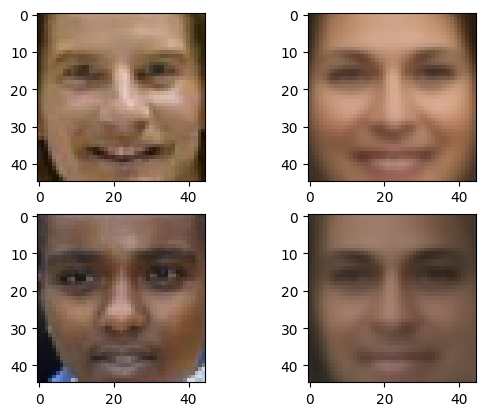

5/5 [==============================] - 1s 346ms/step - loss: 69.9615 - val_loss: 71.0957 - val_reconstruction_loss: 56.1104 - val_kl_loss: 14.9853
Epoch 274/500
5/5 [==============================] - 0s 109ms/step - loss: 69.8362 - val_loss: 70.9285 - val_reconstruction_loss: 55.8469 - val_kl_loss: 15.0816
Epoch 275/500
5/5 [==============================] - ETA: 0s - loss: 70.2775

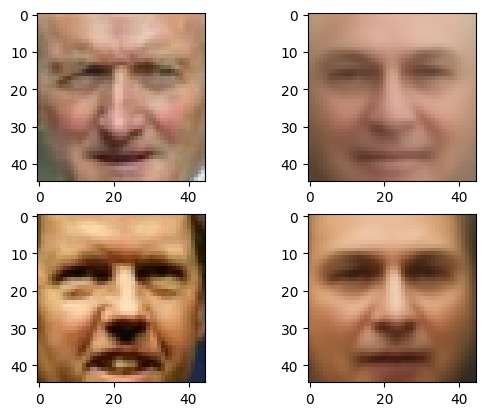

5/5 [==============================] - 1s 330ms/step - loss: 70.2775 - val_loss: 70.8071 - val_reconstruction_loss: 55.6537 - val_kl_loss: 15.1534
Epoch 276/500
5/5 [==============================] - 0s 102ms/step - loss: 70.9227 - val_loss: 71.1278 - val_reconstruction_loss: 55.8666 - val_kl_loss: 15.2612
Epoch 277/500
5/5 [==============================] - ETA: 0s - loss: 71.6616

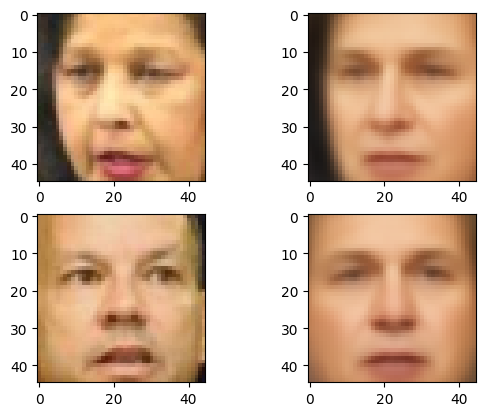

5/5 [==============================] - 1s 250ms/step - loss: 71.6616 - val_loss: 71.0487 - val_reconstruction_loss: 55.8871 - val_kl_loss: 15.1616
Epoch 278/500
5/5 [==============================] - 0s 104ms/step - loss: 72.0470 - val_loss: 70.5212 - val_reconstruction_loss: 55.3998 - val_kl_loss: 15.1214
Epoch 279/500
4/5 [=======================>......] - ETA: 0s - loss: 69.9956

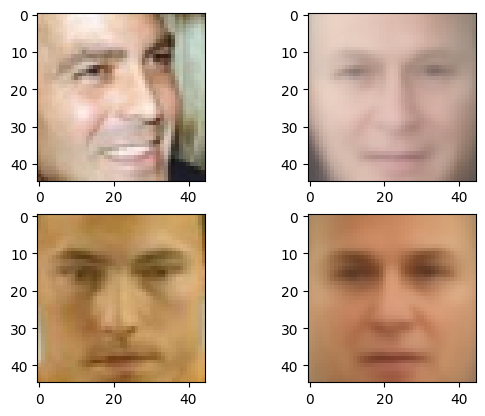

5/5 [==============================] - 1s 243ms/step - loss: 70.8868 - val_loss: 70.8281 - val_reconstruction_loss: 55.4392 - val_kl_loss: 15.3889
Epoch 280/500
5/5 [==============================] - 0s 93ms/step - loss: 70.3433 - val_loss: 70.3570 - val_reconstruction_loss: 55.3046 - val_kl_loss: 15.0524
Epoch 281/500
5/5 [==============================] - ETA: 0s - loss: 70.2766

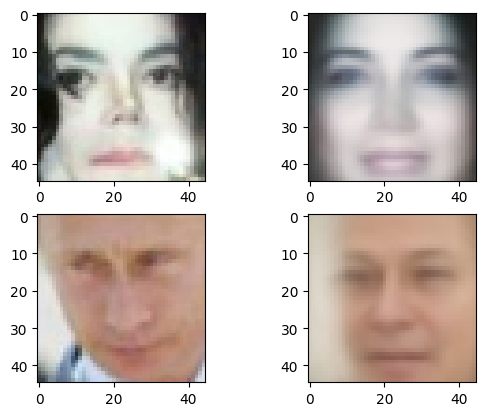

5/5 [==============================] - 1s 224ms/step - loss: 70.2766 - val_loss: 70.5614 - val_reconstruction_loss: 55.0397 - val_kl_loss: 15.5217
Epoch 282/500
5/5 [==============================] - 0s 92ms/step - loss: 69.5458 - val_loss: 71.0352 - val_reconstruction_loss: 56.3206 - val_kl_loss: 14.7145
Epoch 283/500
5/5 [==============================] - ETA: 0s - loss: 72.0171

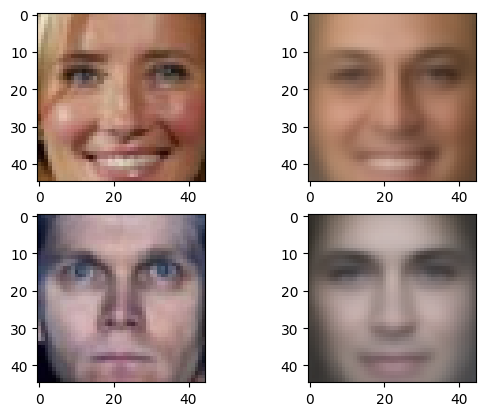

5/5 [==============================] - 1s 234ms/step - loss: 72.0171 - val_loss: 70.6344 - val_reconstruction_loss: 55.2462 - val_kl_loss: 15.3882
Epoch 284/500
5/5 [==============================] - 0s 94ms/step - loss: 70.1760 - val_loss: 70.5058 - val_reconstruction_loss: 55.1893 - val_kl_loss: 15.3165
Epoch 285/500
5/5 [==============================] - ETA: 0s - loss: 70.5901

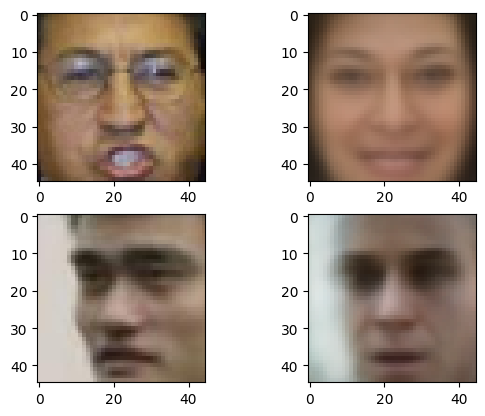

5/5 [==============================] - 1s 242ms/step - loss: 70.5901 - val_loss: 70.8468 - val_reconstruction_loss: 55.5888 - val_kl_loss: 15.2580
Epoch 286/500
5/5 [==============================] - 0s 101ms/step - loss: 71.0353 - val_loss: 70.5966 - val_reconstruction_loss: 55.1036 - val_kl_loss: 15.4930
Epoch 287/500
5/5 [==============================] - ETA: 0s - loss: 72.0606

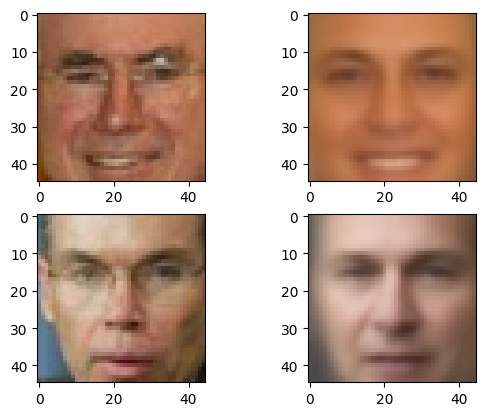

5/5 [==============================] - 1s 288ms/step - loss: 72.0606 - val_loss: 72.2530 - val_reconstruction_loss: 57.2399 - val_kl_loss: 15.0131
Epoch 288/500
5/5 [==============================] - 0s 107ms/step - loss: 71.1839 - val_loss: 71.5004 - val_reconstruction_loss: 56.4076 - val_kl_loss: 15.0928
Epoch 289/500
5/5 [==============================] - ETA: 0s - loss: 70.5569

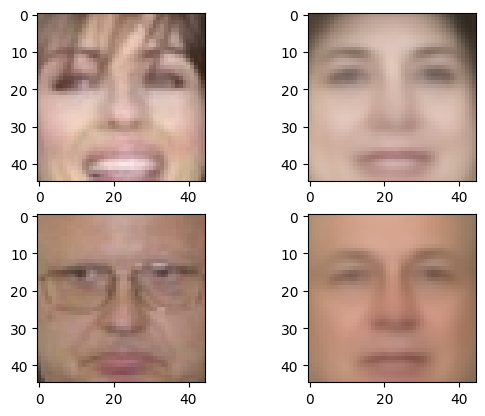

5/5 [==============================] - 1s 293ms/step - loss: 70.5569 - val_loss: 71.0702 - val_reconstruction_loss: 56.1027 - val_kl_loss: 14.9675
Epoch 290/500
5/5 [==============================] - 1s 157ms/step - loss: 70.3400 - val_loss: 70.9185 - val_reconstruction_loss: 55.4391 - val_kl_loss: 15.4794
Epoch 291/500
5/5 [==============================] - ETA: 0s - loss: 70.1055

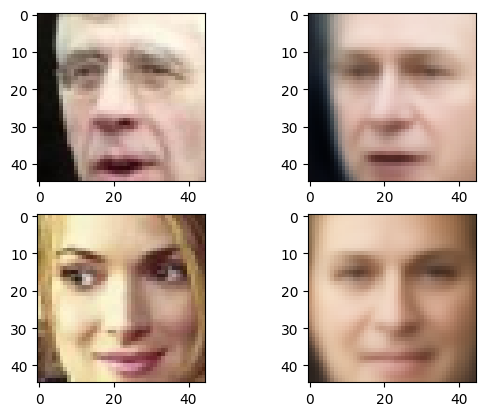

5/5 [==============================] - 1s 287ms/step - loss: 70.1055 - val_loss: 70.4674 - val_reconstruction_loss: 55.2049 - val_kl_loss: 15.2625
Epoch 292/500
5/5 [==============================] - 0s 102ms/step - loss: 70.5518 - val_loss: 70.4633 - val_reconstruction_loss: 55.0752 - val_kl_loss: 15.3881
Epoch 293/500
5/5 [==============================] - ETA: 0s - loss: 70.0241

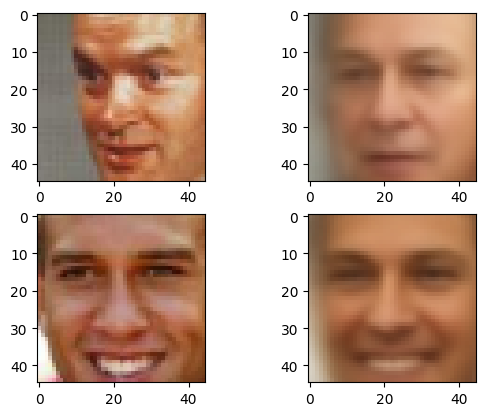

5/5 [==============================] - 1s 261ms/step - loss: 70.0241 - val_loss: 70.2209 - val_reconstruction_loss: 54.9543 - val_kl_loss: 15.2666
Epoch 294/500
5/5 [==============================] - 0s 101ms/step - loss: 70.2812 - val_loss: 70.5545 - val_reconstruction_loss: 55.5851 - val_kl_loss: 14.9694
Epoch 295/500
5/5 [==============================] - ETA: 0s - loss: 70.1692

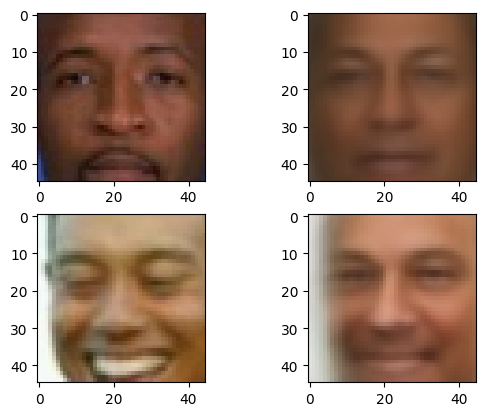

5/5 [==============================] - 1s 269ms/step - loss: 70.1692 - val_loss: 70.9698 - val_reconstruction_loss: 55.7306 - val_kl_loss: 15.2392
Epoch 296/500
5/5 [==============================] - 0s 99ms/step - loss: 70.6632 - val_loss: 71.0135 - val_reconstruction_loss: 55.2549 - val_kl_loss: 15.7586
Epoch 297/500
5/5 [==============================] - ETA: 0s - loss: 70.4147

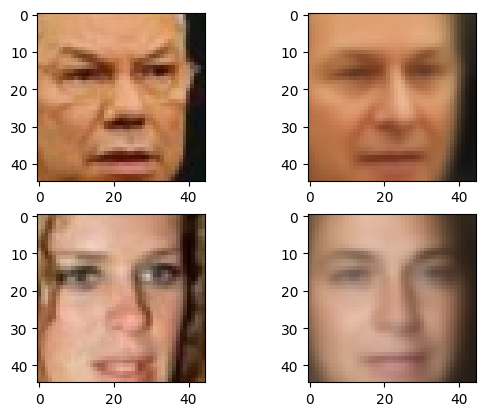

5/5 [==============================] - 1s 257ms/step - loss: 70.4147 - val_loss: 70.1568 - val_reconstruction_loss: 54.7495 - val_kl_loss: 15.4073
Epoch 298/500
5/5 [==============================] - 0s 103ms/step - loss: 71.1462 - val_loss: 70.6463 - val_reconstruction_loss: 55.1048 - val_kl_loss: 15.5415
Epoch 299/500
5/5 [==============================] - ETA: 0s - loss: 70.6476

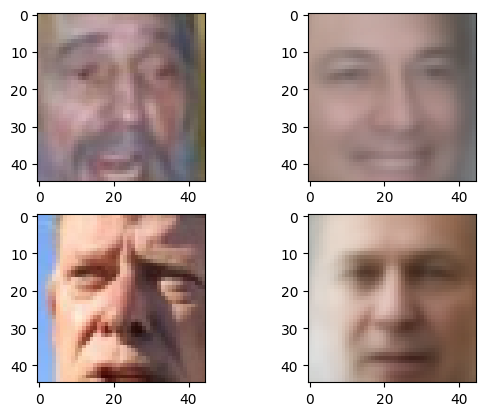

5/5 [==============================] - 1s 360ms/step - loss: 70.6476 - val_loss: 71.1034 - val_reconstruction_loss: 55.9606 - val_kl_loss: 15.1428
Epoch 300/500
5/5 [==============================] - 0s 102ms/step - loss: 69.3747 - val_loss: 70.8746 - val_reconstruction_loss: 55.7866 - val_kl_loss: 15.0880
Epoch 301/500
5/5 [==============================] - ETA: 0s - loss: 69.5623

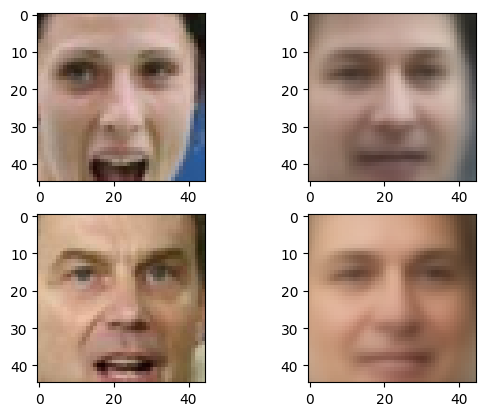

5/5 [==============================] - 1s 252ms/step - loss: 69.5623 - val_loss: 70.6910 - val_reconstruction_loss: 55.6264 - val_kl_loss: 15.0646
Epoch 302/500
5/5 [==============================] - 0s 102ms/step - loss: 70.6459 - val_loss: 70.5175 - val_reconstruction_loss: 55.0483 - val_kl_loss: 15.4692
Epoch 303/500
5/5 [==============================] - ETA: 0s - loss: 69.9820

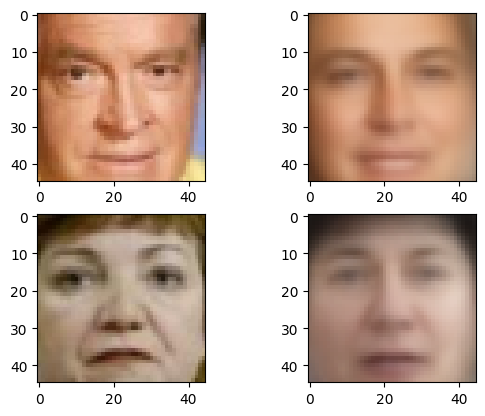

5/5 [==============================] - 1s 272ms/step - loss: 69.9820 - val_loss: 70.2997 - val_reconstruction_loss: 55.2345 - val_kl_loss: 15.0652
Epoch 304/500
5/5 [==============================] - 0s 104ms/step - loss: 69.9100 - val_loss: 70.3503 - val_reconstruction_loss: 54.6403 - val_kl_loss: 15.7101
Epoch 305/500
5/5 [==============================] - ETA: 0s - loss: 69.8900

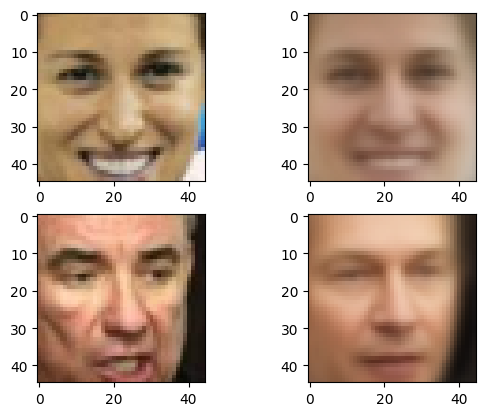

5/5 [==============================] - 1s 344ms/step - loss: 69.8900 - val_loss: 70.2004 - val_reconstruction_loss: 54.9792 - val_kl_loss: 15.2212
Epoch 306/500
5/5 [==============================] - 1s 166ms/step - loss: 70.4970 - val_loss: 70.1039 - val_reconstruction_loss: 54.7034 - val_kl_loss: 15.4005
Epoch 307/500
5/5 [==============================] - ETA: 0s - loss: 69.1288

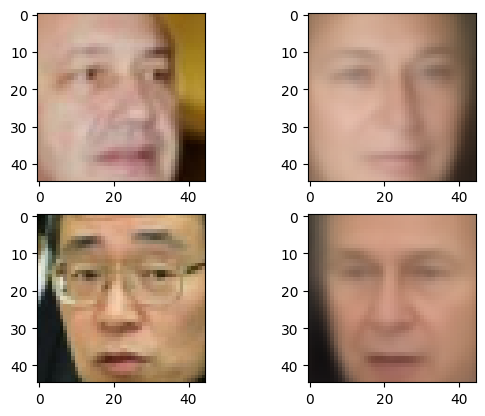

5/5 [==============================] - 1s 299ms/step - loss: 69.1288 - val_loss: 69.9536 - val_reconstruction_loss: 54.6230 - val_kl_loss: 15.3306
Epoch 308/500
5/5 [==============================] - 0s 98ms/step - loss: 70.1344 - val_loss: 70.0312 - val_reconstruction_loss: 54.7678 - val_kl_loss: 15.2634
Epoch 309/500
5/5 [==============================] - ETA: 0s - loss: 69.5830

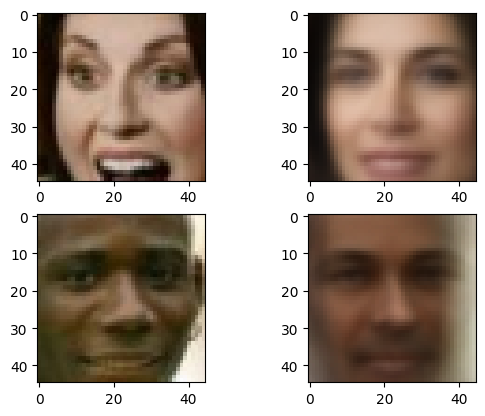

5/5 [==============================] - 1s 258ms/step - loss: 69.5830 - val_loss: 70.5228 - val_reconstruction_loss: 55.3031 - val_kl_loss: 15.2197
Epoch 310/500
5/5 [==============================] - 0s 104ms/step - loss: 72.8854 - val_loss: 72.7340 - val_reconstruction_loss: 57.1811 - val_kl_loss: 15.5528
Epoch 311/500
5/5 [==============================] - ETA: 0s - loss: 71.3031

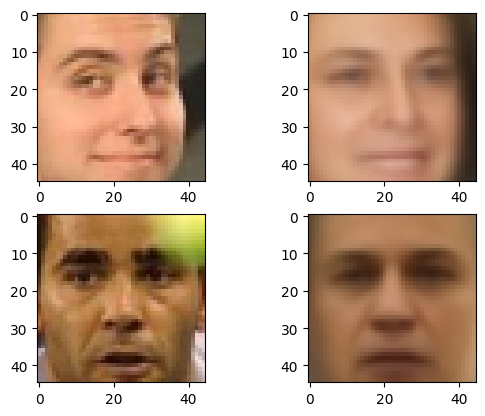

5/5 [==============================] - 1s 266ms/step - loss: 71.3031 - val_loss: 70.7139 - val_reconstruction_loss: 55.1436 - val_kl_loss: 15.5703
Epoch 312/500
5/5 [==============================] - 0s 100ms/step - loss: 69.1330 - val_loss: 70.2578 - val_reconstruction_loss: 54.8511 - val_kl_loss: 15.4067
Epoch 313/500
5/5 [==============================] - ETA: 0s - loss: 71.3627

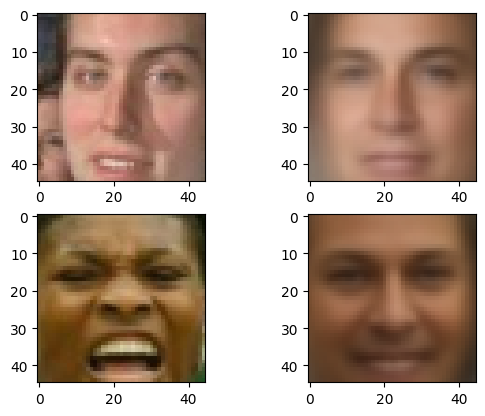

5/5 [==============================] - 1s 266ms/step - loss: 71.3627 - val_loss: 70.4871 - val_reconstruction_loss: 54.6769 - val_kl_loss: 15.8102
Epoch 314/500
5/5 [==============================] - 0s 98ms/step - loss: 69.7161 - val_loss: 70.0347 - val_reconstruction_loss: 54.9514 - val_kl_loss: 15.0833
Epoch 315/500
5/5 [==============================] - ETA: 0s - loss: 70.2945

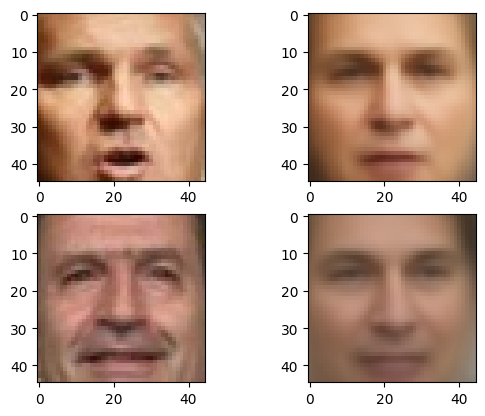

5/5 [==============================] - 1s 247ms/step - loss: 70.2945 - val_loss: 71.5950 - val_reconstruction_loss: 55.8193 - val_kl_loss: 15.7757
Epoch 316/500
5/5 [==============================] - 0s 82ms/step - loss: 70.5936 - val_loss: 70.4689 - val_reconstruction_loss: 54.7794 - val_kl_loss: 15.6896
Epoch 317/500
5/5 [==============================] - ETA: 0s - loss: 69.5183

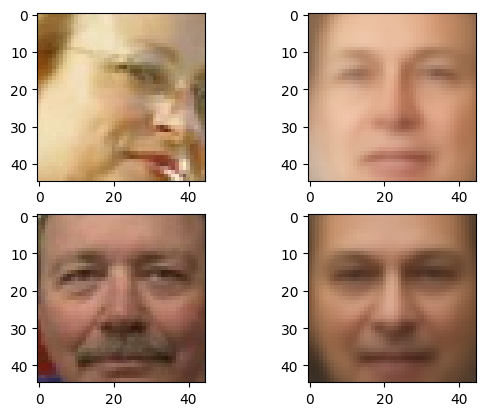

5/5 [==============================] - 1s 245ms/step - loss: 69.5183 - val_loss: 70.2440 - val_reconstruction_loss: 54.8464 - val_kl_loss: 15.3975
Epoch 318/500
5/5 [==============================] - 0s 97ms/step - loss: 69.5359 - val_loss: 70.4200 - val_reconstruction_loss: 54.8829 - val_kl_loss: 15.5371
Epoch 319/500
5/5 [==============================] - ETA: 0s - loss: 69.7774

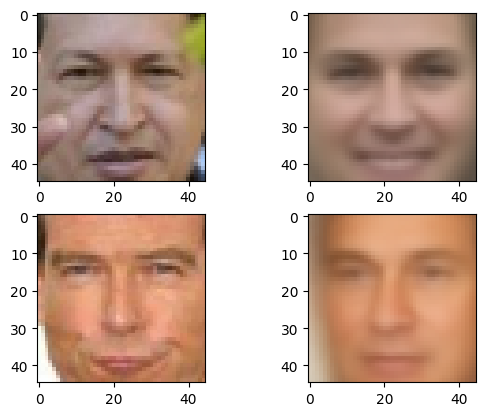

5/5 [==============================] - 1s 271ms/step - loss: 69.7774 - val_loss: 70.2219 - val_reconstruction_loss: 54.8553 - val_kl_loss: 15.3665
Epoch 320/500
5/5 [==============================] - 0s 89ms/step - loss: 69.4360 - val_loss: 70.4346 - val_reconstruction_loss: 54.9226 - val_kl_loss: 15.5120
Epoch 321/500
5/5 [==============================] - ETA: 0s - loss: 69.4956

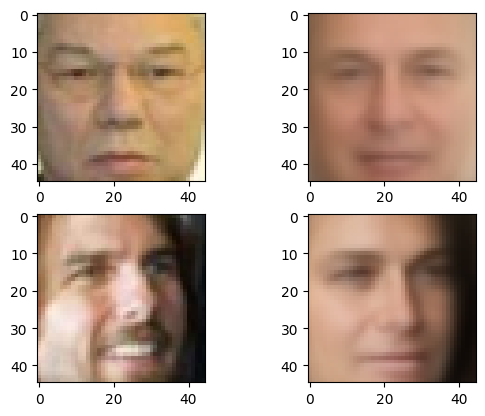

5/5 [==============================] - 1s 287ms/step - loss: 69.4956 - val_loss: 70.5715 - val_reconstruction_loss: 55.3249 - val_kl_loss: 15.2466
Epoch 322/500
5/5 [==============================] - 0s 106ms/step - loss: 68.7879 - val_loss: 70.1079 - val_reconstruction_loss: 54.9681 - val_kl_loss: 15.1398
Epoch 323/500
5/5 [==============================] - ETA: 0s - loss: 69.6431

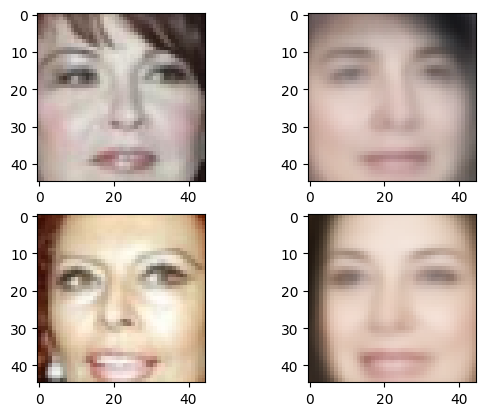

5/5 [==============================] - 2s 444ms/step - loss: 69.6431 - val_loss: 69.8944 - val_reconstruction_loss: 54.3304 - val_kl_loss: 15.5640
Epoch 324/500
5/5 [==============================] - 1s 156ms/step - loss: 69.5121 - val_loss: 70.3067 - val_reconstruction_loss: 54.9139 - val_kl_loss: 15.3929
Epoch 325/500
5/5 [==============================] - ETA: 0s - loss: 70.2597

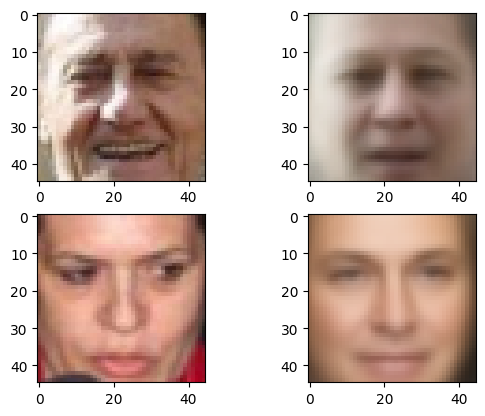

5/5 [==============================] - 1s 267ms/step - loss: 70.2597 - val_loss: 70.0470 - val_reconstruction_loss: 54.7285 - val_kl_loss: 15.3185
Epoch 326/500
5/5 [==============================] - 0s 104ms/step - loss: 70.3269 - val_loss: 70.1324 - val_reconstruction_loss: 55.0027 - val_kl_loss: 15.1296
Epoch 327/500
5/5 [==============================] - ETA: 0s - loss: 70.4186

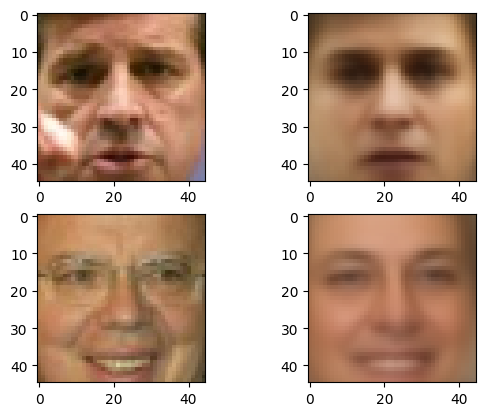

5/5 [==============================] - 1s 315ms/step - loss: 70.4186 - val_loss: 70.6125 - val_reconstruction_loss: 54.8317 - val_kl_loss: 15.7807
Epoch 328/500
5/5 [==============================] - 0s 106ms/step - loss: 68.6255 - val_loss: 70.0339 - val_reconstruction_loss: 54.4789 - val_kl_loss: 15.5550
Epoch 329/500
5/5 [==============================] - ETA: 0s - loss: 70.6162

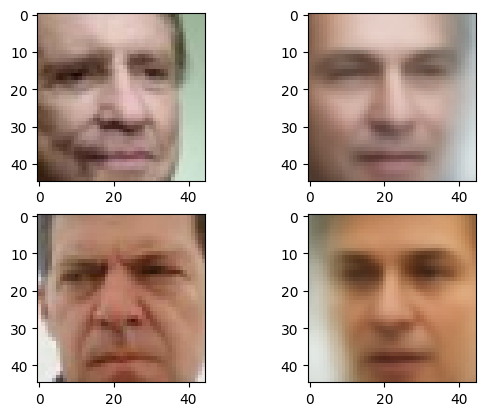

5/5 [==============================] - 1s 273ms/step - loss: 70.6162 - val_loss: 70.4435 - val_reconstruction_loss: 55.0988 - val_kl_loss: 15.3447
Epoch 330/500
5/5 [==============================] - 0s 103ms/step - loss: 69.4091 - val_loss: 69.8714 - val_reconstruction_loss: 54.5912 - val_kl_loss: 15.2802
Epoch 331/500
5/5 [==============================] - ETA: 0s - loss: 69.5719

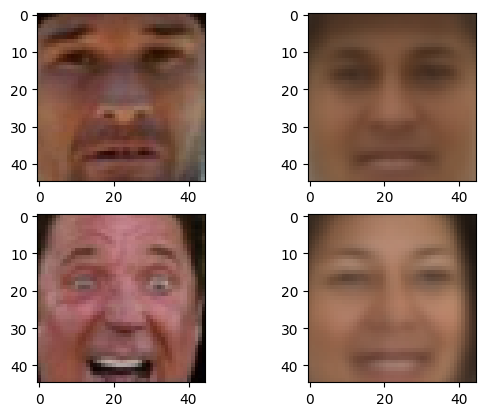

5/5 [==============================] - 1s 266ms/step - loss: 69.5719 - val_loss: 69.9253 - val_reconstruction_loss: 54.3027 - val_kl_loss: 15.6226
Epoch 332/500
5/5 [==============================] - 0s 94ms/step - loss: 70.5150 - val_loss: 70.6129 - val_reconstruction_loss: 55.0609 - val_kl_loss: 15.5519
Epoch 333/500
5/5 [==============================] - ETA: 0s - loss: 69.5389

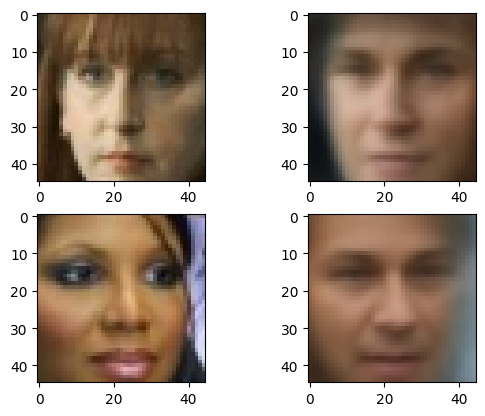

5/5 [==============================] - 1s 257ms/step - loss: 69.5389 - val_loss: 70.0358 - val_reconstruction_loss: 54.6605 - val_kl_loss: 15.3754
Epoch 334/500
5/5 [==============================] - 0s 103ms/step - loss: 69.8349 - val_loss: 70.6380 - val_reconstruction_loss: 55.6036 - val_kl_loss: 15.0344
Epoch 335/500
5/5 [==============================] - ETA: 0s - loss: 70.3499

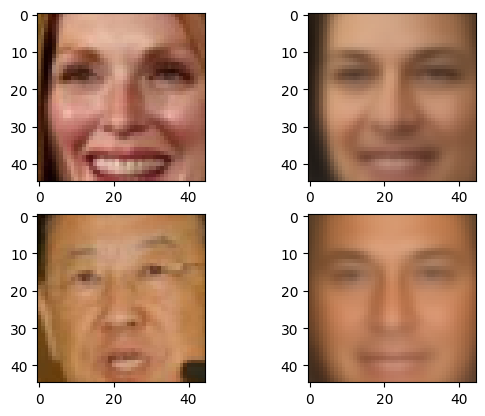

5/5 [==============================] - 1s 259ms/step - loss: 70.3499 - val_loss: 69.9702 - val_reconstruction_loss: 54.5962 - val_kl_loss: 15.3740
Epoch 336/500
5/5 [==============================] - 0s 96ms/step - loss: 69.2917 - val_loss: 70.3655 - val_reconstruction_loss: 55.1964 - val_kl_loss: 15.1692
Epoch 337/500
5/5 [==============================] - ETA: 0s - loss: 69.5710

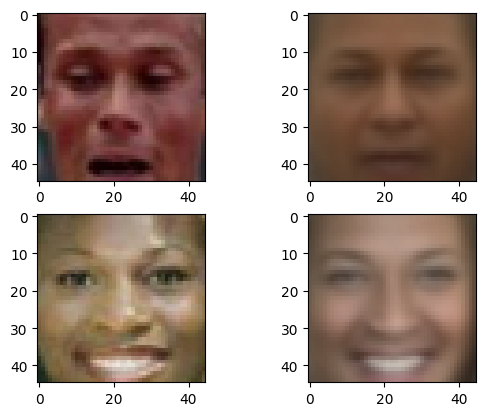

5/5 [==============================] - 1s 307ms/step - loss: 69.5710 - val_loss: 69.8171 - val_reconstruction_loss: 54.3109 - val_kl_loss: 15.5062
Epoch 338/500
5/5 [==============================] - 1s 129ms/step - loss: 69.3394 - val_loss: 69.8076 - val_reconstruction_loss: 54.4329 - val_kl_loss: 15.3747
Epoch 339/500
5/5 [==============================] - ETA: 0s - loss: 68.5666

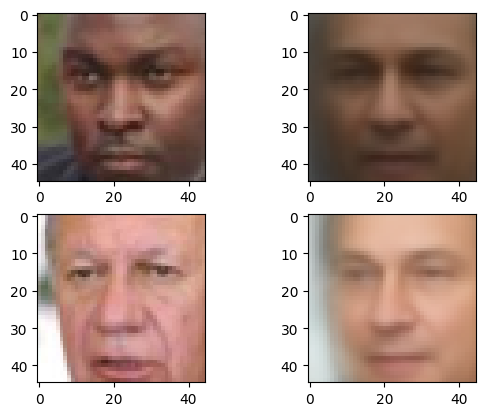

5/5 [==============================] - 1s 291ms/step - loss: 68.5666 - val_loss: 69.9578 - val_reconstruction_loss: 54.5306 - val_kl_loss: 15.4272
Epoch 340/500
5/5 [==============================] - 1s 122ms/step - loss: 69.6870 - val_loss: 69.6977 - val_reconstruction_loss: 54.5234 - val_kl_loss: 15.1743
Epoch 341/500
4/5 [=======================>......] - ETA: 0s - loss: 70.3560

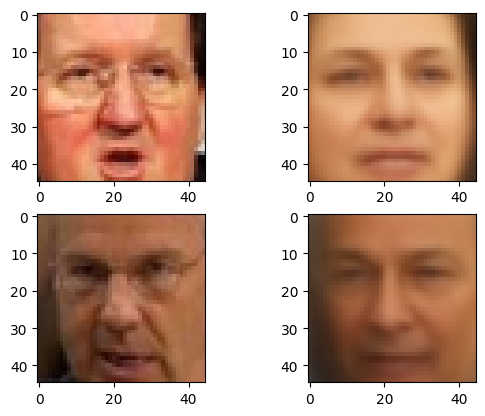

5/5 [==============================] - 1s 282ms/step - loss: 70.8247 - val_loss: 72.0339 - val_reconstruction_loss: 57.1708 - val_kl_loss: 14.8631
Epoch 342/500
5/5 [==============================] - 0s 102ms/step - loss: 69.4413 - val_loss: 70.5828 - val_reconstruction_loss: 55.2420 - val_kl_loss: 15.3408
Epoch 343/500
5/5 [==============================] - ETA: 0s - loss: 70.6504

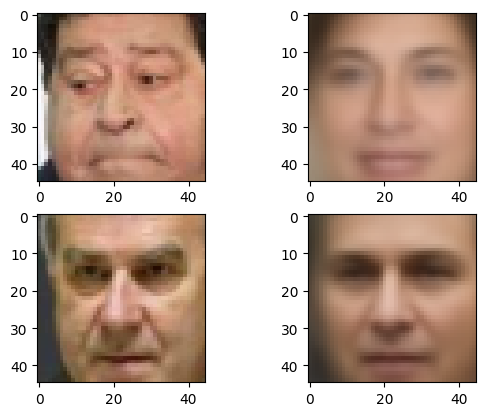

5/5 [==============================] - 1s 267ms/step - loss: 70.6504 - val_loss: 70.5884 - val_reconstruction_loss: 54.6619 - val_kl_loss: 15.9265
Epoch 344/500
5/5 [==============================] - 0s 99ms/step - loss: 70.7285 - val_loss: 70.0385 - val_reconstruction_loss: 54.6870 - val_kl_loss: 15.3515
Epoch 345/500
5/5 [==============================] - ETA: 0s - loss: 70.3767

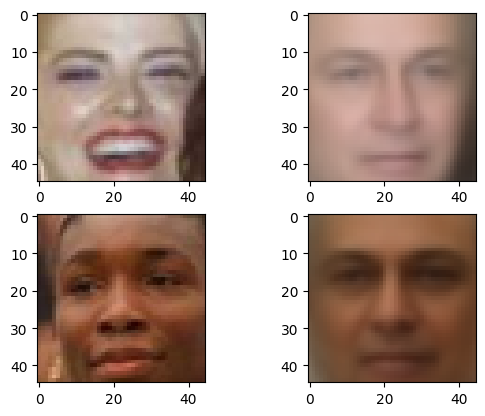

5/5 [==============================] - 1s 261ms/step - loss: 70.3767 - val_loss: 69.7443 - val_reconstruction_loss: 54.3128 - val_kl_loss: 15.4315
Epoch 346/500
5/5 [==============================] - 0s 108ms/step - loss: 70.1146 - val_loss: 71.0102 - val_reconstruction_loss: 55.3789 - val_kl_loss: 15.6313
Epoch 347/500
5/5 [==============================] - ETA: 0s - loss: 69.4413

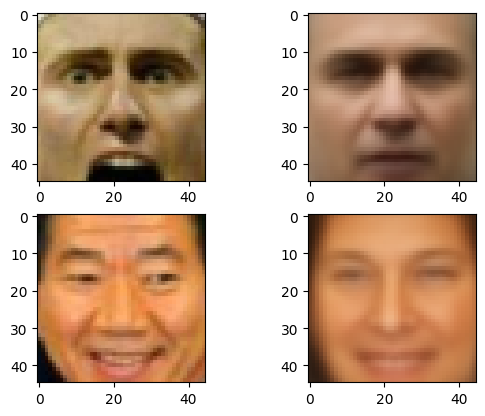

5/5 [==============================] - 1s 362ms/step - loss: 69.4413 - val_loss: 69.8658 - val_reconstruction_loss: 54.5203 - val_kl_loss: 15.3455
Epoch 348/500
5/5 [==============================] - 0s 109ms/step - loss: 69.2986 - val_loss: 69.9456 - val_reconstruction_loss: 54.2174 - val_kl_loss: 15.7283
Epoch 349/500
5/5 [==============================] - ETA: 0s - loss: 68.4131

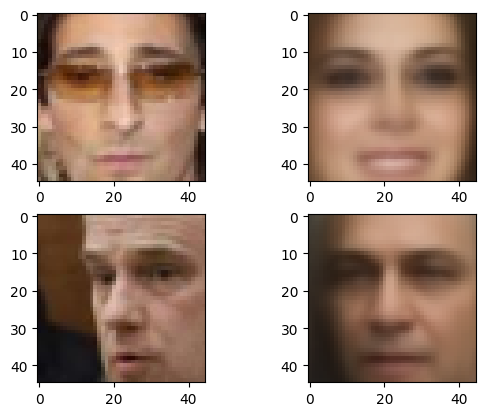

5/5 [==============================] - 1s 245ms/step - loss: 68.4131 - val_loss: 69.7990 - val_reconstruction_loss: 54.2681 - val_kl_loss: 15.5309
Epoch 350/500
5/5 [==============================] - 0s 100ms/step - loss: 69.1965 - val_loss: 69.8273 - val_reconstruction_loss: 54.2572 - val_kl_loss: 15.5702
Epoch 351/500
5/5 [==============================] - ETA: 0s - loss: 70.0239

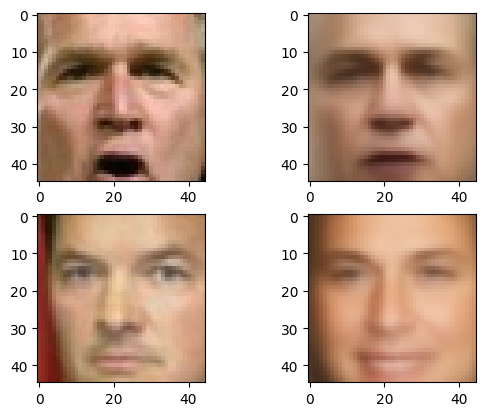

5/5 [==============================] - 1s 272ms/step - loss: 70.0239 - val_loss: 70.9041 - val_reconstruction_loss: 55.4114 - val_kl_loss: 15.4927
Epoch 352/500
5/5 [==============================] - 0s 102ms/step - loss: 69.5191 - val_loss: 70.1817 - val_reconstruction_loss: 54.8227 - val_kl_loss: 15.3590
Epoch 353/500
5/5 [==============================] - ETA: 0s - loss: 70.9267

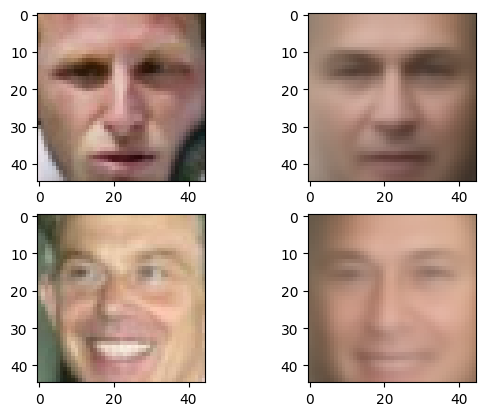

5/5 [==============================] - 1s 301ms/step - loss: 70.9267 - val_loss: 70.5565 - val_reconstruction_loss: 55.0596 - val_kl_loss: 15.4969
Epoch 354/500
5/5 [==============================] - 1s 118ms/step - loss: 69.2795 - val_loss: 70.1752 - val_reconstruction_loss: 54.4967 - val_kl_loss: 15.6784
Epoch 355/500
5/5 [==============================] - ETA: 0s - loss: 68.8670

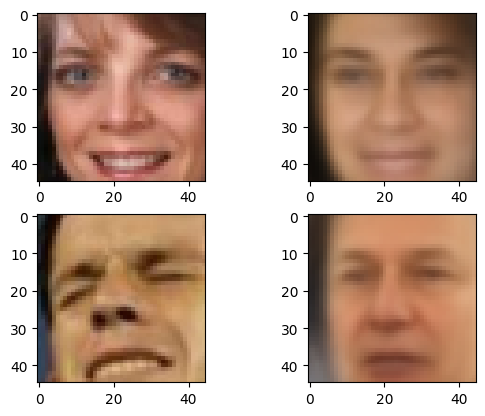

5/5 [==============================] - 1s 299ms/step - loss: 68.8670 - val_loss: 70.0680 - val_reconstruction_loss: 54.8790 - val_kl_loss: 15.1891
Epoch 356/500
5/5 [==============================] - 1s 118ms/step - loss: 69.1003 - val_loss: 69.5759 - val_reconstruction_loss: 53.8846 - val_kl_loss: 15.6912
Epoch 357/500
5/5 [==============================] - ETA: 0s - loss: 70.2790

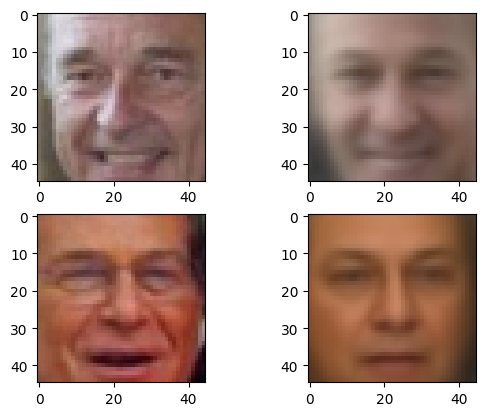

5/5 [==============================] - 1s 289ms/step - loss: 70.2790 - val_loss: 69.3766 - val_reconstruction_loss: 53.8213 - val_kl_loss: 15.5552
Epoch 358/500
5/5 [==============================] - 0s 92ms/step - loss: 68.7139 - val_loss: 69.5918 - val_reconstruction_loss: 53.9133 - val_kl_loss: 15.6785
Epoch 359/500
5/5 [==============================] - ETA: 0s - loss: 70.2991

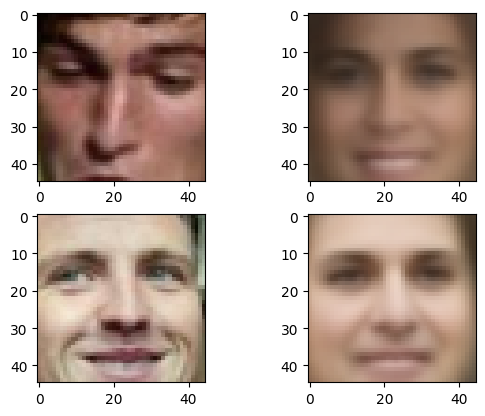

5/5 [==============================] - 1s 276ms/step - loss: 70.2991 - val_loss: 71.4121 - val_reconstruction_loss: 56.2614 - val_kl_loss: 15.1508
Epoch 360/500
5/5 [==============================] - 0s 97ms/step - loss: 68.6830 - val_loss: 70.2978 - val_reconstruction_loss: 55.0845 - val_kl_loss: 15.2133
Epoch 361/500
5/5 [==============================] - ETA: 0s - loss: 68.7146

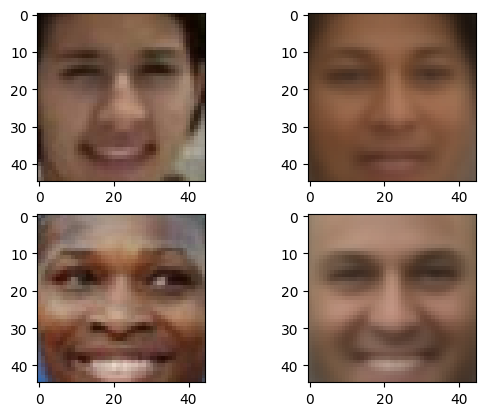

5/5 [==============================] - 1s 268ms/step - loss: 68.7146 - val_loss: 69.7628 - val_reconstruction_loss: 54.5262 - val_kl_loss: 15.2366
Epoch 362/500
5/5 [==============================] - 0s 96ms/step - loss: 69.1098 - val_loss: 69.7119 - val_reconstruction_loss: 54.1825 - val_kl_loss: 15.5294
Epoch 363/500
4/5 [=======================>......] - ETA: 0s - loss: 68.1613

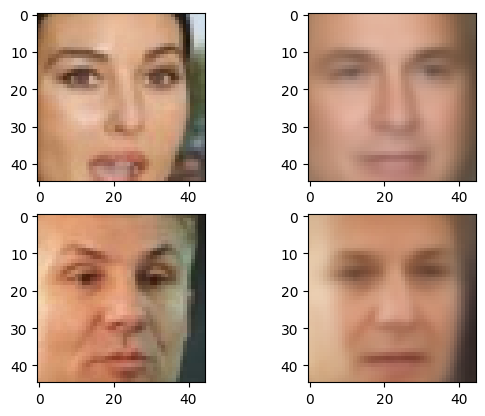

5/5 [==============================] - 1s 270ms/step - loss: 69.9075 - val_loss: 69.4874 - val_reconstruction_loss: 54.1519 - val_kl_loss: 15.3355
Epoch 364/500
5/5 [==============================] - 0s 100ms/step - loss: 68.5481 - val_loss: 69.8163 - val_reconstruction_loss: 54.1399 - val_kl_loss: 15.6765
Epoch 365/500
4/5 [=======================>......] - ETA: 0s - loss: 69.3180

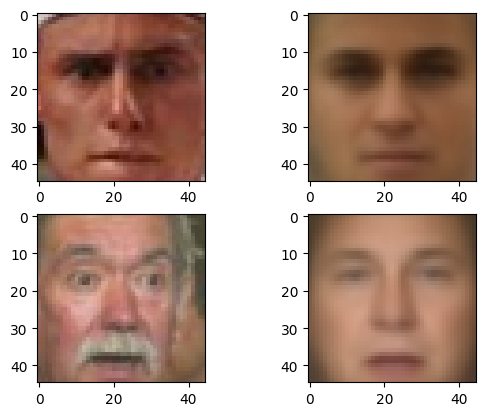

5/5 [==============================] - 1s 265ms/step - loss: 70.2190 - val_loss: 69.4977 - val_reconstruction_loss: 54.0796 - val_kl_loss: 15.4181
Epoch 366/500
5/5 [==============================] - 0s 93ms/step - loss: 70.4529 - val_loss: 69.9448 - val_reconstruction_loss: 54.7276 - val_kl_loss: 15.2172
Epoch 367/500
5/5 [==============================] - ETA: 0s - loss: 68.9697

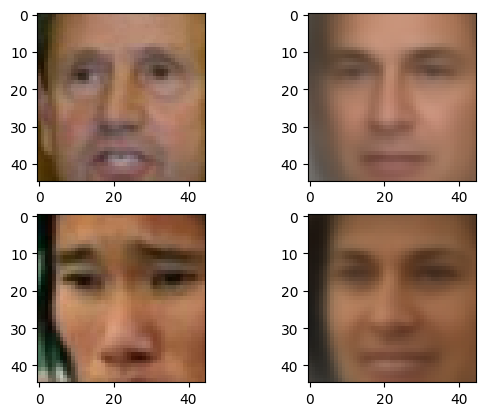

5/5 [==============================] - 1s 257ms/step - loss: 68.9697 - val_loss: 69.5921 - val_reconstruction_loss: 53.7974 - val_kl_loss: 15.7947
Epoch 368/500
5/5 [==============================] - 0s 99ms/step - loss: 70.4047 - val_loss: 70.5279 - val_reconstruction_loss: 54.8747 - val_kl_loss: 15.6532
Epoch 369/500
5/5 [==============================] - ETA: 0s - loss: 69.1120

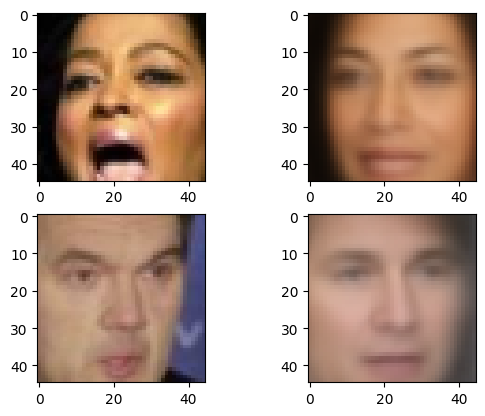

5/5 [==============================] - 1s 349ms/step - loss: 69.1120 - val_loss: 69.4309 - val_reconstruction_loss: 53.7803 - val_kl_loss: 15.6506
Epoch 370/500
5/5 [==============================] - 1s 151ms/step - loss: 68.4696 - val_loss: 69.8924 - val_reconstruction_loss: 54.2222 - val_kl_loss: 15.6702
Epoch 371/500
5/5 [==============================] - ETA: 0s - loss: 69.5609

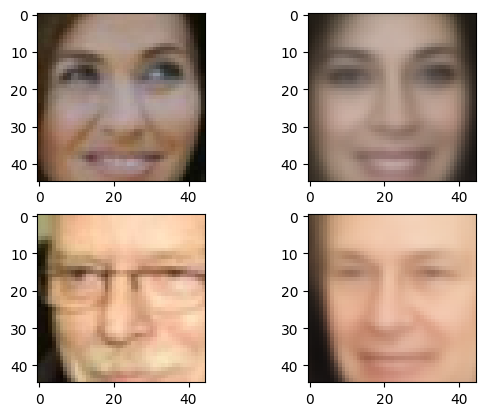

5/5 [==============================] - 1s 323ms/step - loss: 69.5609 - val_loss: 69.4906 - val_reconstruction_loss: 53.9012 - val_kl_loss: 15.5893
Epoch 372/500
5/5 [==============================] - 1s 137ms/step - loss: 68.1245 - val_loss: 69.3194 - val_reconstruction_loss: 53.7826 - val_kl_loss: 15.5368
Epoch 373/500
5/5 [==============================] - ETA: 0s - loss: 69.1087

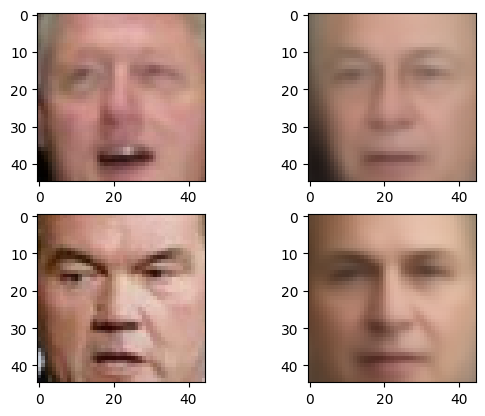

5/5 [==============================] - 1s 360ms/step - loss: 69.1087 - val_loss: 71.2227 - val_reconstruction_loss: 55.2362 - val_kl_loss: 15.9865
Epoch 374/500
5/5 [==============================] - 0s 106ms/step - loss: 69.0112 - val_loss: 70.1622 - val_reconstruction_loss: 54.5618 - val_kl_loss: 15.6005
Epoch 375/500
5/5 [==============================] - ETA: 0s - loss: 68.5592

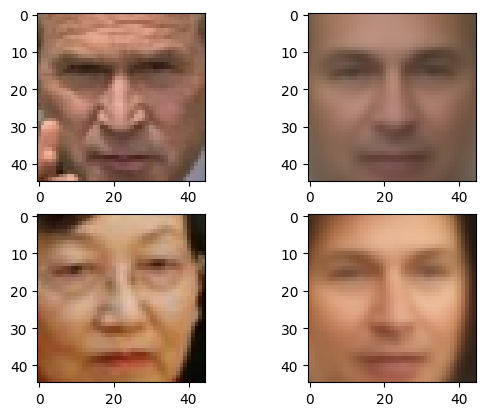

5/5 [==============================] - 1s 272ms/step - loss: 68.5592 - val_loss: 69.2045 - val_reconstruction_loss: 53.7051 - val_kl_loss: 15.4994
Epoch 376/500
5/5 [==============================] - 0s 103ms/step - loss: 68.8103 - val_loss: 69.8818 - val_reconstruction_loss: 54.2918 - val_kl_loss: 15.5900
Epoch 377/500
5/5 [==============================] - ETA: 0s - loss: 69.1025

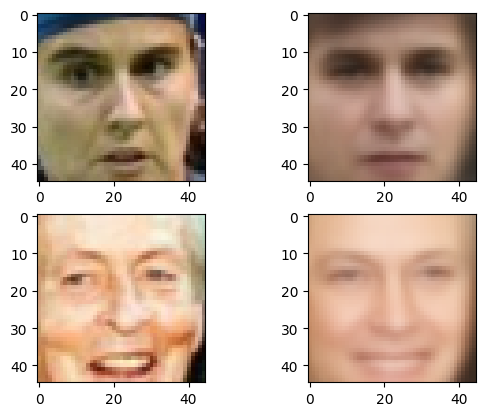

5/5 [==============================] - 1s 258ms/step - loss: 69.1025 - val_loss: 69.7954 - val_reconstruction_loss: 54.5902 - val_kl_loss: 15.2052
Epoch 378/500
5/5 [==============================] - 0s 94ms/step - loss: 67.9194 - val_loss: 69.3050 - val_reconstruction_loss: 53.8645 - val_kl_loss: 15.4405
Epoch 379/500
5/5 [==============================] - ETA: 0s - loss: 69.5957

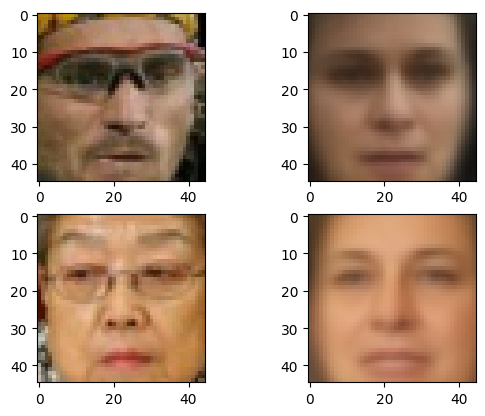

5/5 [==============================] - 1s 269ms/step - loss: 69.5957 - val_loss: 69.6245 - val_reconstruction_loss: 53.8466 - val_kl_loss: 15.7779
Epoch 380/500
5/5 [==============================] - 0s 109ms/step - loss: 68.1054 - val_loss: 69.1810 - val_reconstruction_loss: 53.6245 - val_kl_loss: 15.5564
Epoch 381/500
5/5 [==============================] - ETA: 0s - loss: 68.8213

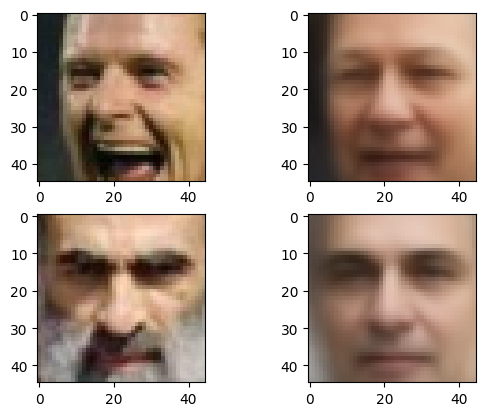

5/5 [==============================] - 1s 251ms/step - loss: 68.8213 - val_loss: 69.7977 - val_reconstruction_loss: 54.5022 - val_kl_loss: 15.2955
Epoch 382/500
5/5 [==============================] - 0s 105ms/step - loss: 70.2047 - val_loss: 71.2829 - val_reconstruction_loss: 56.2541 - val_kl_loss: 15.0289
Epoch 383/500
4/5 [=======================>......] - ETA: 0s - loss: 71.1753

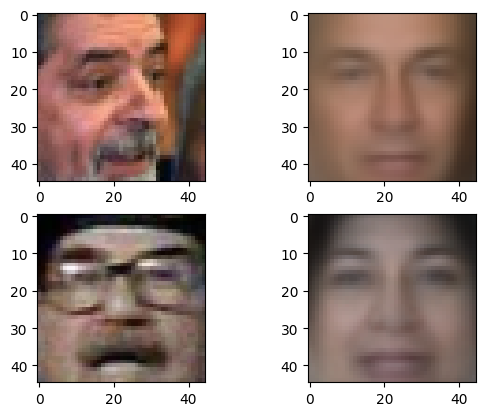

5/5 [==============================] - 1s 263ms/step - loss: 70.4337 - val_loss: 71.3328 - val_reconstruction_loss: 56.2346 - val_kl_loss: 15.0983
Epoch 384/500
5/5 [==============================] - 0s 95ms/step - loss: 71.5740 - val_loss: 70.6277 - val_reconstruction_loss: 55.2019 - val_kl_loss: 15.4258
Epoch 385/500
5/5 [==============================] - ETA: 0s - loss: 70.3953

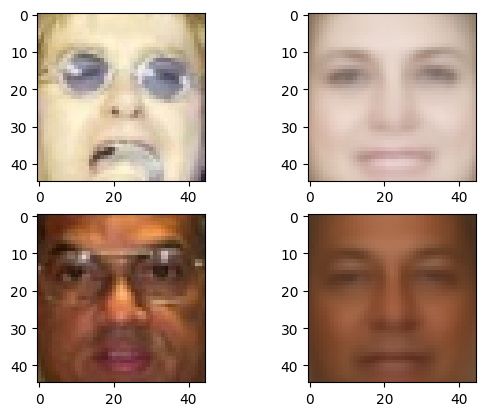

5/5 [==============================] - 1s 260ms/step - loss: 70.3953 - val_loss: 71.0807 - val_reconstruction_loss: 55.0444 - val_kl_loss: 16.0362
Epoch 386/500
5/5 [==============================] - 1s 109ms/step - loss: 70.4878 - val_loss: 71.4435 - val_reconstruction_loss: 56.4284 - val_kl_loss: 15.0151
Epoch 387/500
5/5 [==============================] - ETA: 0s - loss: 70.3142

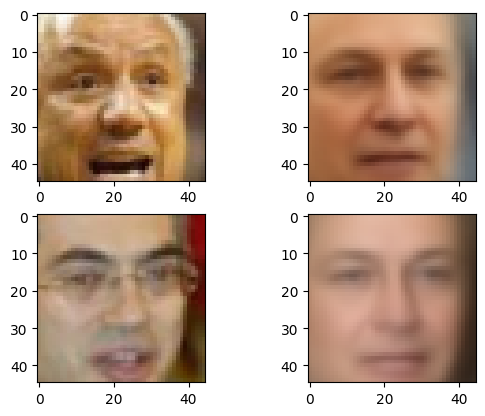

5/5 [==============================] - 1s 295ms/step - loss: 70.3142 - val_loss: 71.6529 - val_reconstruction_loss: 56.3011 - val_kl_loss: 15.3518
Epoch 388/500
5/5 [==============================] - 1s 131ms/step - loss: 70.4351 - val_loss: 71.4238 - val_reconstruction_loss: 55.7775 - val_kl_loss: 15.6463
Epoch 389/500
5/5 [==============================] - ETA: 0s - loss: 69.1772

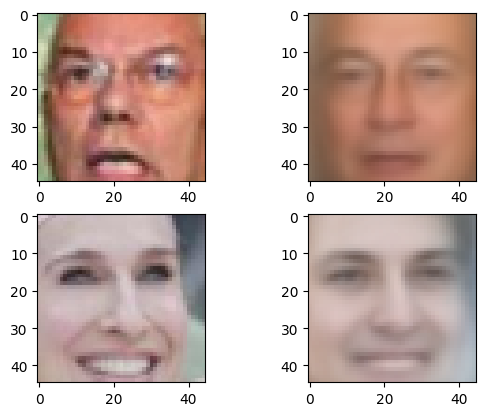

5/5 [==============================] - 1s 337ms/step - loss: 69.1772 - val_loss: 70.0261 - val_reconstruction_loss: 54.4359 - val_kl_loss: 15.5902
Epoch 390/500
5/5 [==============================] - 0s 108ms/step - loss: 68.6796 - val_loss: 69.5430 - val_reconstruction_loss: 54.1457 - val_kl_loss: 15.3973
Epoch 391/500
4/5 [=======================>......] - ETA: 0s - loss: 68.4929

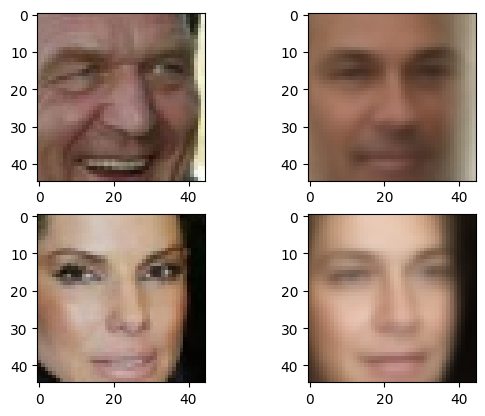

5/5 [==============================] - 1s 288ms/step - loss: 68.6101 - val_loss: 69.4160 - val_reconstruction_loss: 53.6344 - val_kl_loss: 15.7816
Epoch 392/500
5/5 [==============================] - 0s 91ms/step - loss: 68.6819 - val_loss: 69.1912 - val_reconstruction_loss: 53.9212 - val_kl_loss: 15.2700
Epoch 393/500
5/5 [==============================] - ETA: 0s - loss: 67.9873

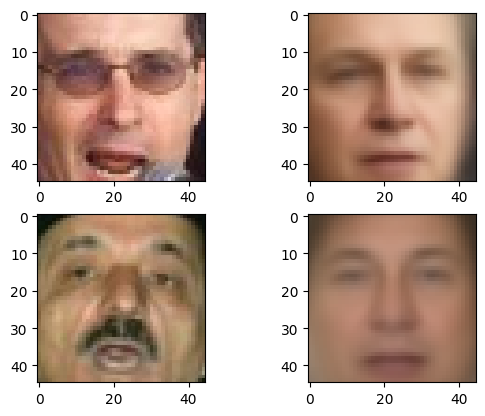

5/5 [==============================] - 1s 348ms/step - loss: 67.9873 - val_loss: 69.1286 - val_reconstruction_loss: 53.3755 - val_kl_loss: 15.7531
Epoch 394/500
5/5 [==============================] - 0s 96ms/step - loss: 67.8242 - val_loss: 68.9285 - val_reconstruction_loss: 53.3678 - val_kl_loss: 15.5607
Epoch 395/500
5/5 [==============================] - ETA: 0s - loss: 68.4034

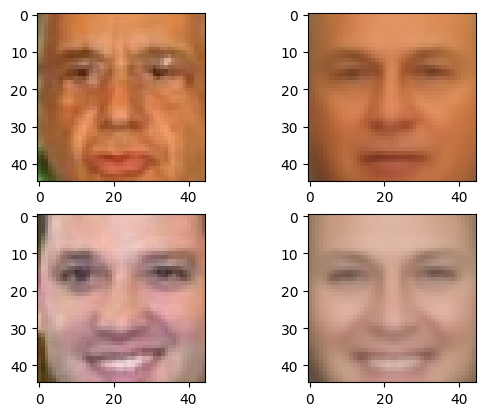

5/5 [==============================] - 1s 270ms/step - loss: 68.4034 - val_loss: 69.0309 - val_reconstruction_loss: 53.3595 - val_kl_loss: 15.6713
Epoch 396/500
5/5 [==============================] - 0s 98ms/step - loss: 68.8188 - val_loss: 69.6322 - val_reconstruction_loss: 53.8274 - val_kl_loss: 15.8048
Epoch 397/500
5/5 [==============================] - ETA: 0s - loss: 68.5518

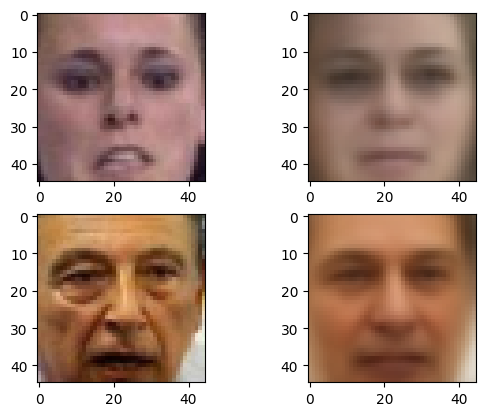

5/5 [==============================] - 1s 278ms/step - loss: 68.5518 - val_loss: 69.0387 - val_reconstruction_loss: 53.6250 - val_kl_loss: 15.4138
Epoch 398/500
5/5 [==============================] - 0s 96ms/step - loss: 69.6314 - val_loss: 69.2797 - val_reconstruction_loss: 53.4331 - val_kl_loss: 15.8466
Epoch 399/500
4/5 [=======================>......] - ETA: 0s - loss: 68.6121

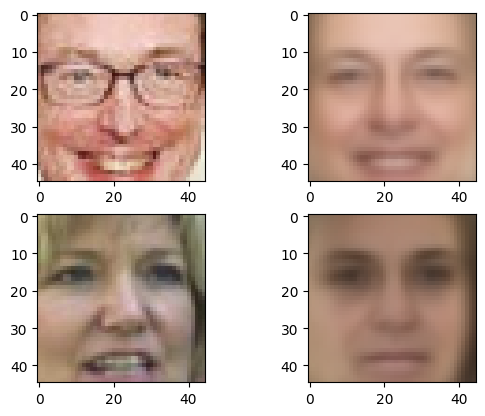

5/5 [==============================] - 1s 259ms/step - loss: 68.1787 - val_loss: 69.6728 - val_reconstruction_loss: 53.8523 - val_kl_loss: 15.8205
Epoch 400/500
5/5 [==============================] - 0s 87ms/step - loss: 70.9729 - val_loss: 70.9795 - val_reconstruction_loss: 56.0026 - val_kl_loss: 14.9769
Epoch 401/500
5/5 [==============================] - ETA: 0s - loss: 70.1138

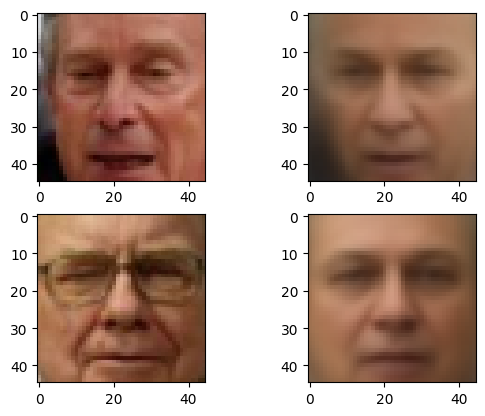

5/5 [==============================] - 1s 275ms/step - loss: 70.1138 - val_loss: 69.5381 - val_reconstruction_loss: 53.9671 - val_kl_loss: 15.5710
Epoch 402/500
5/5 [==============================] - 0s 100ms/step - loss: 68.8597 - val_loss: 69.6527 - val_reconstruction_loss: 53.8832 - val_kl_loss: 15.7695
Epoch 403/500
5/5 [==============================] - ETA: 0s - loss: 69.3729

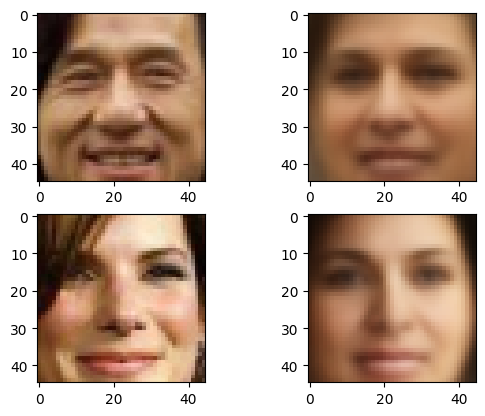

5/5 [==============================] - 1s 280ms/step - loss: 69.3729 - val_loss: 69.2706 - val_reconstruction_loss: 53.5213 - val_kl_loss: 15.7493
Epoch 404/500
5/5 [==============================] - 0s 112ms/step - loss: 67.9292 - val_loss: 69.3835 - val_reconstruction_loss: 53.5678 - val_kl_loss: 15.8156
Epoch 405/500
5/5 [==============================] - ETA: 0s - loss: 68.7174

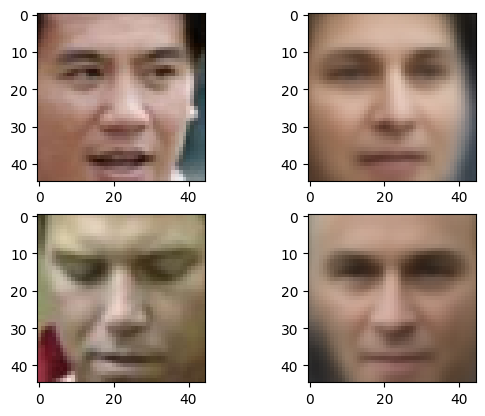

5/5 [==============================] - 1s 332ms/step - loss: 68.7174 - val_loss: 69.0237 - val_reconstruction_loss: 53.6954 - val_kl_loss: 15.3283
Epoch 406/500
5/5 [==============================] - 0s 106ms/step - loss: 70.0155 - val_loss: 69.2861 - val_reconstruction_loss: 53.6875 - val_kl_loss: 15.5987
Epoch 407/500
5/5 [==============================] - ETA: 0s - loss: 68.2994

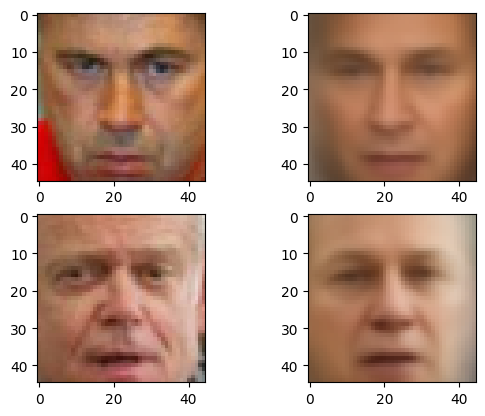

5/5 [==============================] - 1s 315ms/step - loss: 68.2994 - val_loss: 69.3268 - val_reconstruction_loss: 53.8195 - val_kl_loss: 15.5073
Epoch 408/500
5/5 [==============================] - 1s 145ms/step - loss: 68.7029 - val_loss: 68.9271 - val_reconstruction_loss: 53.6351 - val_kl_loss: 15.2921
Epoch 409/500
5/5 [==============================] - ETA: 0s - loss: 68.2435

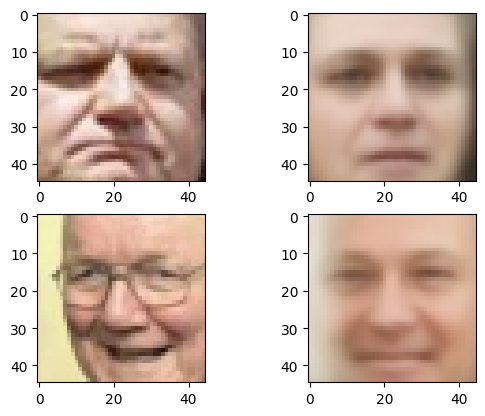

5/5 [==============================] - 1s 263ms/step - loss: 68.2435 - val_loss: 69.1767 - val_reconstruction_loss: 53.5095 - val_kl_loss: 15.6672
Epoch 410/500
5/5 [==============================] - 1s 136ms/step - loss: 68.8097 - val_loss: 69.3653 - val_reconstruction_loss: 53.4613 - val_kl_loss: 15.9040
Epoch 411/500
5/5 [==============================] - ETA: 0s - loss: 68.3118

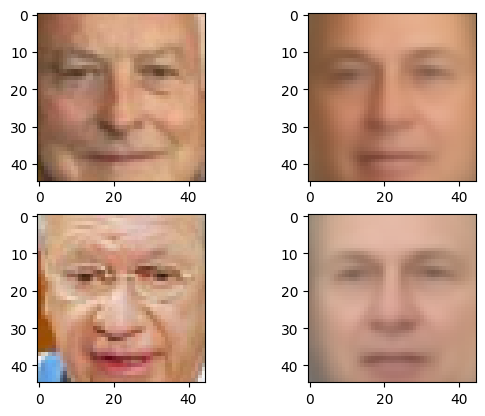

5/5 [==============================] - 1s 264ms/step - loss: 68.3118 - val_loss: 68.8034 - val_reconstruction_loss: 53.1337 - val_kl_loss: 15.6697
Epoch 412/500
5/5 [==============================] - 0s 107ms/step - loss: 68.3688 - val_loss: 68.7297 - val_reconstruction_loss: 53.1121 - val_kl_loss: 15.6176
Epoch 413/500
5/5 [==============================] - ETA: 0s - loss: 68.7454

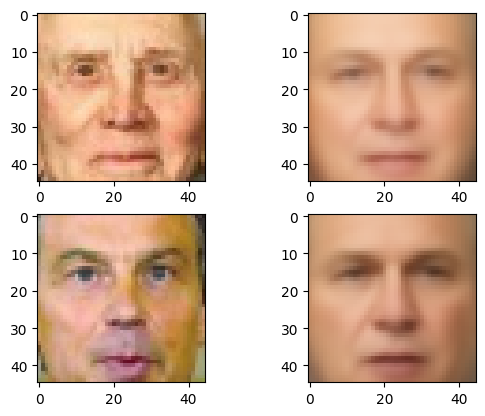

5/5 [==============================] - 1s 274ms/step - loss: 68.7454 - val_loss: 68.7730 - val_reconstruction_loss: 53.0560 - val_kl_loss: 15.7170
Epoch 414/500
5/5 [==============================] - 0s 100ms/step - loss: 68.0058 - val_loss: 68.9544 - val_reconstruction_loss: 53.5713 - val_kl_loss: 15.3831
Epoch 415/500
4/5 [=======================>......] - ETA: 0s - loss: 69.2487

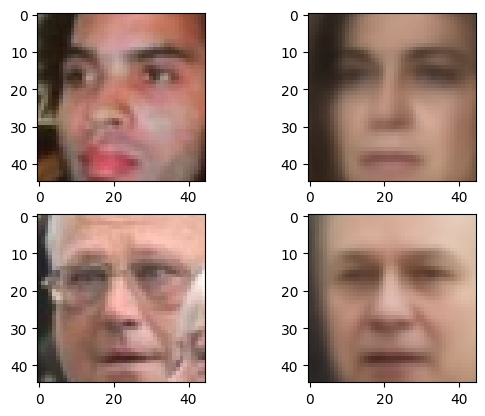

5/5 [==============================] - 1s 260ms/step - loss: 67.9234 - val_loss: 68.9594 - val_reconstruction_loss: 53.1818 - val_kl_loss: 15.7776
Epoch 416/500
5/5 [==============================] - 0s 103ms/step - loss: 68.2733 - val_loss: 69.5271 - val_reconstruction_loss: 53.5342 - val_kl_loss: 15.9929
Epoch 417/500
4/5 [=======================>......] - ETA: 0s - loss: 69.4117

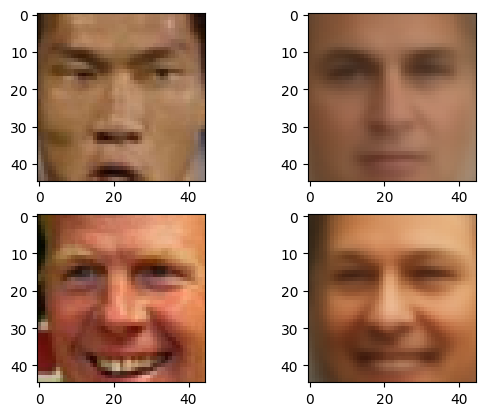

5/5 [==============================] - 2s 360ms/step - loss: 69.0051 - val_loss: 69.4133 - val_reconstruction_loss: 53.9392 - val_kl_loss: 15.4741
Epoch 418/500
5/5 [==============================] - 0s 108ms/step - loss: 67.2701 - val_loss: 69.1289 - val_reconstruction_loss: 53.2608 - val_kl_loss: 15.8681
Epoch 419/500
5/5 [==============================] - ETA: 0s - loss: 68.8348

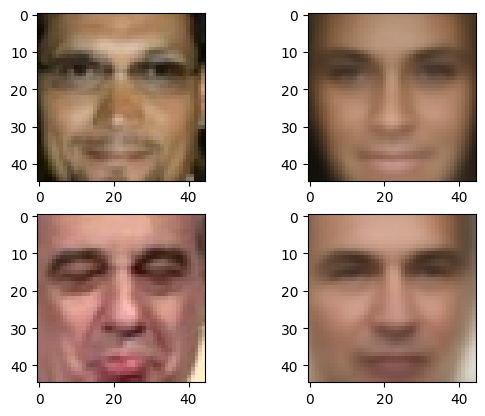

5/5 [==============================] - 1s 281ms/step - loss: 68.8348 - val_loss: 68.6731 - val_reconstruction_loss: 53.0177 - val_kl_loss: 15.6554
Epoch 420/500
5/5 [==============================] - 1s 143ms/step - loss: 68.3907 - val_loss: 69.2141 - val_reconstruction_loss: 53.3939 - val_kl_loss: 15.8201
Epoch 421/500
5/5 [==============================] - ETA: 0s - loss: 67.5199

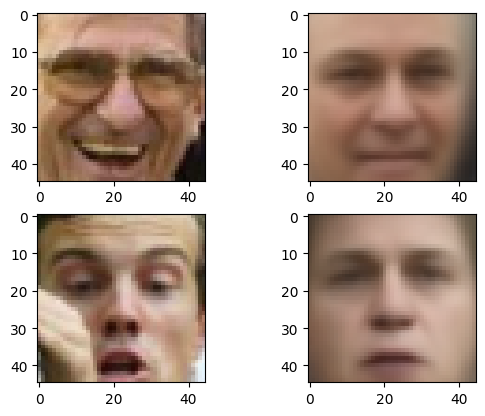

5/5 [==============================] - 1s 320ms/step - loss: 67.5199 - val_loss: 68.9996 - val_reconstruction_loss: 53.4893 - val_kl_loss: 15.5103
Epoch 422/500
5/5 [==============================] - 1s 151ms/step - loss: 68.7173 - val_loss: 69.0107 - val_reconstruction_loss: 53.3569 - val_kl_loss: 15.6538
Epoch 423/500
5/5 [==============================] - ETA: 0s - loss: 68.7913

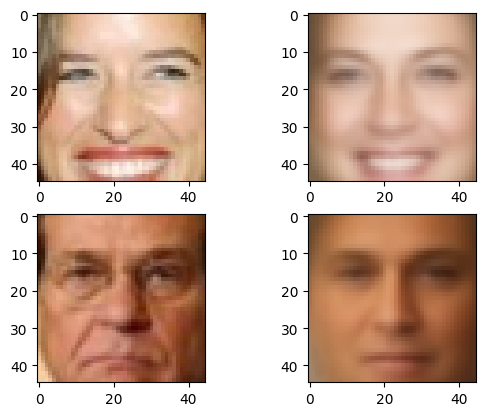

5/5 [==============================] - 1s 304ms/step - loss: 68.7913 - val_loss: 68.7745 - val_reconstruction_loss: 53.2231 - val_kl_loss: 15.5514
Epoch 424/500
5/5 [==============================] - 0s 100ms/step - loss: 67.7651 - val_loss: 69.1135 - val_reconstruction_loss: 53.6290 - val_kl_loss: 15.4846
Epoch 425/500
4/5 [=======================>......] - ETA: 0s - loss: 68.3722

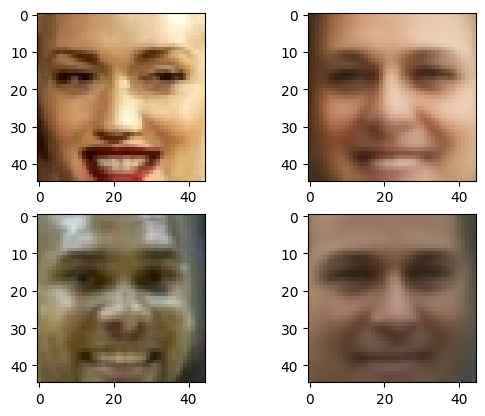

5/5 [==============================] - 1s 272ms/step - loss: 68.9170 - val_loss: 69.9264 - val_reconstruction_loss: 53.7435 - val_kl_loss: 16.1828
Epoch 426/500
5/5 [==============================] - 0s 91ms/step - loss: 68.3993 - val_loss: 69.3695 - val_reconstruction_loss: 53.7608 - val_kl_loss: 15.6086
Epoch 427/500
4/5 [=======================>......] - ETA: 0s - loss: 70.1062

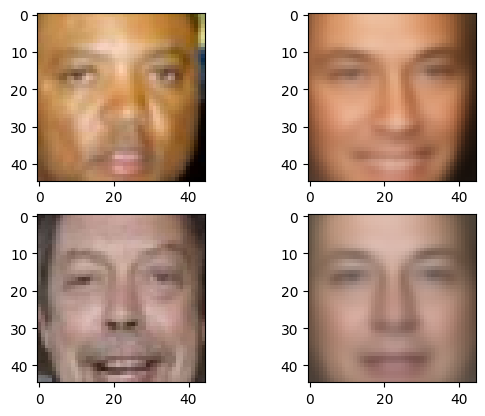

5/5 [==============================] - 1s 297ms/step - loss: 68.5971 - val_loss: 69.9980 - val_reconstruction_loss: 54.4764 - val_kl_loss: 15.5216
Epoch 428/500
5/5 [==============================] - 0s 104ms/step - loss: 68.9504 - val_loss: 69.8794 - val_reconstruction_loss: 54.6714 - val_kl_loss: 15.2080
Epoch 429/500
5/5 [==============================] - ETA: 0s - loss: 68.8595

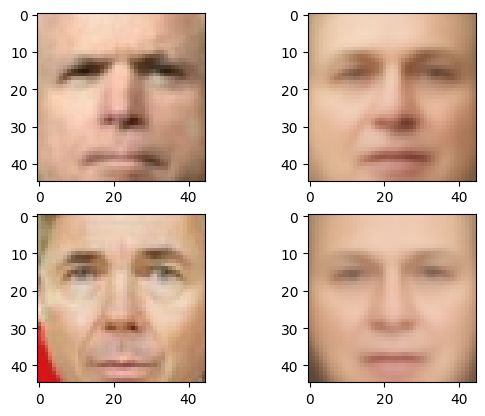

5/5 [==============================] - 1s 258ms/step - loss: 68.8595 - val_loss: 69.3672 - val_reconstruction_loss: 54.0984 - val_kl_loss: 15.2688
Epoch 430/500
5/5 [==============================] - 1s 144ms/step - loss: 67.3610 - val_loss: 68.9175 - val_reconstruction_loss: 53.3393 - val_kl_loss: 15.5782
Epoch 431/500
4/5 [=======================>......] - ETA: 0s - loss: 66.8312

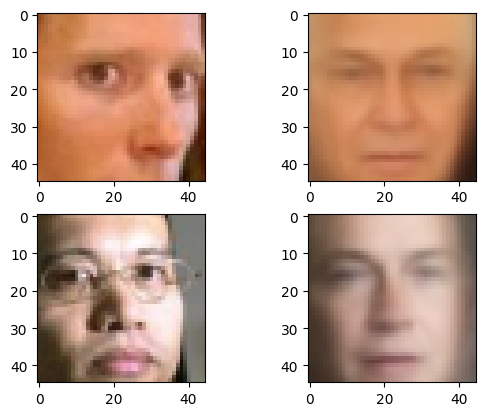

5/5 [==============================] - 1s 269ms/step - loss: 67.8932 - val_loss: 68.7533 - val_reconstruction_loss: 53.0197 - val_kl_loss: 15.7336
Epoch 432/500
5/5 [==============================] - 0s 100ms/step - loss: 68.6339 - val_loss: 68.8365 - val_reconstruction_loss: 53.4958 - val_kl_loss: 15.3407
Epoch 433/500
5/5 [==============================] - ETA: 0s - loss: 68.3458

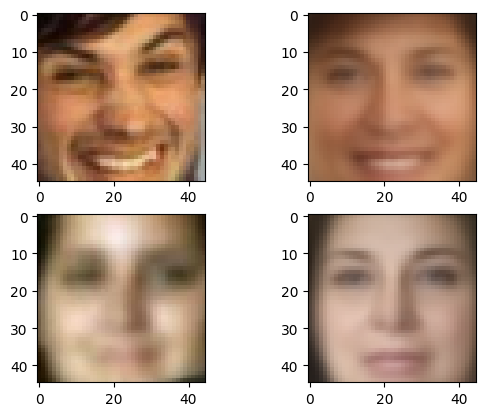

5/5 [==============================] - 1s 270ms/step - loss: 68.3458 - val_loss: 68.5008 - val_reconstruction_loss: 52.4662 - val_kl_loss: 16.0346
Epoch 434/500
5/5 [==============================] - 0s 101ms/step - loss: 67.3569 - val_loss: 68.5204 - val_reconstruction_loss: 52.9260 - val_kl_loss: 15.5944
Epoch 435/500
5/5 [==============================] - ETA: 0s - loss: 68.6479

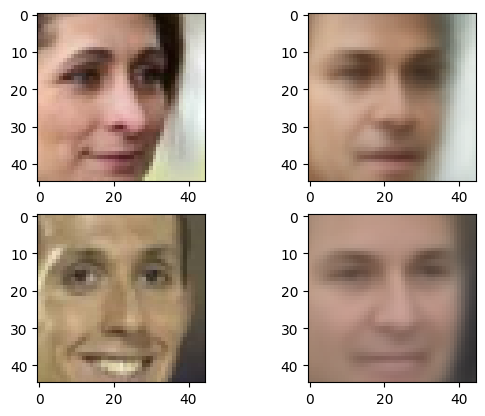

5/5 [==============================] - 1s 277ms/step - loss: 68.6479 - val_loss: 69.0506 - val_reconstruction_loss: 53.6066 - val_kl_loss: 15.4440
Epoch 436/500
5/5 [==============================] - 1s 115ms/step - loss: 68.0155 - val_loss: 68.7219 - val_reconstruction_loss: 53.2099 - val_kl_loss: 15.5120
Epoch 437/500
5/5 [==============================] - ETA: 0s - loss: 67.9761

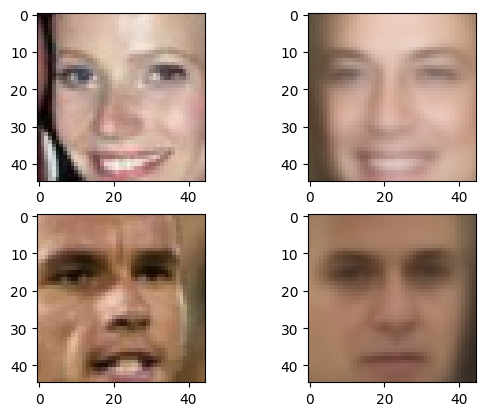

5/5 [==============================] - 1s 314ms/step - loss: 67.9761 - val_loss: 68.7412 - val_reconstruction_loss: 52.9029 - val_kl_loss: 15.8383
Epoch 438/500
5/5 [==============================] - 0s 108ms/step - loss: 68.6985 - val_loss: 68.9623 - val_reconstruction_loss: 53.0258 - val_kl_loss: 15.9365
Epoch 439/500
5/5 [==============================] - ETA: 0s - loss: 68.7171

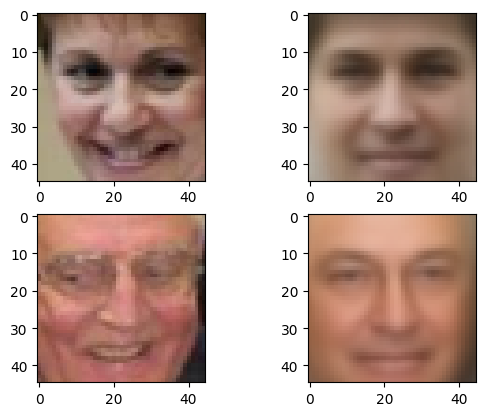

5/5 [==============================] - 2s 419ms/step - loss: 68.7171 - val_loss: 69.6268 - val_reconstruction_loss: 54.3527 - val_kl_loss: 15.2740
Epoch 440/500
5/5 [==============================] - 0s 106ms/step - loss: 69.5995 - val_loss: 69.3541 - val_reconstruction_loss: 53.6016 - val_kl_loss: 15.7525
Epoch 441/500
5/5 [==============================] - ETA: 0s - loss: 68.6029

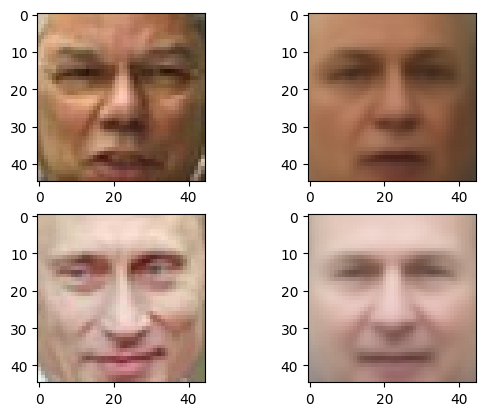

5/5 [==============================] - 1s 255ms/step - loss: 68.6029 - val_loss: 69.5241 - val_reconstruction_loss: 54.2876 - val_kl_loss: 15.2366
Epoch 442/500
5/5 [==============================] - 1s 114ms/step - loss: 67.3497 - val_loss: 69.2878 - val_reconstruction_loss: 53.5898 - val_kl_loss: 15.6980
Epoch 443/500
4/5 [=======================>......] - ETA: 0s - loss: 68.5446

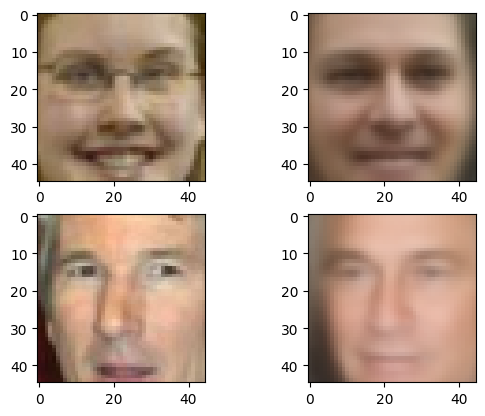

5/5 [==============================] - 1s 248ms/step - loss: 68.2369 - val_loss: 68.8974 - val_reconstruction_loss: 53.2395 - val_kl_loss: 15.6580
Epoch 444/500
5/5 [==============================] - 0s 93ms/step - loss: 68.6020 - val_loss: 69.6683 - val_reconstruction_loss: 54.3582 - val_kl_loss: 15.3101
Epoch 445/500
4/5 [=======================>......] - ETA: 0s - loss: 68.1730

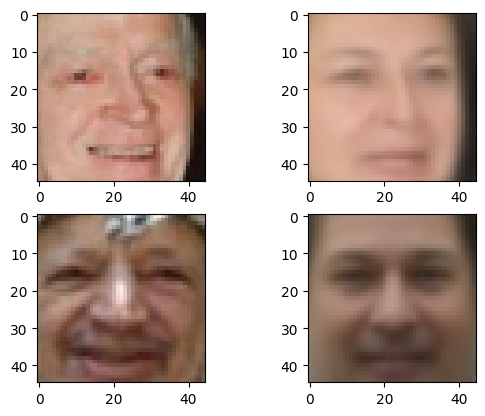

5/5 [==============================] - 1s 279ms/step - loss: 67.6121 - val_loss: 69.3662 - val_reconstruction_loss: 54.0798 - val_kl_loss: 15.2864
Epoch 446/500
5/5 [==============================] - 0s 106ms/step - loss: 69.8949 - val_loss: 69.7855 - val_reconstruction_loss: 53.9813 - val_kl_loss: 15.8041
Epoch 447/500
5/5 [==============================] - ETA: 0s - loss: 69.5446

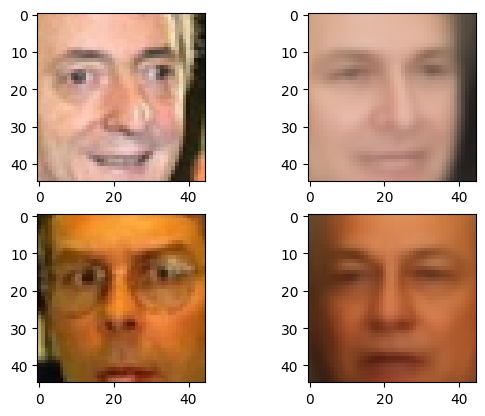

5/5 [==============================] - 1s 270ms/step - loss: 69.5446 - val_loss: 69.4220 - val_reconstruction_loss: 53.4085 - val_kl_loss: 16.0136
Epoch 448/500
5/5 [==============================] - 0s 104ms/step - loss: 68.3034 - val_loss: 69.1148 - val_reconstruction_loss: 53.5172 - val_kl_loss: 15.5977
Epoch 449/500
5/5 [==============================] - ETA: 0s - loss: 68.7914

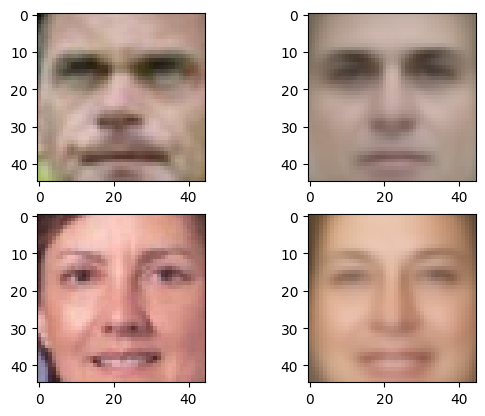

5/5 [==============================] - 1s 267ms/step - loss: 68.7914 - val_loss: 68.9003 - val_reconstruction_loss: 52.8797 - val_kl_loss: 16.0206
Epoch 450/500
5/5 [==============================] - 0s 98ms/step - loss: 67.9290 - val_loss: 68.6908 - val_reconstruction_loss: 53.3858 - val_kl_loss: 15.3050
Epoch 451/500
5/5 [==============================] - ETA: 0s - loss: 68.4734

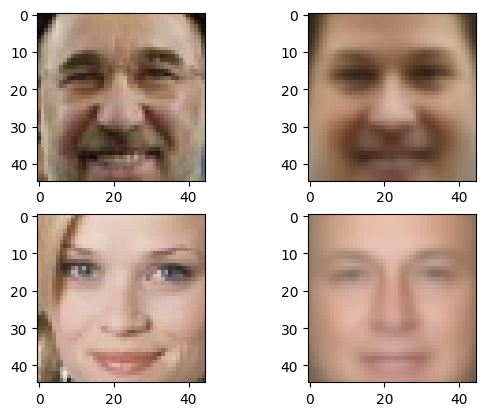

5/5 [==============================] - 1s 276ms/step - loss: 68.4734 - val_loss: 68.7580 - val_reconstruction_loss: 52.8473 - val_kl_loss: 15.9107
Epoch 452/500
5/5 [==============================] - 0s 103ms/step - loss: 67.9888 - val_loss: 68.8288 - val_reconstruction_loss: 53.1869 - val_kl_loss: 15.6419
Epoch 453/500
5/5 [==============================] - ETA: 0s - loss: 67.7617

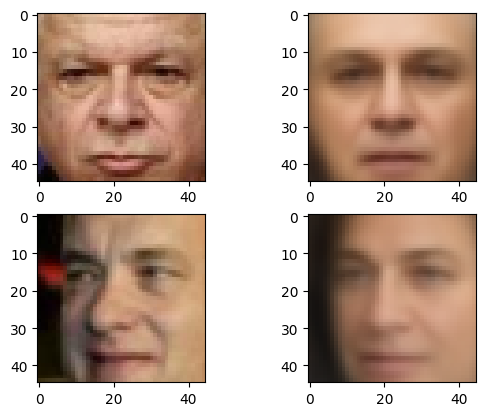

5/5 [==============================] - 1s 297ms/step - loss: 67.7617 - val_loss: 69.0158 - val_reconstruction_loss: 53.3281 - val_kl_loss: 15.6878
Epoch 454/500
5/5 [==============================] - 1s 119ms/step - loss: 68.0764 - val_loss: 68.4657 - val_reconstruction_loss: 52.6008 - val_kl_loss: 15.8649
Epoch 455/500
5/5 [==============================] - ETA: 0s - loss: 67.6445

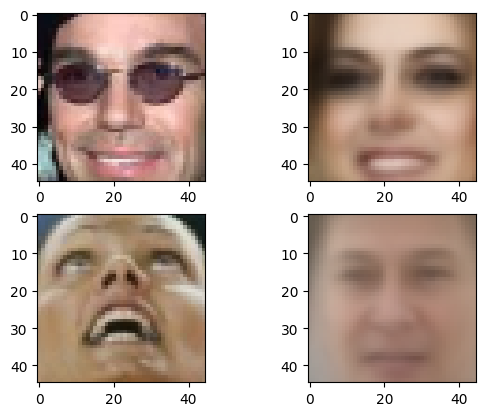

5/5 [==============================] - 1s 304ms/step - loss: 67.6445 - val_loss: 68.8372 - val_reconstruction_loss: 53.3283 - val_kl_loss: 15.5089
Epoch 456/500
5/5 [==============================] - 1s 160ms/step - loss: 68.5093 - val_loss: 68.5584 - val_reconstruction_loss: 52.7749 - val_kl_loss: 15.7836
Epoch 457/500
5/5 [==============================] - ETA: 0s - loss: 67.6745

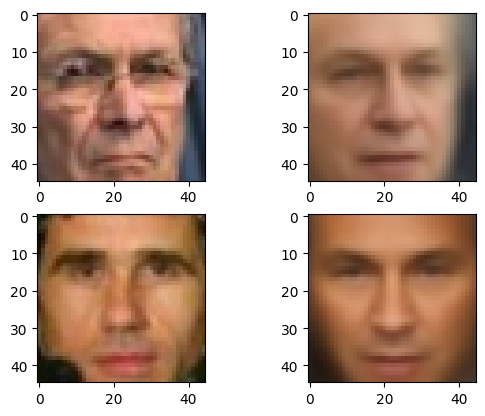

5/5 [==============================] - 1s 278ms/step - loss: 67.6745 - val_loss: 68.6682 - val_reconstruction_loss: 52.9160 - val_kl_loss: 15.7522
Epoch 458/500
5/5 [==============================] - 0s 100ms/step - loss: 68.1138 - val_loss: 68.8109 - val_reconstruction_loss: 53.0322 - val_kl_loss: 15.7786
Epoch 459/500
5/5 [==============================] - ETA: 0s - loss: 67.5944

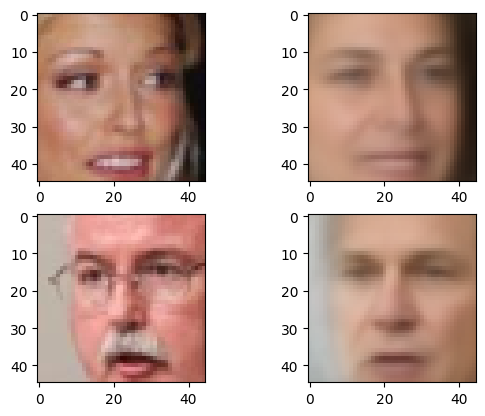

5/5 [==============================] - 1s 259ms/step - loss: 67.5944 - val_loss: 68.8677 - val_reconstruction_loss: 53.3341 - val_kl_loss: 15.5335
Epoch 460/500
5/5 [==============================] - 0s 109ms/step - loss: 67.2522 - val_loss: 68.9320 - val_reconstruction_loss: 53.3018 - val_kl_loss: 15.6302
Epoch 461/500
5/5 [==============================] - ETA: 0s - loss: 67.9747

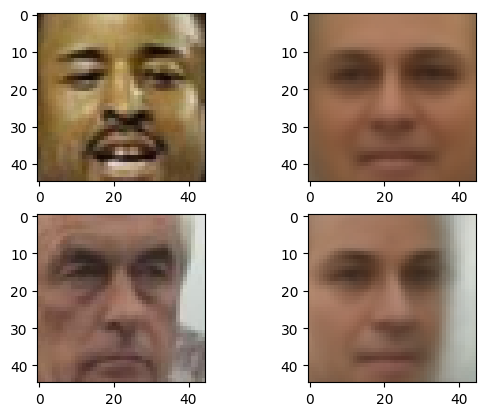

5/5 [==============================] - 1s 269ms/step - loss: 67.9747 - val_loss: 68.9831 - val_reconstruction_loss: 52.7292 - val_kl_loss: 16.2539
Epoch 462/500
5/5 [==============================] - 0s 101ms/step - loss: 67.4440 - val_loss: 69.3637 - val_reconstruction_loss: 53.5748 - val_kl_loss: 15.7889
Epoch 463/500
5/5 [==============================] - ETA: 0s - loss: 67.9980

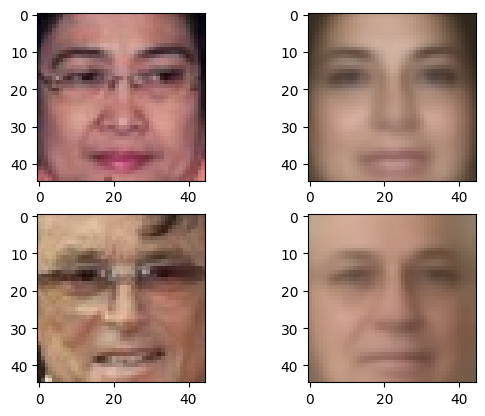

5/5 [==============================] - 1s 343ms/step - loss: 67.9980 - val_loss: 69.4780 - val_reconstruction_loss: 54.1069 - val_kl_loss: 15.3711
Epoch 464/500
5/5 [==============================] - 0s 106ms/step - loss: 71.5152 - val_loss: 72.2139 - val_reconstruction_loss: 56.4037 - val_kl_loss: 15.8102
Epoch 465/500
5/5 [==============================] - ETA: 0s - loss: 71.3164

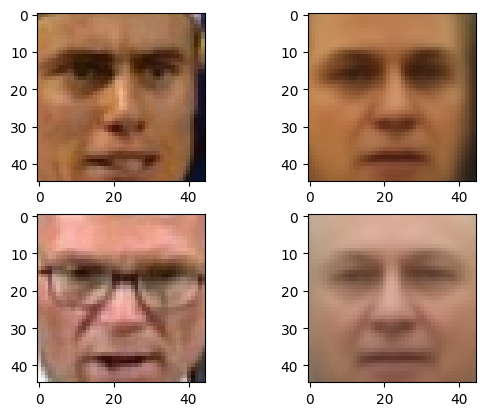

5/5 [==============================] - 1s 271ms/step - loss: 71.3164 - val_loss: 70.5664 - val_reconstruction_loss: 54.6216 - val_kl_loss: 15.9448
Epoch 466/500
5/5 [==============================] - 0s 94ms/step - loss: 69.4460 - val_loss: 69.6757 - val_reconstruction_loss: 53.8143 - val_kl_loss: 15.8613
Epoch 467/500
5/5 [==============================] - ETA: 0s - loss: 68.3661

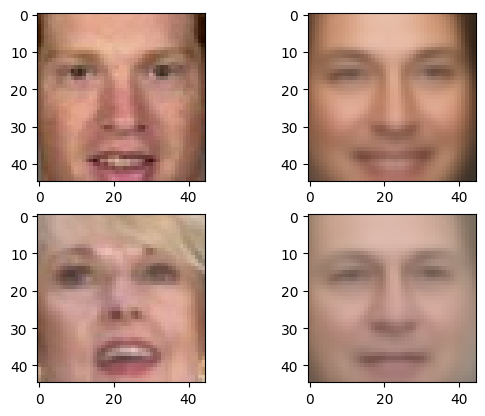

5/5 [==============================] - 1s 284ms/step - loss: 68.3661 - val_loss: 69.5676 - val_reconstruction_loss: 54.0194 - val_kl_loss: 15.5482
Epoch 468/500
5/5 [==============================] - 1s 109ms/step - loss: 67.4448 - val_loss: 69.3391 - val_reconstruction_loss: 53.4019 - val_kl_loss: 15.9372
Epoch 469/500
5/5 [==============================] - ETA: 0s - loss: 69.9575

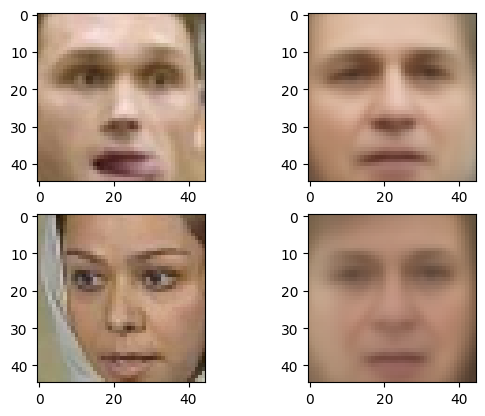

5/5 [==============================] - 1s 322ms/step - loss: 69.9575 - val_loss: 69.0625 - val_reconstruction_loss: 53.5992 - val_kl_loss: 15.4633
Epoch 470/500
5/5 [==============================] - 1s 168ms/step - loss: 68.6634 - val_loss: 68.9271 - val_reconstruction_loss: 52.7576 - val_kl_loss: 16.1695
Epoch 471/500
5/5 [==============================] - ETA: 0s - loss: 67.9640

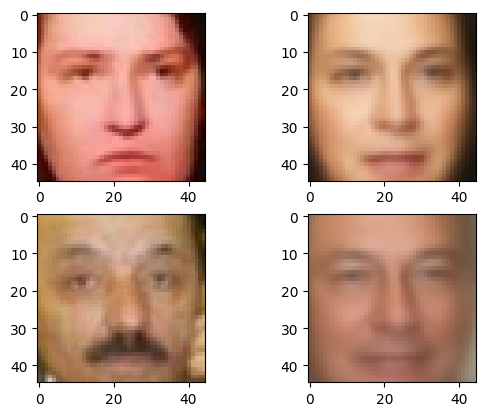

5/5 [==============================] - 1s 296ms/step - loss: 67.9640 - val_loss: 68.8620 - val_reconstruction_loss: 52.6100 - val_kl_loss: 16.2520
Epoch 472/500
5/5 [==============================] - 1s 125ms/step - loss: 68.3233 - val_loss: 68.6797 - val_reconstruction_loss: 53.0110 - val_kl_loss: 15.6687
Epoch 473/500
5/5 [==============================] - ETA: 0s - loss: 66.6730

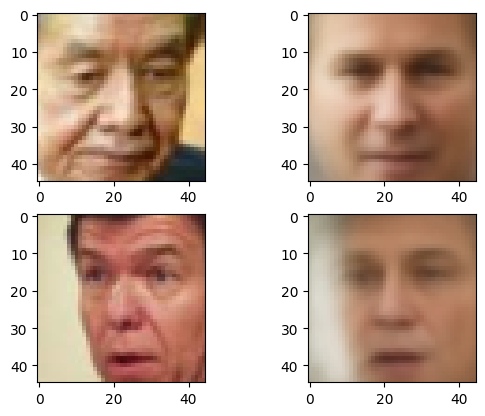

5/5 [==============================] - 1s 257ms/step - loss: 66.6730 - val_loss: 68.3581 - val_reconstruction_loss: 52.5056 - val_kl_loss: 15.8525
Epoch 474/500
5/5 [==============================] - 0s 104ms/step - loss: 67.5749 - val_loss: 68.4653 - val_reconstruction_loss: 52.5626 - val_kl_loss: 15.9026
Epoch 475/500
5/5 [==============================] - ETA: 0s - loss: 67.7729

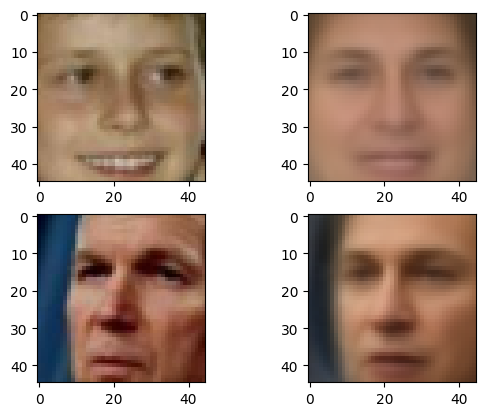

5/5 [==============================] - 1s 262ms/step - loss: 67.7729 - val_loss: 68.2262 - val_reconstruction_loss: 52.4755 - val_kl_loss: 15.7507
Epoch 476/500
5/5 [==============================] - 1s 111ms/step - loss: 67.8229 - val_loss: 68.1445 - val_reconstruction_loss: 52.5802 - val_kl_loss: 15.5643
Epoch 477/500
5/5 [==============================] - ETA: 0s - loss: 67.1986

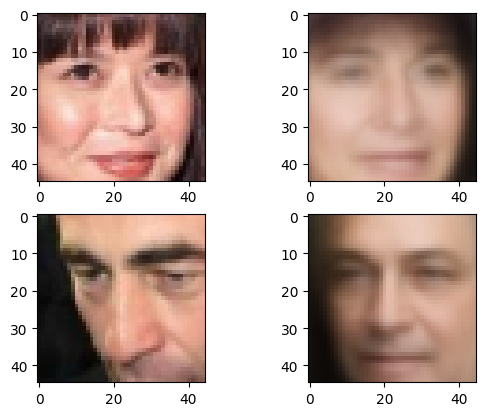

5/5 [==============================] - 1s 257ms/step - loss: 67.1986 - val_loss: 68.2867 - val_reconstruction_loss: 52.3798 - val_kl_loss: 15.9068
Epoch 478/500
5/5 [==============================] - 1s 138ms/step - loss: 66.9918 - val_loss: 68.3220 - val_reconstruction_loss: 52.6322 - val_kl_loss: 15.6898
Epoch 479/500
4/5 [=======================>......] - ETA: 0s - loss: 68.2396

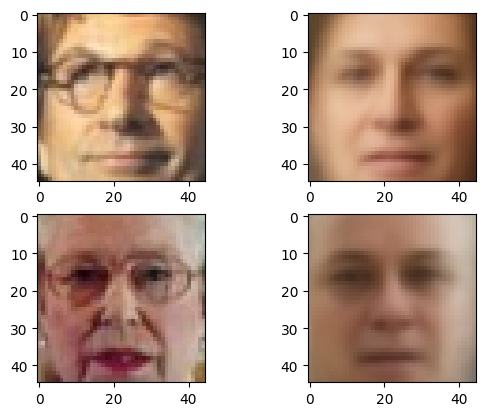

5/5 [==============================] - 1s 264ms/step - loss: 66.1179 - val_loss: 68.1736 - val_reconstruction_loss: 52.3258 - val_kl_loss: 15.8478
Epoch 480/500
5/5 [==============================] - 1s 147ms/step - loss: 67.2110 - val_loss: 68.0964 - val_reconstruction_loss: 52.4134 - val_kl_loss: 15.6830
Epoch 481/500
5/5 [==============================] - ETA: 0s - loss: 66.9365

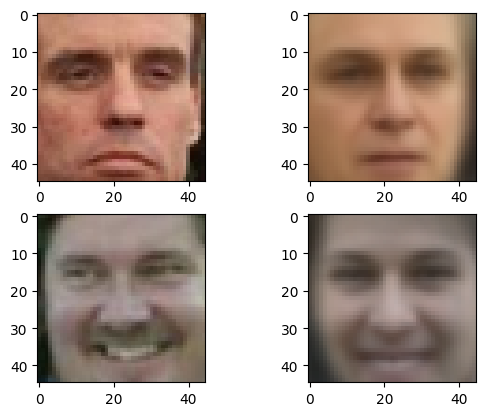

5/5 [==============================] - 1s 278ms/step - loss: 66.9365 - val_loss: 67.9227 - val_reconstruction_loss: 51.9976 - val_kl_loss: 15.9251
Epoch 482/500
5/5 [==============================] - 0s 102ms/step - loss: 67.8053 - val_loss: 67.9728 - val_reconstruction_loss: 52.1017 - val_kl_loss: 15.8711
Epoch 483/500
4/5 [=======================>......] - ETA: 0s - loss: 68.2792

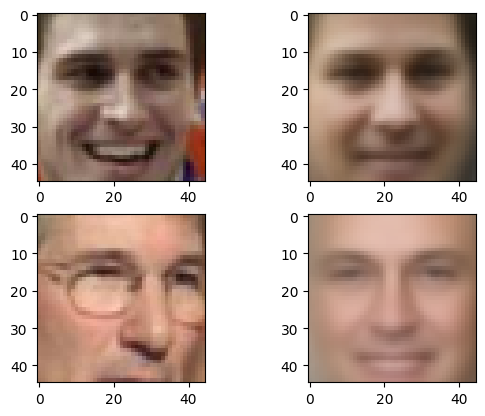

5/5 [==============================] - 1s 269ms/step - loss: 68.1232 - val_loss: 68.3759 - val_reconstruction_loss: 52.8712 - val_kl_loss: 15.5047
Epoch 484/500
5/5 [==============================] - 0s 108ms/step - loss: 67.0997 - val_loss: 68.0085 - val_reconstruction_loss: 52.2193 - val_kl_loss: 15.7892
Epoch 485/500
5/5 [==============================] - ETA: 0s - loss: 67.7565

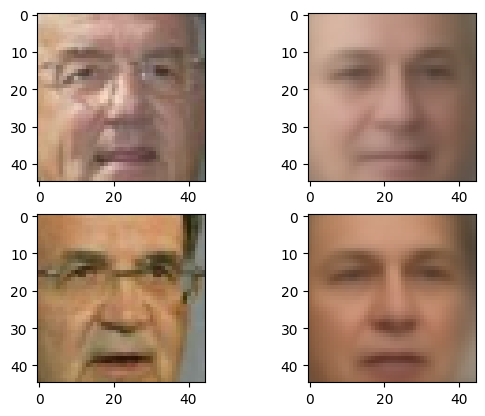

5/5 [==============================] - 1s 293ms/step - loss: 67.7565 - val_loss: 68.0465 - val_reconstruction_loss: 52.0240 - val_kl_loss: 16.0225
Epoch 486/500
5/5 [==============================] - 1s 130ms/step - loss: 67.4653 - val_loss: 68.0291 - val_reconstruction_loss: 52.2333 - val_kl_loss: 15.7958
Epoch 487/500
5/5 [==============================] - ETA: 0s - loss: 67.0625

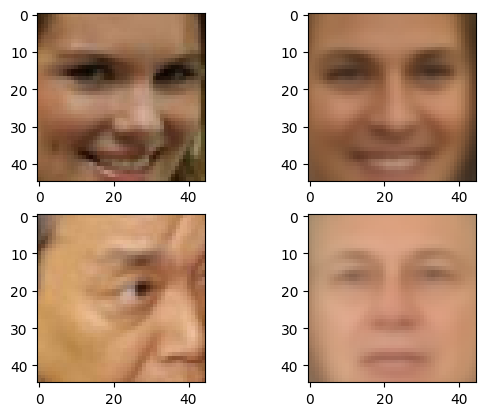

5/5 [==============================] - 2s 407ms/step - loss: 67.0625 - val_loss: 68.1175 - val_reconstruction_loss: 52.6361 - val_kl_loss: 15.4814
Epoch 488/500
5/5 [==============================] - 1s 124ms/step - loss: 66.6471 - val_loss: 68.1698 - val_reconstruction_loss: 52.4058 - val_kl_loss: 15.7640
Epoch 489/500
5/5 [==============================] - ETA: 0s - loss: 68.9570

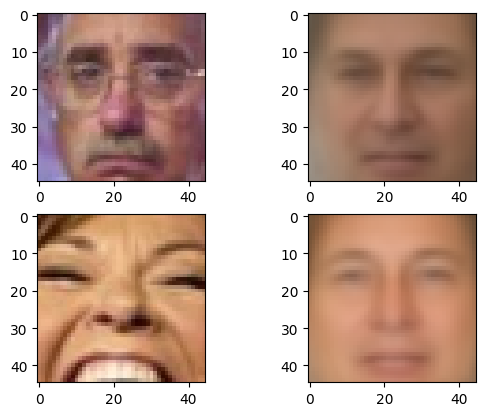

5/5 [==============================] - 1s 289ms/step - loss: 68.9570 - val_loss: 69.3287 - val_reconstruction_loss: 53.2572 - val_kl_loss: 16.0716
Epoch 490/500
5/5 [==============================] - 0s 94ms/step - loss: 67.4280 - val_loss: 68.2596 - val_reconstruction_loss: 52.3388 - val_kl_loss: 15.9208
Epoch 491/500
5/5 [==============================] - ETA: 0s - loss: 66.4487

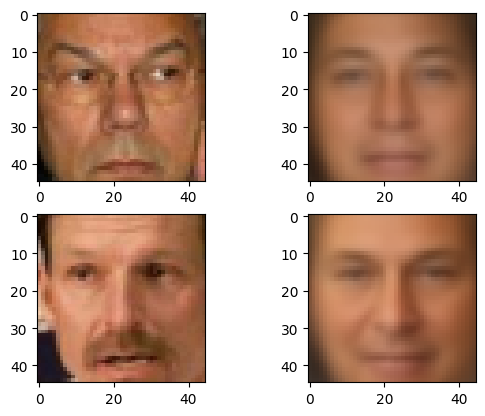

5/5 [==============================] - 1s 274ms/step - loss: 66.4487 - val_loss: 67.9653 - val_reconstruction_loss: 52.1893 - val_kl_loss: 15.7760
Epoch 492/500
5/5 [==============================] - 0s 94ms/step - loss: 66.8819 - val_loss: 68.0534 - val_reconstruction_loss: 52.4015 - val_kl_loss: 15.6519
Epoch 493/500
5/5 [==============================] - ETA: 0s - loss: 67.2226

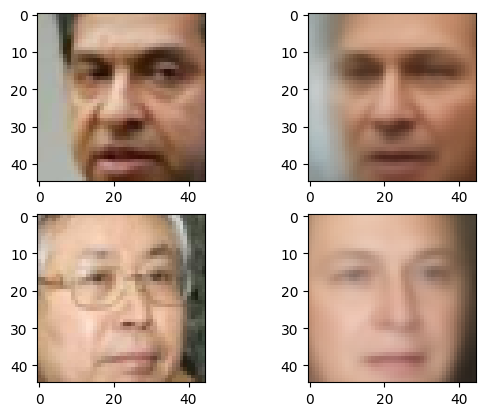

5/5 [==============================] - 1s 271ms/step - loss: 67.2226 - val_loss: 68.0339 - val_reconstruction_loss: 52.3767 - val_kl_loss: 15.6571
Epoch 494/500
5/5 [==============================] - 1s 114ms/step - loss: 66.6198 - val_loss: 67.8745 - val_reconstruction_loss: 51.9152 - val_kl_loss: 15.9594
Epoch 495/500
4/5 [=======================>......] - ETA: 0s - loss: 66.8455

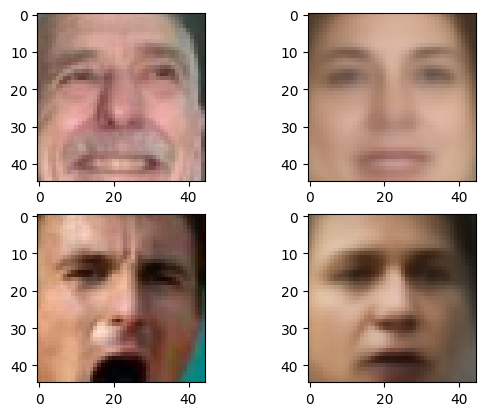

5/5 [==============================] - 1s 260ms/step - loss: 67.3853 - val_loss: 68.0313 - val_reconstruction_loss: 52.2476 - val_kl_loss: 15.7838
Epoch 496/500
5/5 [==============================] - 0s 94ms/step - loss: 66.7757 - val_loss: 68.2414 - val_reconstruction_loss: 52.2499 - val_kl_loss: 15.9915
Epoch 497/500
5/5 [==============================] - ETA: 0s - loss: 68.0997

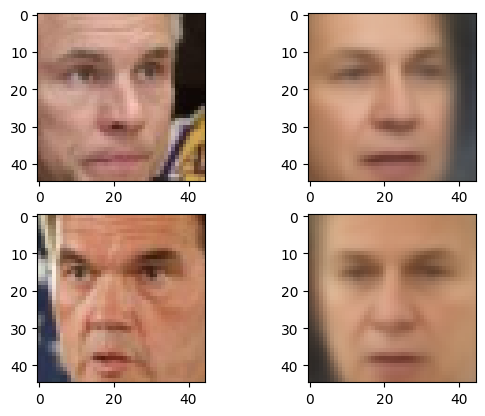

5/5 [==============================] - 1s 266ms/step - loss: 68.0997 - val_loss: 68.0400 - val_reconstruction_loss: 52.2033 - val_kl_loss: 15.8367
Epoch 498/500
5/5 [==============================] - 0s 103ms/step - loss: 67.0444 - val_loss: 68.3848 - val_reconstruction_loss: 52.2887 - val_kl_loss: 16.0961
Epoch 499/500
4/5 [=======================>......] - ETA: 0s - loss: 67.4014

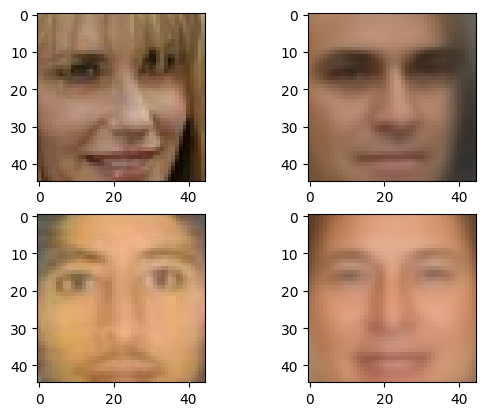

5/5 [==============================] - 1s 263ms/step - loss: 66.5998 - val_loss: 68.1103 - val_reconstruction_loss: 52.3283 - val_kl_loss: 15.7820
Epoch 500/500
5/5 [==============================] - 0s 92ms/step - loss: 67.2773 - val_loss: 68.1870 - val_reconstruction_loss: 52.3166 - val_kl_loss: 15.8705


In [40]:
history = vae.fit(X_train,epochs=500,validation_data = (X_val,X_val), batch_size=2048,callbacks=[callback])

Plot the learning curves

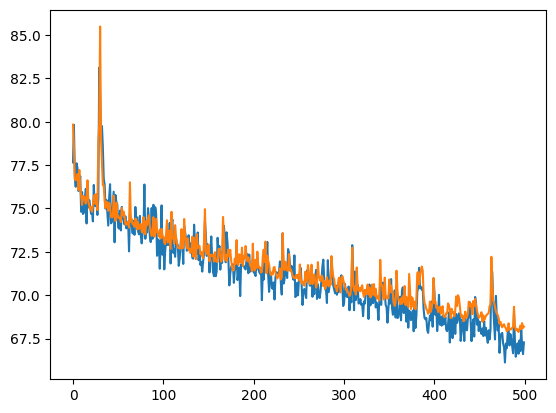

In [41]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

In [ ]:
history.history['loss']

[8.901874542236328,
 8.428140640258789,
 8.7820463180542,
 9.032465934753418,
 8.912059783935547,
 9.285909652709961,
 8.921696662902832,
 9.057804107666016,
 8.820404052734375,
 9.050063133239746,
 8.718453407287598,
 8.490662574768066,
 8.8613862991333,
 8.925926208496094,
 9.275065422058105,
 9.095220565795898,
 9.236995697021484,
 8.763498306274414,
 8.694829940795898,
 8.81197452545166,
 9.315301895141602,
 8.940075874328613,
 8.420492172241211,
 8.711559295654297,
 8.659162521362305,
 8.585858345031738,
 8.657893180847168,
 8.53094482421875,
 9.587240219116211,
 8.744146347045898]

And finally sample from VAE.

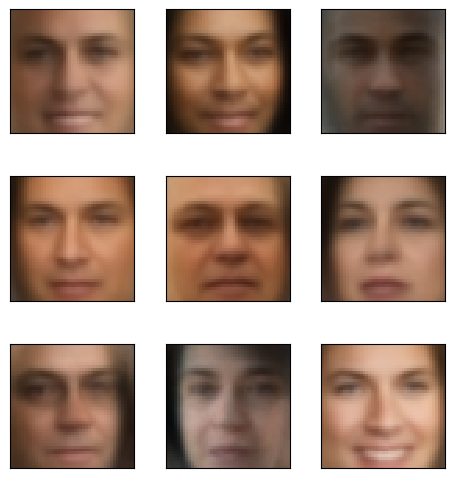

In [46]:
# TODO
# Sample some images from the learned distribution
# 1) Sample z ~ N(0,1)
# 2) Sample from N(decoder_mu(z), decoder_sigma(z))

z = np.random.randn(9,dimZ)
output = decoder(z)
plot_gallery(np.array(output),image_h,image_w,3,3)

In VAE you can truly sample from image distribution $p(x)$, while in AE there is no easy and correct way to do it.

# Bonus

If you managed to tune your autoencoders to converge and learn something about the world, now it's time to make fun out of it. As you may have noticed, there are face attributes in dataset. We're interesting in "Smiling" column, but feel free to try others as well! Here is the first task:

1) Extract the "Smilling" attribute and create a two sets of images: 10 smiling faces and 10 non-smiling ones.

2) Compute latent representations for each image in "smiling" set and average those latent vectors. Do the same for "non-smiling" set. You have found **"vector representation"** of the "smile" and "no smile" attribute.

3) Compute the difference: "smile" vector minus "non-smile" vector.

3) Now check if **"feature arithmetics"** works. Sample a face without smile, encode it and add the diff from p. 3. Check if it works with both AE and VAE.

<img src="linear.png" alt="linear">

In [62]:
sort = attrs.Smiling.argsort()
smiling = sort[-6:]
smiling_pictures = data[smiling]
smiling_pictures = smiling_pictures/ 255


sad = sort[:6]
sad_pictures = data[sad]
sad_pictures = sad_pictures/ 255

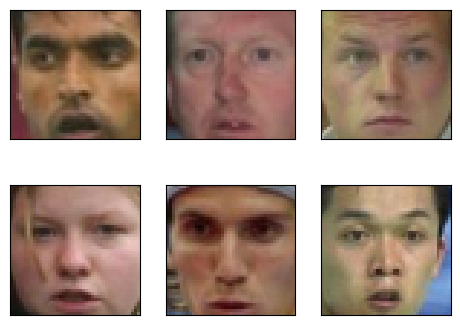

In [63]:
plot_gallery(sad_pictures,image_h,image_w,2,3)

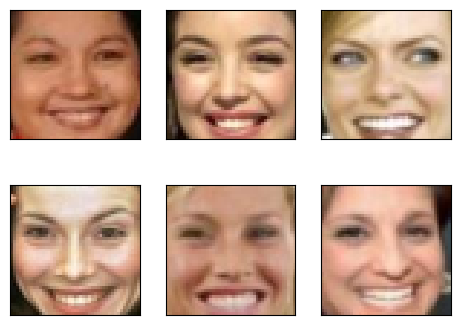

In [65]:
plot_gallery(smiling_pictures,image_h,image_w,2,3)

In [69]:
mean_sm, log_var_sm, z_smile = encoder(smiling_pictures.reshape(6,-1))

In [70]:
mean_sa,log_var_sa,z_sa = encoder(sad_pictures.reshape(6,-1))

In [73]:
z = np.mean(z_smile,axis = 0) - np.mean(z_sa,axis = 0)

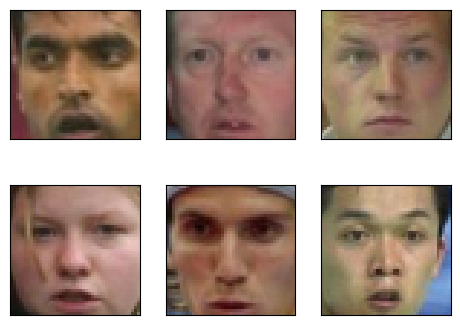

In [76]:
plot_gallery(sad_pictures,image_h,image_w,2,3)

In [77]:
output = decoder(z_smile + z)

In [78]:
output.shape

TensorShape([6, 6075])

In [82]:
faces = np.random.randn(6,dimZ)

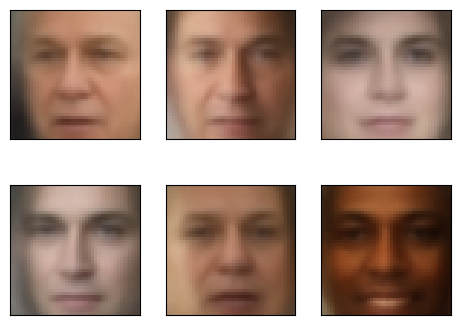

In [84]:
output = decoder(faces)
plot_gallery(np.array(output),image_h,image_w,2,3)

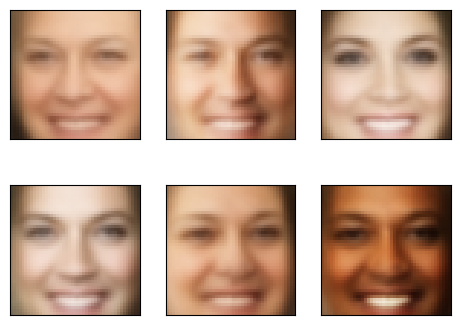

In [85]:
output1 = decoder(faces + z)
plot_gallery(np.array(output1),image_h,image_w,2,3)